# UH-WRRC- ASPA  FloPy model of Tutuila Island

This model is UNDER DEVELOPMENT and is by no means a finished producct!

### Set up cell. Specify modules and paths. hopefully all modules are installed, if not may need to 
- explore the environment.yml file and see if anything is missing from the environment
- explore the local environments to address any issues
- rebuild the environment with environment.yml or manually 

In [130]:
from IPython.display import display, HTML
display(HTML(data="""
<style>
    div#notebook-container { width: 95%;} div#menubar-container { width: 85%; } div#maintoolbar-container { width: 99%; } </style> """))


import os
import sys
import platform
import math
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import flopy
import flopy.utils.binaryfile as bf
from flopy.export.shapefile_utils import shp2recarray
from rasterio import Affine
from flopy.utils.reference import SpatialReference
import shapefile    # not used directly here but for some reason flopy needs this to do shapefile stuff and BTW its not import pyshp as you would think its import shapefile, dumb...
import pandas as pd
import fiona
from rasterio.features import rasterize
import rasterio
import rasterio.mask
import geopandas
from osgeo import gdal

import simplekml
import ogr
from shapely.wkb import loads

from scipy.interpolate import interp2d
import scipy.optimize as opt

GIS_files = os.path.join(".", 'GIS_Data')       # path to the GIS data folder

print(sys.version)
print('numpy version: {}'.format(np.__version__))
print('matplotlib version: {}'.format(mpl.__version__))
print('flopy version: {}'.format(flopy.__version__))

#Set name of MODFLOW exe
#  assumes executable is in users path statement
exe_name = 'mf2005'
if platform.system() == 'Windows':
    exe_name = 'mf2005.exe'

workspace = os.path.join('Flo_py_wrkspace')
#make sure workspace directory exists
if not os.path.exists(workspace):
    os.makedirs(workspace)
    
figurespace = os.path.join(workspace, "Figures")
if not os.path.exists(figurespace):
    os.makedirs(figurespace)

# define some spatial reference objects
WGS84UTM2S_string = 'PROJCS["WGS_1984_UTM_Zone_2S",GEOGCS["GCS_WGS_1984",DATUM["D_WGS_1984",SPHEROID["WGS_1984",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["Degree",0.017453292519943295]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-171],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["Meter",1]]'
model_epsg = 32702   # epsg code specifying coordinate reference system: in this case, UTM zone 2S, WGS 84, A proj4 string has also been fetched from <spatialreference.org> using the supplied epsg code.


3.7.3 | packaged by conda-forge | (default, Jul  1 2019, 22:01:29) [MSC v.1900 64 bit (AMD64)]
numpy version: 1.16.4
matplotlib version: 3.1.1
flopy version: 3.2.12


### Toggles

In [131]:
# in line plotting and saving options. Change these to plot or not to plot inline
Plotnsave_plot = True
Plotnsave_save = True

# flag for either using manually entered values for HK or optomized values. once the optimizer is run the flag will change to true and will use the optimiezd set in memory, run this cell to reset 
optimized_flag = False

# toggle this for interactive plots
%matplotlib inline   
# toggle this for simple plots (nneded for optimization plots)
#   %matplotlib notebook  

pd.set_option('display.max_rows', 75)    # change number of rows to display if want

### model geometry definition 

Shapefile Boundaries: (516771.84375001956, 8410923.999999458, 547311.6875000503, 8425832.999999477)
wrote Flo_py_wrkspace\Model_polyarea.shp
wrote Flo_py_wrkspace\Model_grid.shp


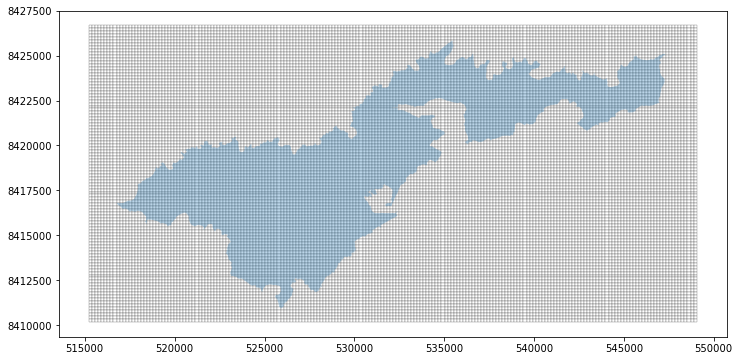

In [132]:
''' Define the number of layers, rows and columns. The heads are computed quasi-steady state (hence a steady MODFLOW run) while
the interface will move. There are three stress periods with a length of 200, 12, and 18 years and
1,000, 120, and 180 steps.'''

ncol = 200
nrow = 100
nlay = 1

# model run times and stress period data
Number_of_years = 400
nper = 1                     # Number of model stress periods (the default is 1)
perlen = [365.25*Number_of_years]               # An array of the stress period lengths in days separated by commas
nstp = [Number_of_years]                        # Number of time steps in each stress period (default is 1).           
tsmult = 1                                   # Time step multiplier 
steady = True
                           
# output control parameters
Save_every_how_many_steps = 20      # elevation of the interface is output every 50 time steps
spd = {}
for istp in range(Save_every_how_many_steps-1, nstp[0]+1, Save_every_how_many_steps):
    spd[(0, istp)] = ['save head', 'print budget']
    spd[(0, istp+1)] = []

'''Specify the cell size along the rows (delr) and along the columns (delc) and the top
and bottom of the aquifer for the DIS package.   Note that this block imports model geometry from a polygon shapefile of the area to model '''

# this cell inports the boundary shapefile to make the model around
ra = shp2recarray(os.path.join(GIS_files, 'tut_poly.shp'))
# these are the bondaries of the shapefile
shp_xmin = ra.geometry[0].bounds[0]
shp_ymin = ra.geometry[0].bounds[1]
shp_xmax = ra.geometry[0].bounds[2]
shp_ymax = ra.geometry[0].bounds[3]
print("Shapefile Boundaries: {}".format(ra.geometry[0].bounds))   
#ra.geometry[0].plot() 

xll = int(shp_xmin-(shp_xmax-shp_xmin)*.05)  # Lower left corner of model grid  (note 5% buffer around boundary)
yll = int(shp_ymin-(shp_ymax-shp_ymin)*.05)   # Lower left corner of model grid  (note 5% buffer around boundary)

# grid spacing as a percentage of model x domain (in model units) note 10% buffer around boundary
delr = abs(int((shp_xmax-shp_xmin)*(1/(ncol*.9))))   # the width of each cell
delc = abs(int((shp_ymax-shp_ymin)*(1/(nrow*.9))))   # the height of eech cell

delr_4_sr  = np.ones(ncol, dtype=float) * delr    # This just puts the above into an array for the sr object 
delc_4_sr = np.ones(nrow, dtype=float) * delc    

rotation = 0      # rotation (positive counterclockwise)


# create the model boundary area polygon
sr = SpatialReference(delr=[delr_4_sr.sum()], delc=[delc_4_sr.sum()], xll=xll, yll=yll, rotation=rotation, proj4_str=WGS84UTM2S_string, lenuni=2) #  # model length units (1 for feet, 2 for meters (default)) (also calculeted uper left corner of model) 
sr.write_shapefile(os.path.join(workspace, 'Model_polyarea.shp'))          # write a shapefile of the model area for later use
prj = open(os.path.join(workspace, 'Model_polyarea.prj'), "w"); prj.write(WGS84UTM2S_string) ; prj.close()     # write the .prj file manually
#print("corners are at {}".format(sr.get_extent()))

# create the model boundary grid polygon   (NOTE THIS MUST OVERWRITE THe PREVIOUS sr. definition!)
sr = SpatialReference(delr=delr_4_sr, delc=delc_4_sr, xll=xll, yll=yll, rotation=rotation, proj4_str= '+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs' , lenuni=2) #  # model length units (1 for feet, 2 for meters (default)) (also calculeted uper left corner of model) 
sr.write_shapefile(os.path.join(workspace, 'Model_grid.shp'))          # write a shapefile of the model grid for later use
prj = open(os.path.join(workspace, 'Model_grid.prj'), "w"); prj.write(WGS84UTM2S_string) ; prj.close()   # write the .prj file manually


if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize=(12,6))
    Tutuila = geopandas.read_file(os.path.join(GIS_files, 'tut_poly.shp'))
    Grid = geopandas.read_file(os.path.join(workspace, 'Model_grid.shp'))
    Grid.plot(ax=ax, facecolor="white", edgecolor="Black", linewidth=.2)
    Tutuila.plot(ax=ax, linewidth=2, alpha = .3)

### Assign Layer elevations all fancy like

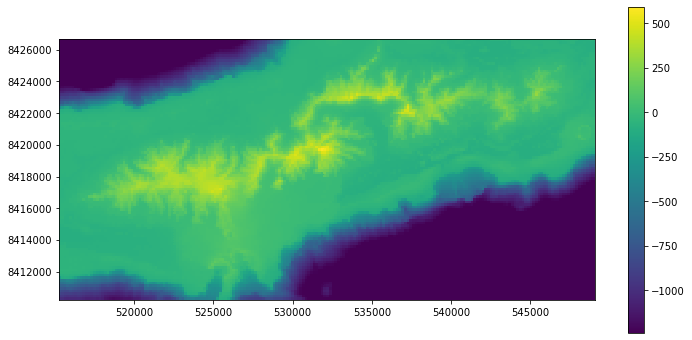

In [204]:
#Set model top to DEM
# Needed to clip the raster to appropriate dimensions, () https://rasterio.readthedocs.io/en/stable/topics/masking-by-shapefile.html)
Raster_2_Clip = os.path.join("..", "..",  'Static_Data_Storage', 'GIS', 'dem10mprj1.tif')
Clipped_raster = os.path.join(workspace, "DEM_10m_clip.asc")

with fiona.open(os.path.join(workspace, 'Model_polyarea.shp'), "r") as shapefile:
    features = [feature["geometry"] for feature in shapefile]
    
with rasterio.open(Raster_2_Clip) as src:
    out_image, out_transform = rasterio.mask.mask(src, features,
                                                        crop=True)
out_meta = src.meta.copy()

out_meta.update({"driver": "AAIGrid",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})
with rasterio.open(Clipped_raster, "w", **out_meta) as dest:
    dest.write(out_image)
    
# Now disect the clipped .asc into a 
Top_raw = np.loadtxt(Clipped_raster, skiprows=7)   # the 7th row was a no data row for some reason not sure why, if another DEM is used might need to skiprows back to 6

y = np.linspace(0, np.shape(Top_raw)[0]-1, np.shape(Top_raw)[0])   
x = np.linspace(0, np.shape(Top_raw)[1]-1, np.shape(Top_raw)[1])

y2 = np.linspace(0, np.shape(y)[0], nrow)   # this defines the number of cells to resample to on the y direction, first number is the original height of the SWB2 recharge map, second number is going to be new height in # of cells
x2 = np.linspace(0, np.shape(x)[0], ncol)   # this defines the number of cells to resample to on the x direction, first number is the original width of the SWB2 recharge map, second number is going to be new width in # of cells

f = interp2d(x, y, Top_raw, kind='cubic')
top = f(x2, y2)

botm = -1250    # this will clearly need to change to accomadate the Tutuila bathymetry
top = np.where(top <= botm+10, botm+10, top) # force top elevations to always be higher than bottom elevations

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(top, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

## Set up an ibound array with land as active, shelf as specified head and offshore as inactive 

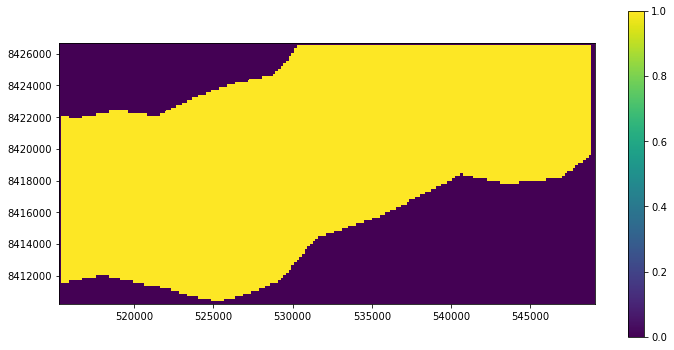

In [251]:
#### Use a Tutuila polygon to define the model active area as the island and the ghb cells as the offshore cells

with fiona.open(os.path.join(GIS_files, 'ibound.shp')) as src:   #    read in Tutuila shapefile
    records = [r for r in src] 
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['spec_hed'])for i, g in enumerate(geoms) ]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)
ibound = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 

# specify initial head 
ihead = np.ones((nlay, nrow, ncol), dtype=np.float)   # ncol
ihead = ihead -.9

#### Use a Tutuila polygon to define the model active area as the island the shelf as specified head, and the offshore as inactive

with fiona.open(os.path.join(GIS_files, 'Tut_poly_for_GHB.shp')) as src:   #    read in Tutuila shapefile 
    records = [r for r in src]   
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['spec_hed']) for i, g in enumerate(geoms)]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)

Spec_hed_map = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 

# final_ibound = Spec_hed_map + ibound                              # include a specified head boundary condition in addition to GHB  #seems to make the output messy if HK in ocean is high
final_ibound =  np.where(ibound== -1, 1, final_ibound)           # GHB condition only no specified head

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(final_ibound, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

### GHB boundary condtion definition

This is the general head boundary condition, Little to no user modification needs to be done to this, except for that fact that I dont exactly know how this works, and why it is not keeping the heads in the GHB area consistent at zero or 1 or whatever.  I think I need to do more research into how to use this module and it may need to be modified somewhat. 

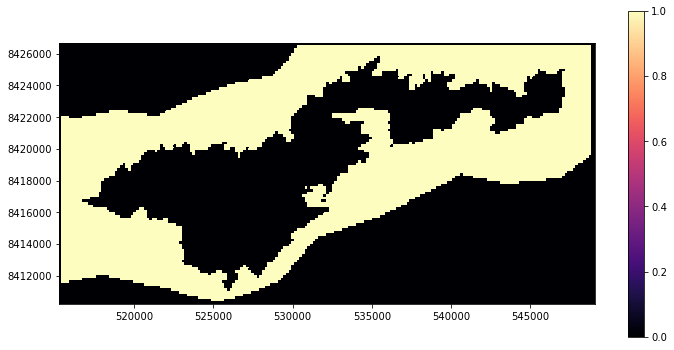

In [252]:
#### Use a Tutuila polygon to define the model active area as the island and the ghb cells as the offshore cells
with fiona.open(os.path.join(GIS_files, 'ibound.shp')) as src:   #    read in Tutuila shapefile
    records = [r for r in src] 
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['Ibound'])for i, g in enumerate(geoms) ]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)

GHB_bound = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 

####Now seting the GHB area  Use a Tutuila polygon to define the model active area as the island and the ghb cells as the offshore cells
with fiona.open(os.path.join(GIS_files, 'Tut_poly_for_GHB.shp')) as src:   #    read in Tutuila shapefile
    records = [r for r in src]   
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['Ibound']) for i, g in enumerate(geoms)]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)

Inverse_GHBmap = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 
neg_array = np.ones((nrow, ncol), dtype=np.int)    # this is the shape array
ghb_geometry = (Inverse_GHBmap+neg_array)*GHB_bound

nghb = np.sum(ghb_geometry)     # this is the total number of General head cells in the model

colcell, rowcell = np.meshgrid(np.arange(0, ncol), np.arange(0, nrow))  # make mesh grid lists of all the dell indexes 

lrchc = np.zeros((nghb, 5))       # layer(int), row(int), column(int), stage(float), conductance(float) array pile this is what ghb package needs
lrchc[:, 0] = 0                                    # give it layer 1
lrchc[:, 1] = rowcell[ghb_geometry == 1]           # assign the specific row numbers for the active ghb cells
lrchc[:, 2] = colcell[ghb_geometry == 1]           # assign the specific col numbers for the active ghb cells
lrchc[:, 3] = .01                                  # this is the starting head value, maybe change to 1?
lrchc[:, 4] = 1000                   # this is conductance values, probably change later
# create ghb dictionary
ghb_data = {0:lrchc}

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(ghb_geometry, ax=ax, cmap = 'magma')
    ax.set_aspect(1); plt.colorbar(qm)

### Water level Observations
These observations are from a text file in the array inputs folder. New water level observations can simply be added to this text file. 
It would be idea for the user to save the new text file to a new name when adding obaservations, in this case the line below: 
    
    "Unique_frame = pd.read_csv(os.path.join('.',  "Array_inputs", 'Observation_data.txt'))"
    
will need to change to reflect tne new observation file name

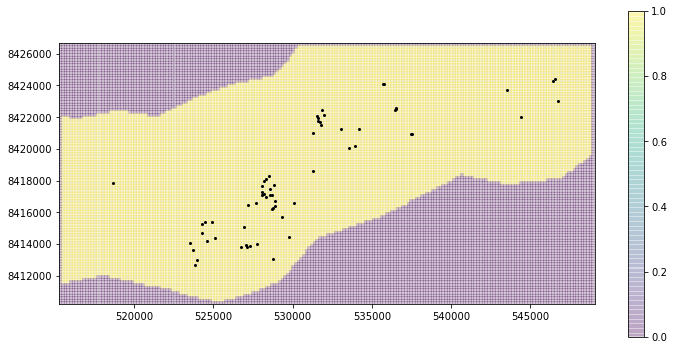

In [253]:
Pdevel_WLs = pd.read_csv(os.path.join("..", "..", 'Static_Data_Storage', 'GIS','Predevelop_WLs_2.csv'))

Pdevel_WLs['row_num'] = Pdevel_WLs['x_utm'].apply(lambda x_utm_val: math.ceil((x_utm_val-xll)/delr) )          # this formula calculates the column number based on the x coordinate 
Pdevel_WLs['col_num'] = Pdevel_WLs['y_utm'].apply(lambda y_utm_val: (1+nrow)-math.ceil((y_utm_val-yll)/delc) )   # this formula calculates the row number based on the y coordinate 
Pdevel_WLs['rowcol']  = list(zip(Pdevel_WLs.row_num, Pdevel_WLs.col_num))                                      # just make a tuplel of the row and col

# This takes obs wells that occupy the same cell and averages them! 
Unique_WLs = Pdevel_WLs.groupby('rowcol', as_index=False).mean()                                               # Average the duplicate WLs that fall into a single cell, to get one "observed" water level for that cell 

# make new unique names for each obs point
Unique_WLs["name"] = "Obs_"+Unique_WLs.index.map(str)

nobs = len(Unique_WLs['WL_m_MSL']) 
layervals = [0] * nobs
rowvals = list(Unique_WLs['col_num'].astype(int))
colvals = list(Unique_WLs['row_num'].astype(int))
obsvals = list(Unique_WLs['WL_m_MSL'])
obsnames = list(Unique_WLs["name"])

if Plotnsave_plot: 
    gdf = geopandas.GeoDataFrame(Unique_WLs, geometry=geopandas.points_from_xy(Unique_WLs.x_utm, Unique_WLs.y_utm))
    fig, ax = plt.subplots(figsize = (12,6))
    Grid.plot(ax=ax, facecolor="white", edgecolor="Black", linewidth=.2, alpha = .2)
    qm = sr.plot_array(final_ibound, ax=ax, alpha = .2)
    ax.set_aspect(1); plt.colorbar(qm)
    gdf.plot(ax=ax, color='black', markersize=4)

### Hydraulic condictivty assigned based on zones as defined by shapefiles in a folder

The values at the top of this cell can be modified to change the conductivity in each zone

In [254]:
# this cell either uses the below values or the optimized values for the forward run depending on if the optimizer has been run
Manual_values = [15.60906857, 184.89860934,   7.63843596,   0.84151735,   0.76703913,  2.07640442]

if optimized_flag == True:
    HK_values = results.x
    print("Using: optimized values {}".format(HK_values))
    
else:
    HK_values = Manual_values
    print("Using: manual HK values")

Using: manual HK values


In [255]:
# Function to rasterize the HK zones: 
def rastah_zone(shp):
    with fiona.open(shp) as src:   #    read in Tutuila shapefile
            records = [r for r in src]   
    geoms = [r['geometry'] for r in records]       # shapefile shape
    attr = [r['properties'] for r in records]      # shapefile attributes
    geoms = [(g, attr[i]['par_code']) for i, g in enumerate(geoms)]              # select the attribute to map onto the raster grid
    # affine: work with the geometry to change from raster to grid reference frame 
    trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)
    Outrastah = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 
    return Outrastah

# path to the location of shapefiles
HK_Zone_path = os.path.join(GIS_files, "Simple_2")

# Rasterize the desired zones
Leone = rastah_zone(os.path.join(HK_Zone_path, 'Leone.shp'))
Tafuna = rastah_zone(os.path.join(HK_Zone_path, 'tafuna.shp'))
Pyro = rastah_zone(os.path.join(HK_Zone_path, 'pyro.shp'))
OldV_tapu = rastah_zone(os.path.join(HK_Zone_path, 'OldV_tapu.shp'))
OldV_Pago = rastah_zone(os.path.join(HK_Zone_path, 'OldV_Pago.shp'))
Malaeimi = rastah_zone(os.path.join(HK_Zone_path, 'Malaeimi.shp'))

HK_raster  = Leone + Tafuna + Pyro + OldV_tapu + OldV_Pago + Malaeimi  # merge all zones together

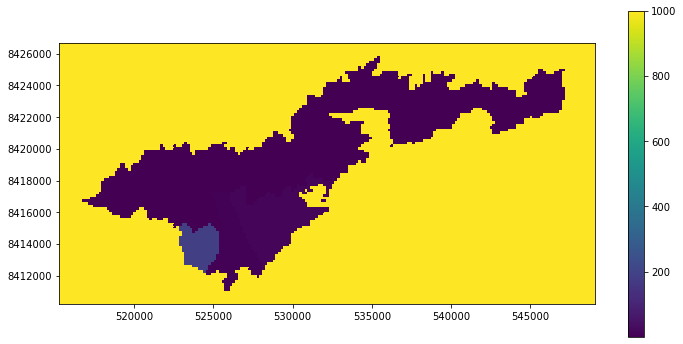

In [256]:
# set the  values

Taf_HK = HK_values[0]
Leo_HK = HK_values[1]
Pyro_HK = HK_values[2]
OVtap_HK = HK_values[3] 
OVpag_HK = HK_values[4]
Malaeimi_HK = HK_values[5]

# replace codes with actual HK values 
HK_raster = np.where(HK_raster== -10, Taf_HK, HK_raster) 
HK_raster = np.where(HK_raster== -20, Leo_HK, HK_raster)
HK_raster = np.where(HK_raster== -30, Pyro_HK, HK_raster)
HK_raster = np.where(HK_raster== -60, OVtap_HK, HK_raster)
HK_raster = np.where(HK_raster== -80, OVpag_HK, HK_raster)
HK_raster = np.where(HK_raster== -40, Malaeimi_HK, HK_raster)

HK_raster = np.where(HK_raster== 0, 1000, HK_raster)   # this is for the areas not covered by HK zones, Should not actually maatter at all!

HK_raster = np.where(HK_raster== -90, 1, HK_raster) # this is for the areas that get messed up somehow
HK_raster = np.where(HK_raster== -70, 1, HK_raster) # this is for the areas that get messed up somehow

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(HK_raster, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

'''Define the layers to be confined and define the horizontal and vertical 
hydraulic conductivity of the aquifer for the LPF package.'''

# lpf data
laytyp = 0
vka = 10

### Import Recharge .asc from SWB output into MODFLOW rech array
(note I am not sure what happens when the model area is bigger then the raster....)

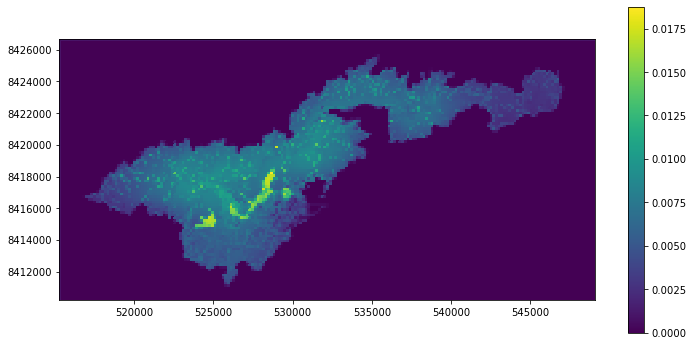

In [257]:
SWB_output_recharge = os.path.join("..", "..", "..", 'ASPA-UH-SWB2_REPO\\output\\post_prcessed_with_MFR\\net_infiltration_annual.asc')  

# Needed to clip the raster to appropriate dimensions, () https://rasterio.readthedocs.io/en/stable/topics/masking-by-shapefile.html)   
Raster_2_Clip = os.path.join(SWB_output_recharge)
Clipped_raster = os.path.join(workspace, "raw_net_infiltration_clip.asc")

with fiona.open(os.path.join(workspace, 'Model_polyarea.shp'), "r") as shapefile:
    features = [feature["geometry"] for feature in shapefile]
    
with rasterio.open(Raster_2_Clip) as src:
    out_image, out_transform = rasterio.mask.mask(src, features, crop=True)
    
out_meta = src.meta.copy()
out_meta.update({"driver": "AAIGrid",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open(Clipped_raster, "w", **out_meta) as dest:          # create the new clipped .asc file
    dest.write(out_image)
    
# Now disect the clipped .asc into a 
recharge_raw_SWB = np.loadtxt(Clipped_raster, skiprows=6)

y = np.linspace(0, np.shape(recharge_raw_SWB)[0]-1, np.shape(recharge_raw_SWB)[0])   
x = np.linspace(0, np.shape(recharge_raw_SWB)[1]-1, np.shape(recharge_raw_SWB)[1])

y2 = np.linspace(0, np.shape(y)[0], nrow)   # this defines the number of cells to resample to on the y direction, first number is the original height of the SWB2 recharge map, second number is going to be new height in # of cells
x2 = np.linspace(0, np.shape(x)[0], ncol)   # this defines the number of cells to resample to on the x direction, first number is the original width of the SWB2 recharge map, second number is going to be new width in # of cells

f = interp2d(x, y, recharge_raw_SWB, kind='linear')
recharge_resampled = f(x2, y2)
recharge_converted =  recharge_resampled* (0.0254/365)   # recharge comes out of SWB in inches/year and needs to be converted to m/day

recharge_converted = np.where(recharge_converted < 0, 0.001, recharge_converted)   # Interpolation made some negative values, fix that issue by setting them to a positive value

rch_data = {0: recharge_converted}   # dictionary form to specify that it is only on first layer

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(recharge_converted, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)

### SWI saltwater intruction package, basic parameters

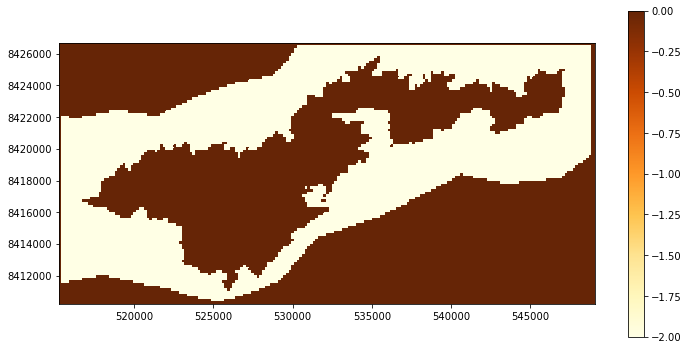

In [261]:
### SWI saltwater intruction package, basic parameters

Make_iso_tricky = Spec_hed_map + ibound

# swi2 data
nadptmx = 10      #    user-defined maximum number of SWI2 time steps in any MODFLOW time step.
nadptmn = 1        # the user-defined minimum number of SWI2 time steps in any MODFLOW time step
nu = [0, 0.025]    # dimensionless density at the top of zone 1 and the dimensionless densities of the surface ???
numult = 5.0
toeslope = nu[1] / numult  #0.005
tipslope = nu[1] / numult  #0.005
z1 = 0 * np.ones((nrow, ncol))
z1[final_ibound == 1] = -.5
z = np.array([[z1]])
iso = np.zeros((nlay, nrow, ncol), dtype=np.int)
iso[0][Make_iso_tricky == -1] = -2

ssz=0.2            # effectve porosity

nsrf = 1  # one freshwater zone and one seawater zone, separated by a single (nsrf = 1) active ZETA surface between the zones

istrat = 1   # Represent Fluid density using the stratified option




# swi2 observations  looks like this is observatons at the well, lets disculde this for now
# obsnam = ['layer1_', 'layer2_']
# obslrc=[[0, 30, 35], [1, 30, 35]]
# nobs = len(obsnam)
# iswiobs = 1051




fig, ax = plt.subplots(figsize = (12,6))
qm = sr.plot_array(iso[0], ax=ax, cmap = 'YlOrBr')
ax.set_aspect(1); plt.colorbar(qm)

## Build model object - pre-prcess all files 

In [262]:
modelname = 'modelface'

ml = flopy.modflow.Modflow(modelname, version='mf2005', exe_name=exe_name, model_ws=workspace, verbose=False)

discret = flopy.modflow.ModflowDis(ml, nlay=nlay, nrow=nrow, ncol=ncol, laycbd=0,
                                   delr=delr, delc=delc, top=top, botm=botm,
                                   nper=nper, perlen=perlen, nstp=nstp, tsmult=tsmult)

bas = flopy.modflow.ModflowBas(ml, ibound=final_ibound, strt=ihead)

lpf = flopy.modflow.ModflowLpf(ml, laytyp=laytyp, hk=HK_raster, vka=vka)

rch = flopy.modflow.ModflowRch(ml, rech=rch_data)

oc = flopy.modflow.ModflowOc(ml, stress_period_data=spd)

pcg = flopy.modflow.ModflowPcg(ml, hclose=1.0e-6, rclose=3.0e-3, mxiter=100, iter1=50)

ghb = flopy.modflow.ModflowGhb(ml, stress_period_data=ghb_data)


#SWI package
swi = flopy.modflow.ModflowSwi2(ml, nsrf=nsrf, istrat=istrat , toeslope=toeslope, tipslope=tipslope, 
                                nu=nu,zeta=z, ssz=ssz, isource=iso, nsolver=1,
                                nadptmx=nadptmx, nadptmn=nadptmn, iswizt=55)


# water level observations
obs_data= []
for i in range(0,nobs):
    obs = flopy.modflow.HeadObservation(ml, obsname=obsnames[i], layer=layervals[i], row=rowvals[i], column=colvals[i], time_series_data=[[0,obsvals[i]]])
    obs_data.append(obs)
hob = flopy.modflow.ModflowHob(ml, iuhobsv = 7, hobdry=-999, obs_data = obs_data)

In [263]:
ml.check()


modelface MODEL DATA VALIDATION SUMMARY:
  2 Warnings:
    OC package: action(s) defined in OC stress_period_data ignored as they are not part the stress periods defined by DIS
    RCH package: Mean R/T ratio < checker warning threshold of 2e-08 for 1 stress periods

  Checks that passed:
    Compatible solver package
    Unit number conflicts
    DIS package: zero or negative thickness
    DIS package: thin cells (less than checker threshold of 1.0)
    DIS package: nan values in top array
    DIS package: nan values in bottom array
    BAS6 package: isolated cells in ibound array
    BAS6 package: Not a number
    LPF package: zero or negative horizontal hydraulic conductivity values
    LPF package: zero or negative vertical hydraulic conductivity values
    LPF package: negative horizontal anisotropy values
    LPF package: horizontal hydraulic conductivity values below checker threshold of 1e-11
    LPF package: horizontal hydraulic conductivity values above checker threshold of 

### Run MODFLOW

In [264]:
ml.write_input()
ml.run_model(silent=False)

FloPy is using the following  executable to run the model: .\mf2005.exe

                                  MODFLOW-2005     
    U.S. GEOLOGICAL SURVEY MODULAR FINITE-DIFFERENCE GROUND-WATER FLOW MODEL
                             Version 1.12.00 2/3/2017                        

 Using NAME file: modelface.nam 
 Run start date and time (yyyy/mm/dd hh:mm:ss): 2019/08/01 16:24:02

 Solving:  Stress period:     1    Time step:     1    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     2    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     3    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     4    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     5    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     6    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     7    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     8    Ground-Water Flo

 Solving:  Stress period:     1    Time step:   102    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   103    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   104    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   105    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   106    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   107    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   108    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   109    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   110    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   111    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   112    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   113    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   114    Ground-Wa

 Solving:  Stress period:     1    Time step:   210    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   211    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   212    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   213    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   214    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   215    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   216    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   217    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   218    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   219    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   220    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   221    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   222    Ground-Wa

 Solving:  Stress period:     1    Time step:   318    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   319    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   320    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   321    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   322    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   323    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   324    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   325    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   326    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   327    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   328    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   329    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   330    Ground-Wa

(True, [])

C:\Users\cshuler\Anaconda3\envs\ASPA_Framework\lib\site-packages\flopy\plot\map.py:1356: PendingDeprecationWarning: ModelMap will be replaced by PlotMapView(); Calling PlotMapView()
  warnings.warn(err_msg, PendingDeprecationWarning)


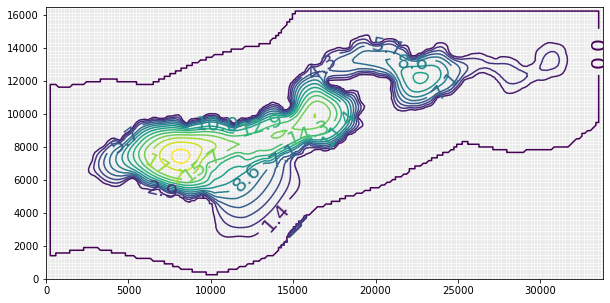

In [265]:
# Post process to graph the results

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1, 1, 1, aspect='equal')

#FV grid extent: (delr/2., Lx - delr/2., delc/2., Ly - delc/2.)
#wpt = ((wcol+0.5)*delr, Lx - ((wrow + 0.5)*delc)) # origing at low upper.. b

hds = bf.HeadFile(os.path.join(workspace, '{}.hds'.format(modelname)))
times = hds.get_times() # simulation time, steady state
head = hds.get_data(totim=times[-1])

##cbb = bf.CellBudgetFile(os.path.join(workspace, '{}.cbc'.format(modelname))) # read budget file
#kstpkper_list = cbb.get_kstpkper()
# cbb.textlist to get a list of data texts
##frf = cbb.get_data(text='FLOW RIGHT FACE', totim=times[-1])[0]
##fff = cbb.get_data(text='FLOW FRONT FACE', totim=times[-1])[0]

# flopy plot object
modelmap = flopy.plot.ModelMap(model=ml, layer=0)
# plot grid
lc = modelmap.plot_grid(alpha=.1) # grid
# plot contour
cs = modelmap.contour_array(head, levels=np.linspace(0, int(head.max()), 15)) # head contour
plt.clabel(cs, fontsize=20, fmt='%1.1f') # contour label
# plot discharge quiver
##quiver = modelmap.plot_discharge(frf, fff, head=head, alpha=.4)

plt.show()


## Observed vs Simulated plot

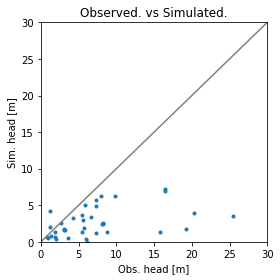

Mean Error: -5.64
Mean Absolute Error: 5.75
RMS Error: 10.86


In [266]:
# plot observations 
observations = np.loadtxt(os.path.join(workspace, '{}.hob.out'.format(modelname)), skiprows=1, usecols=[0,1])      # this block extracts observation data at each well field and determines what the maximum residual at any of the given points is
comp_obs = np.ravel(np.split(observations, 2, 1)[0]) # the computed hed values at the obspts
obs_obs = np.ravel(np.split(observations, 2, 1)[1]) # the observed hed values at the obspts

# note positive residuals means model is calculating too high negative is model calculates too low 
residuals = []
for idx, i in enumerate(observations):   
    r = observations[idx][0]-observations[idx][1]
    residuals.append(r)

Howd_we_do = pd.DataFrame({"Obs_hed_m":obs_obs,"Comp_hed_m":comp_obs,"Residual_m":residuals})

fig = plt.figure(figsize=(4,4))
plt.title('Observed. vs Simulated.')
plt.plot(Howd_we_do["Obs_hed_m"], Howd_we_do["Comp_hed_m"], '.')
#plt.axis('equal')
#plt.axis('square')
plt.xlabel("Obs. head [m]")
plt.ylabel('Sim. head [m]')
plt.ylim(0,30)
plt.xlim(0,30)

plt.plot([0,20,30],[0,20,30], color= "grey")
plt.tight_layout()
plt.savefig(os.path.join(figurespace, "calibration_result.pdf"))

plt.show()

me = np.mean(Howd_we_do.Residual_m)
mea = np.mean(np.abs(Howd_we_do.Residual_m))
rmse = np.sqrt(np.mean(Howd_we_do.Residual_m**2))
print ('Mean Error: {:.2f}\nMean Absolute Error: {:.2f}\nRMS Error: {:.2f}'.format(me, mea, rmse))

# plot SWI

In [267]:
# read base model zeta
zfile = flopy.utils.CellBudgetFile(os.path.join(ml.model_ws, modelname+'.zta'))   # read the raw data file produced by MODFLOW SWI2
kstpkper = zfile.get_kstpkper()                                                   # Get a list of unique stress periods and time steps in the file (timestep, stress period) 
zeta = []
for kk in kstpkper:
    zeta.append(zfile.get_data(kstpkper=kk, text='ZETASRF  1')[0])                # turn each surface into an array  Actually a Time x Layer x Col x Row array
zeta = np.array(zeta)

### Plot  E-W cross section

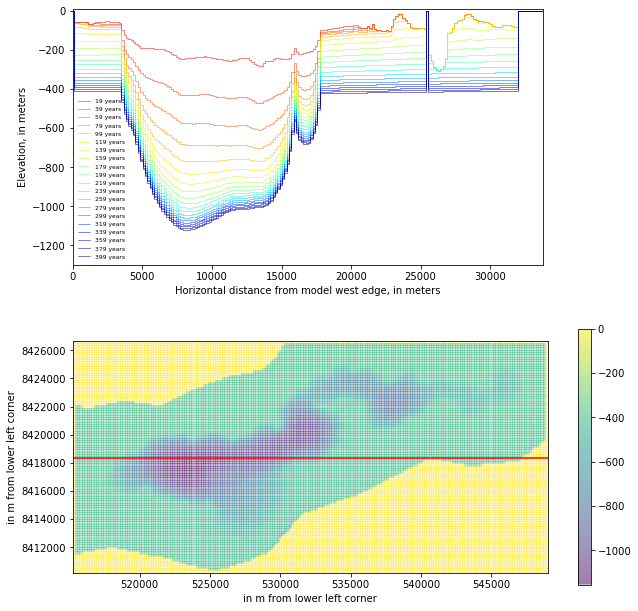

In [268]:
slicerow = 50

plt.rcParams.update({'legend.fontsize': 6, 'legend.frameon' : False})
fig = plt.figure(figsize=(10, 10), facecolor='w')
flft, frgt, fbot, ftop = 0.125, 0.95, 0.125, 0.925
fig.subplots_adjust(wspace=0.25, hspace=0.25, left=flft, right=frgt, bottom=fbot, top=ftop)

# Create arrays for cross section plotting the x-coordinates and the output years
xcell = np.linspace(0,ncol*delr,ncol)    

# extract years from the zeta array
years=[]                                      # as long as the time step is a 365.25 multiple of the stress period length otherwise this gets arbitrary!
for idx,val in enumerate(kstpkper):
    printyear = round(kstpkper[idx][0] ,1)
    years.append(printyear)
    
# line color definition  (tricky way to cycle through the colorramp)
icolor = len(years)
colormap = plt.cm.jet  #winter
cc = []
cr = np.linspace(0.9, 0.0, icolor)
for idx in cr:
    cc.append(colormap(idx))

# plot cross section
ax = plt.subplot2grid((2, 5), (0, 0), colspan=4)       # have to set up many subplot grid spots then span each plot different ammount cuz the colorbar makes it so the bottom plot doesnt line up (this took 1.5 hours of my life)
# axes limits
ax.set_xlim(0, ncol*delr)
ax.set_ylim(-1300, 10)
for idx in range(len(years)):
    ax.plot(xcell, zeta[idx, 0, slicerow, : ], drawstyle='steps-mid',                                # zeta[idx, 0, 50, :] means idx = timestep,  0 is layer 1 , # is row number to plot along, and : is plot all columns 
            linewidth=0.5, color=cc[idx], label='{:2d} years'.format(years[idx]))
# legend
plt.legend(loc='lower left')
# axes labels and text
ax.set_xlabel('Horizontal distance from model west edge, in meters')
ax.set_ylabel('Elevation, in meters')


# plan view figure 
ax2 = plt.subplot2grid((2, 5), (1, 0), colspan=5)
qm = sr.plot_array(zeta[-1][0], ax=ax2, alpha = .3)

ax2.set_aspect(1); plt.colorbar(qm)
ax2.set_xlabel("in m from lower left corner")
ax2.set_ylabel("in m from lower left corner")
ax2.set_xlim(sr.get_extent()[0], sr.get_extent()[1])
ax2.set_ylim(sr.get_extent()[2], sr.get_extent()[3])


x = np.linspace(0, ncol*delr, ncol)+sr.get_extent()[0]
y = np.ones(ncol)*np.linspace(nrow*delc,0, nrow)[slicerow]+sr.get_extent()[2]

ax2.plot(x,y, color = 'r')
plt.show()

# Scale the axes to have same units as the cross section plot
xtic_vals = ax2.get_xticks()
scale_ax2x = ax2.set_xticklabels(['{:1.0f}'.format(x -516771) for x in xtic_vals])
ytic_vals = ax2.get_yticks()
scale_ax2y = ax2.set_yticklabels(['{:1.0f}'.format(x -8410924) for x in ytic_vals])

### Plot  N-S cross section


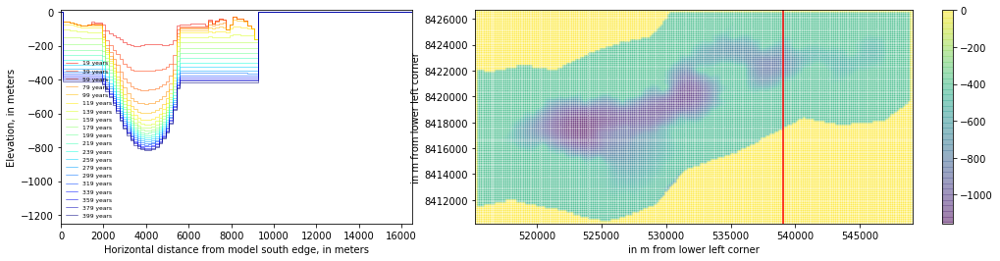

In [269]:
slicecol = 140

plt.rcParams.update({'legend.fontsize': 6, 'legend.frameon' : False})
fig = plt.figure(figsize=(20, 4), facecolor='w')

# Create arrays for cross section plotting the y-coordinates and the output years
#xcell = np.linspace(0,ncol*delr,200)    
xcell = np.linspace(0,nrow*delc,nrow)     

# extract years from the zeta array
years=[]                                      # as long as the time step is a 365.25 multiple of the stress period length otherwise this gets arbitrary!
for idx,val in enumerate(kstpkper):
    printyear = round(kstpkper[idx][0] ,1)
    years.append(printyear)
    
# line color definition  (tricky way to cycle through the colorramp)
icolor = len(years)
colormap = plt.cm.jet  #winter
cc = []
cr = np.linspace(0.9, 0.0, icolor)
for idx in cr:
    cc.append(colormap(idx))

# plot cross section
ax = plt.subplot2grid((1, 9), (0, 0), colspan=3) 
ax.set_xlim(0, nrow*delc)
ax.set_ylim(-1250, 10)
for idx in range(len(years)):
    ax.plot(xcell, zeta[idx, 0, :, slicecol ], drawstyle='steps-mid',                                # zeta[idx, 0, 50, :] means idx = timestep,  0 is layer 1 , # is row number to plot along, and : is plot all columns 
            linewidth=0.5, color=cc[idx], label='{:2d} years'.format(years[idx]))
# legend
plt.legend(loc='lower left')
# axes labels and text
ax.set_xlabel('Horizontal distance from model south edge, in meters')
ax.set_ylabel('Elevation, in meters')


# plan view figure 
ax2 = plt.subplot2grid((1, 9), (0, 3), colspan=5)
qm = sr.plot_array(zeta[-1][0], ax=ax2, alpha = .3)

ax2.set_aspect(1); plt.colorbar(qm)
ax2.set_xlabel("in m from lower left corner")
ax2.set_ylabel("in m from lower left corner")
ax2.set_xlim(sr.get_extent()[0], sr.get_extent()[1])
ax2.set_ylim(sr.get_extent()[2], sr.get_extent()[3])

y = (np.linspace(0, nrow*delc, nrow) )+ sr.get_extent()[2]
x = np.ones(nrow)*np.linspace(0, ncol*delr,ncol)[slicecol]+sr.get_extent()[0]

ax2.plot(x,y, color = 'r')
plt.show()

# Scale the axes to have same units as the cross section plot
xtic_vals = ax2.get_xticks()
scale_ax2x = ax2.set_xticklabels(['{:1.0f}'.format(x -516771) for x in xtic_vals])
ytic_vals = ax2.get_yticks()
scale_ax2y = ax2.set_yticklabels(['{:1.0f}'.format(abs(x -sr.get_extent()[3])) for x in ytic_vals])

C:\Users\cshuler\Anaconda3\envs\ASPA_Framework\lib\site-packages\flopy\plot\crosssection.py:764: PendingDeprecationWarning: ModelCrossSection will be replaced by PlotCrossSection(), Calling PlotCrossSection()
  warnings.warn(err_msg, PendingDeprecationWarning)


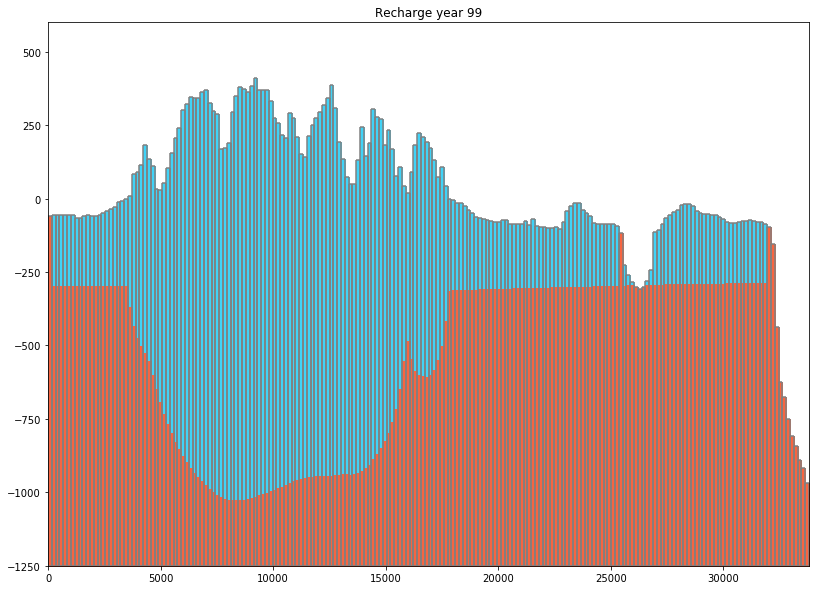

In [270]:
fig = plt.figure(figsize=(30, 10))
colors = ['#40d3f7', '#F76541']

ax = fig.add_subplot(1, 2, 1)
modelxsect = flopy.plot.ModelCrossSection(model=ml, line={'Row': slicerow}, extent=(0, (delr*ncol), -1250, 600))
modelxsect.plot_fill_between(zeta[11, :, :, :], colors=colors, ax=ax, edgecolors='none')
linecollection = modelxsect.plot_grid(ax=ax)
ax.set_title('Recharge year {}'.format(years[4]));

# Optimization Function

In [272]:
def calibrateo(params):
    Taf_HK, Leo_HK, Pyro_HK, OVtap_HK, OVpag_HK, Malaeimi_HK = params   
    
#    Taf_HK = 1000;    Leo_HK = 500;  Pyro_HK = 200;   OVtap_HK = .1;  OVpag_HK = .1
    Ocean_HK_Val  = 1000

    # path to the location of shapefiles
    HK_Zone_path = os.path.join(GIS_files, "Simple_2")

    # Rasterize the desired zones
    Leone = rastah_zone(os.path.join(HK_Zone_path, 'Leone.shp'))
    Tafuna = rastah_zone(os.path.join(HK_Zone_path, 'tafuna.shp'))
    Pyro = rastah_zone(os.path.join(HK_Zone_path, 'pyro.shp'))
    OldV_tapu = rastah_zone(os.path.join(HK_Zone_path, 'OldV_tapu.shp'))
    OldV_Pago = rastah_zone(os.path.join(HK_Zone_path, 'OldV_Pago.shp'))
    Malaeimi = rastah_zone(os.path.join(HK_Zone_path, 'Malaeimi.shp'))

    HK_raster  = Leone + Tafuna + Pyro + OldV_tapu + OldV_Pago + Malaeimi  # merge all zones together   
    
    
    # replace codes with actual HK values 
    HK_raster = np.where(HK_raster== -10, Taf_HK, HK_raster) 
    HK_raster = np.where(HK_raster== -20, Leo_HK, HK_raster)
    HK_raster = np.where(HK_raster== -30, Pyro_HK, HK_raster)
    HK_raster = np.where(HK_raster== -60, OVtap_HK, HK_raster)
    HK_raster = np.where(HK_raster== -80, OVpag_HK, HK_raster)
    HK_raster = np.where(HK_raster== -40, Malaeimi_HK, HK_raster)

    HK_raster = np.where(HK_raster== 0, Ocean_HK_Val, HK_raster)   # this is for the areas not covered by HK zones, 

    HK_raster = np.where(HK_raster== -90, 1, HK_raster) # this is for the areas that get messed up somehow
    
    
    # create new FloPy instance of the model ( but using the variables from above)
    
    modelname = 'modelface_OPT'

    ml_OPT = flopy.modflow.Modflow(modelname, version='mf2005', exe_name=exe_name, model_ws=workspace, verbose=False)
    
    # steady state model run times
    nper = 1                     # Number of model stress periods (the default is 1)
    perlen = [3650]              # An array of the stress period lengths in days separated by commas
    nstp = [1]      # Number of time steps in each stress period (default is 1).
    save_head = [3650]
    steady = True


    discret = flopy.modflow.ModflowDis(ml_OPT, nlay=nlay, nrow=nrow, ncol=ncol, laycbd=0,
                                       delr=delr, delc=delc, top=top, botm=botm,
                                       nper=nper, perlen=perlen, nstp=nstp, tsmult=tsmult)
    bas = flopy.modflow.ModflowBas(ml_OPT, ibound=final_ibound, strt=ihead)
    lpf = flopy.modflow.ModflowLpf(ml_OPT, laytyp=laytyp, hk=HK_raster, vka=vka)
    rch = flopy.modflow.ModflowRch(ml_OPT, rech=rch_data)
    oc = flopy.modflow.ModflowOc(ml_OPT, stress_period_data=spd)
    pcg = flopy.modflow.ModflowPcg(ml_OPT, hclose=1.0e-6, rclose=3.0e-3, mxiter=100, iter1=50)
    ghb = flopy.modflow.ModflowGhb(ml_OPT, stress_period_data=ghb_data)
    
    # water level observations
    obs_data= []
    for i in range(0,nobs):
        obs = flopy.modflow.HeadObservation(ml_OPT, obsname=obsnames[i], layer=layervals[i], row=rowvals[i], column=colvals[i], time_series_data=[[0,obsvals[i]]])
        obs_data.append(obs)
    hob = flopy.modflow.ModflowHob(ml_OPT, iuhobsv = 7, hobdry=-999, obs_data = obs_data)

    # Run da model 

    ml_OPT.write_input()
    ml_OPT.run_model(silent=True)


    # post process observations 
    observations = np.loadtxt(os.path.join(workspace, '{}.hob.out'.format(modelname)), skiprows=1, usecols=[0,1])      # this block extracts observation data at each well field and determines what the maximum residual at any of the given points is
    comp_obs = np.ravel(np.split(observations, 2, 1)[0]) # the computed hed values at the obspts
    obs_obs = np.ravel(np.split(observations, 2, 1)[1]) # the observed hed values at the obspts

    # note positive residuals means model is calculating too high negative is model calculates too low 
    residuals = []
    for idx, i in enumerate(observations):   
        r = observations[idx][0]-observations[idx][1]
        residuals.append(r)

    Howd_we_do = pd.DataFrame({"Obs_hed_m":obs_obs,"Comp_hed_m":comp_obs,"Residual_m":residuals})
    # error metrics
    me = np.mean(Howd_we_do.Residual_m)
    mea = np.mean(np.abs(Howd_we_do.Residual_m))
    rmse = np.sqrt(np.mean(Howd_we_do.Residual_m**2))
    
#############  Plot the OBS plot if want This can be moved down to utilities when not in use
    fig = plt.figure(figsize=(4,4))
    plt.title('Observed. vs Simulated.')
    plt.plot(Howd_we_do["Obs_hed_m"], Howd_we_do["Comp_hed_m"], '.')
    #plt.axis('equal')
    #plt.axis('square')
    plt.xlabel("Obs. head [m]")
    plt.ylabel('Sim. head [m]')
    plt.ylim(0,30)
    plt.xlim(0,30)
    plt.plot([0,20,30],[0,20,30], color= "grey")
    plt.tight_layout()
    plt.savefig("cal.pdf")
    plt.show()
############    

    print("Error is - {}".format(rmse))
    print("Params are - {}".format(params))
    return rmse

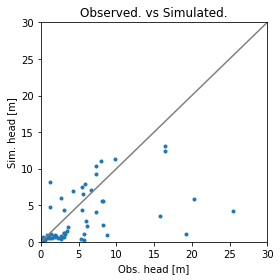

Error is - 9.880406355136097
Params are - [100.  100.   10.    0.5   0.5   0.5]


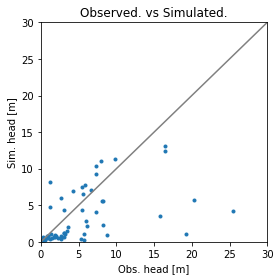

Error is - 9.888377722340161
Params are - [105.  100.   10.    0.5   0.5   0.5]


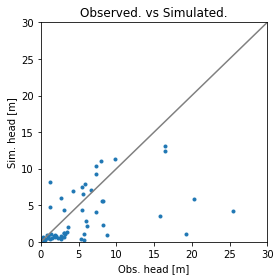

Error is - 9.880839582057554
Params are - [100.  105.   10.    0.5   0.5   0.5]


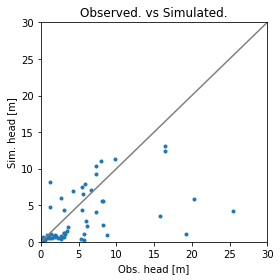

Error is - 9.881093173977039
Params are - [100.  100.   10.5   0.5   0.5   0.5]


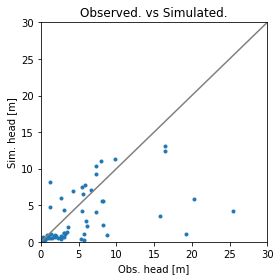

Error is - 9.882717509092506
Params are - [100.    100.     10.      0.525   0.5     0.5  ]


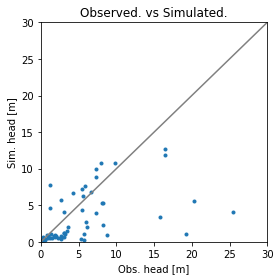

Error is - 9.952289282485387
Params are - [100.    100.     10.      0.5     0.525   0.5  ]


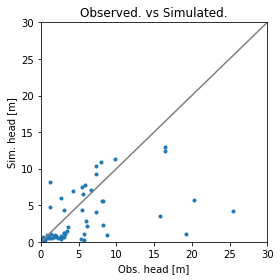

Error is - 9.8860479221265
Params are - [100.    100.     10.      0.5     0.5     0.525]


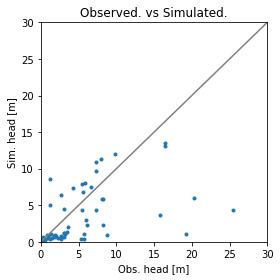

Error is - 9.811923941367477
Params are - [101.66666667 101.66666667  10.16666667   0.50833333   0.475
   0.50833333]


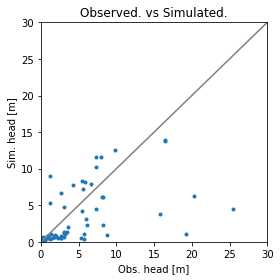

Error is - 9.738689063497345
Params are - [102.5    102.5     10.25     0.5125   0.45     0.5125]


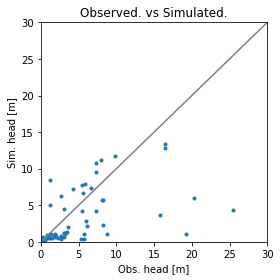

Error is - 9.828534606696444
Params are - [ 95.83333333 102.5         10.25         0.5125       0.48333333
   0.5125    ]


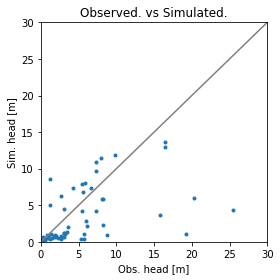

Error is - 9.811993992300936
Params are - [ 99.44444444 103.33333333  10.33333333   0.51666667   0.47777778
   0.48333333]


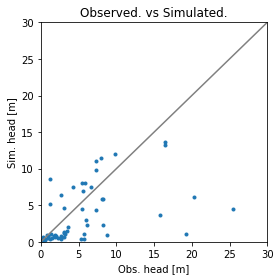

Error is - 9.791520557620839
Params are - [ 99.25925926 104.44444444  10.44444444   0.48888889   0.47037037
   0.50277778]


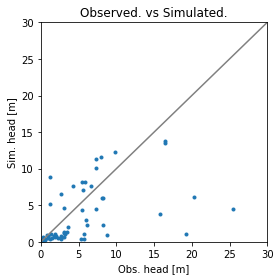

Error is - 9.762708603250967
Params are - [ 99.01234568 105.92592593   9.92592593   0.51018519   0.46049383
   0.5037037 ]


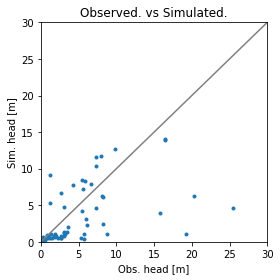

Error is - 9.722685042663615
Params are - [ 98.68312757 101.2345679   10.40123457   0.51358025   0.4473251
   0.50493827]


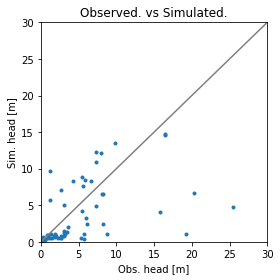

Error is - 9.641800571611792
Params are - [98.02469136 99.35185185 10.60185185  0.52037037  0.42098765  0.50740741]


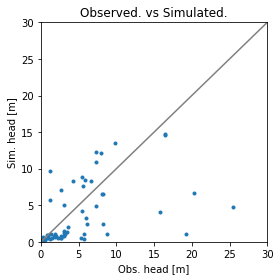

Error is - 9.642401375655108
Params are - [ 98.02469136 106.01851852  10.60185185   0.52037037   0.42098765
   0.50740741]


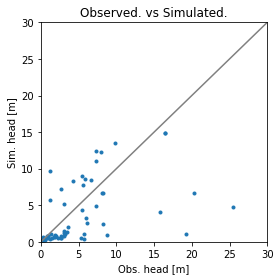

Error is - 9.633343893129096
Params are - [102.9218107  104.69135802  10.4691358    0.51049383   0.41687243
   0.49320988]


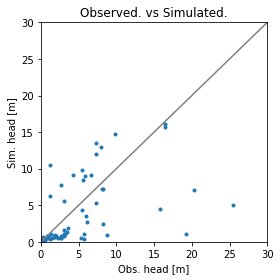

Error is - 9.537137006753001
Params are - [106.46604938 105.78703704  10.5787037    0.50949074   0.38364198
   0.48356481]


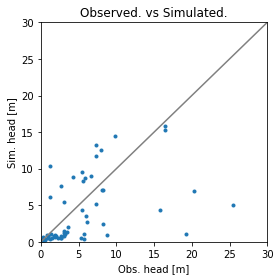

Error is - 9.559415941872981
Params are - [101.65123457 104.67592593  10.46759259   0.50393519   0.39104938
   0.5224537 ]


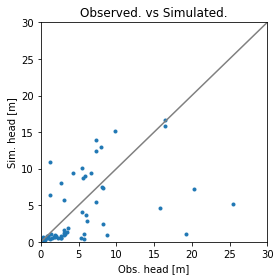

Error is - 9.506085356928956
Params are - [102.63374486 103.64197531  10.36419753   0.5367284    0.37201646
   0.5095679 ]


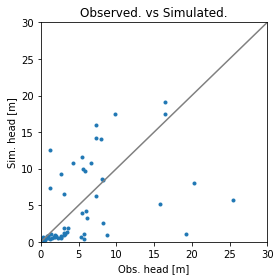

Error is - 9.397334166338494
Params are - [104.32098765 103.24074074  10.32407407   0.56064815   0.32283951
   0.51296296]


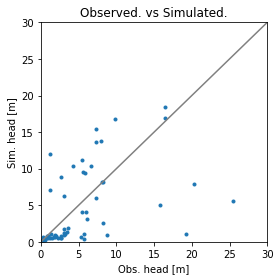

Error is - 9.42066752703054
Params are - [104.65020576 101.2654321   11.0154321    0.53225309   0.33600823
   0.5117284 ]


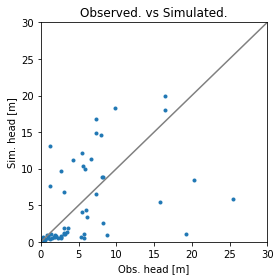

Error is - 9.37142014680798
Params are - [101.87928669 104.27983539  10.94650206   0.53652263   0.3085048
   0.5026749 ]


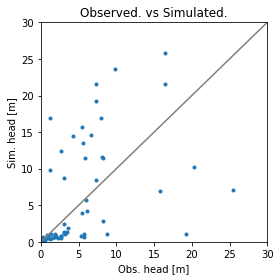

Error is - 9.518401651104165
Params are - [101.56893004 105.16975309  11.29475309   0.54853395   0.2377572
   0.49776235]


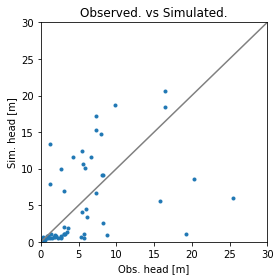

Error is - 9.373056094031062
Params are - [107.63946045 100.18175583  10.70953361   0.53403635   0.30002286
   0.50618999]


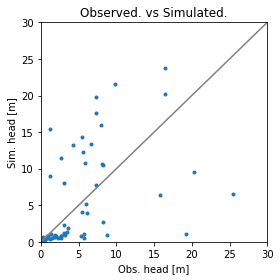

Error is - 9.422073517912342
Params are - [110.84438348 107.12505716  10.74542753   0.53859168   0.25970127
   0.50578418]


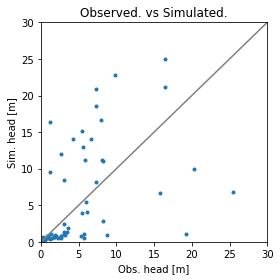

Error is - 9.479264903979784
Params are - [110.28222324 102.61736016  10.97229843   0.56657903   0.24585683
   0.48518137]


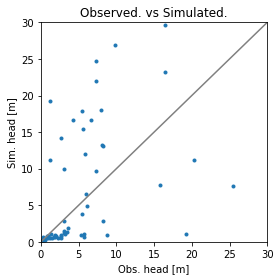

Error is - 9.855288453239416
Params are - [106.73946638 100.44969009  10.99238556   0.5800529    0.20733586
   0.52460912]


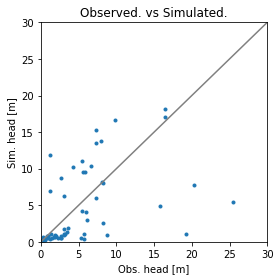

Error is - 9.426688734760466
Params are - [106.53440363 104.4527003   10.68212417   0.52713128   0.33956545
   0.49382589]


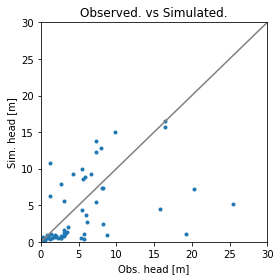

Error is - 9.518212018276174
Params are - [101.67401932 104.23114701  10.50206608   0.50981537   0.37635721
   0.52587406]


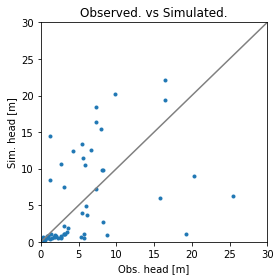

Error is - 9.378388792661635
Params are - [108.13017226 103.02080687  10.85474034   0.55238811   0.27848192
   0.49535455]


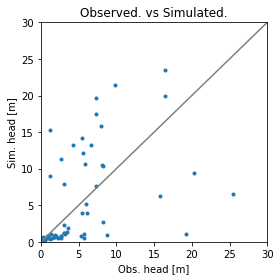

Error is - 9.410345161826143
Params are - [105.9537618  101.91850906  10.84977907   0.55768206   0.26228742
   0.5177391 ]


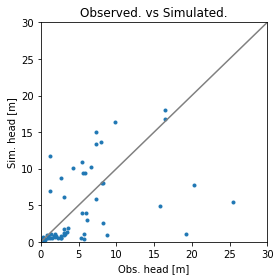

Error is - 9.429345422785442
Params are - [100.01357473  97.51063618  10.82125956   0.55258512   0.34301365
   0.50976578]


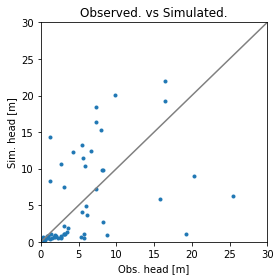

Error is - 9.377550324668546
Params are - [108.13668129 104.72145191  10.76438553   0.54209004   0.28052936
   0.50677958]


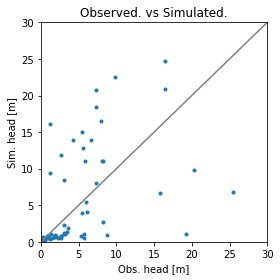

Error is - 9.464567126535302
Params are - [107.36991095 104.52226784  10.4675728    0.56220269   0.24821373
   0.50217196]


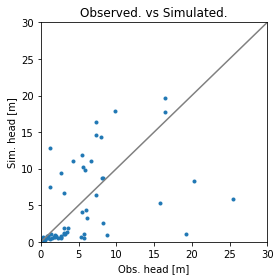

Error is - 9.384156628352375
Params are - [105.33013206 102.07964103  10.87846727   0.53974049   0.3140596
   0.50933929]


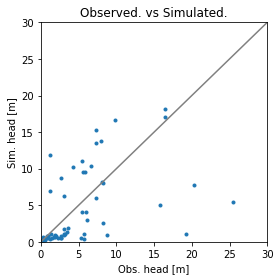

Error is - 9.425008088423668
Params are - [105.85847833 103.92290153  10.64278856   0.5307932    0.33919194
   0.49336132]


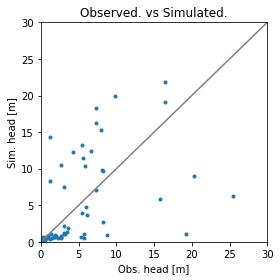

Error is - 9.374924581093191
Params are - [105.92994093 102.41960718  10.79803144   0.55095984   0.28151355
   0.51164465]


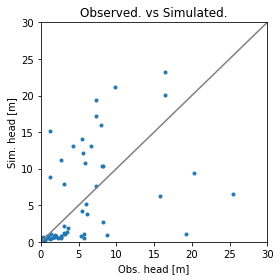

Error is - 9.401824008018863
Params are - [108.02757024 102.32695866  11.32647934   0.52459767   0.26486453
   0.49769802]


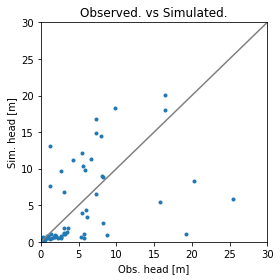

Error is - 9.378082344306474
Params are - [105.2476333  103.01229522  10.57467539   0.55163553   0.30834576
   0.50914673]


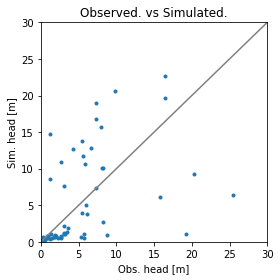

Error is - 9.387096451271088
Params are - [106.99092625 103.7989431   10.67082219   0.54947035   0.27173981
   0.50125751]


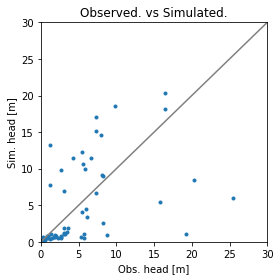

Error is - 9.37374646246359
Params are - [105.74533061 102.50946655  10.826556     0.54217295   0.30347966
   0.50731884]


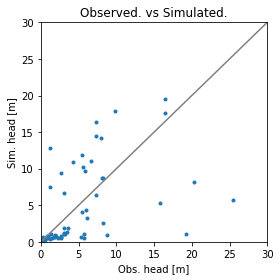

Error is - 9.384674386657613
Params are - [103.39593883 102.68733049  10.68515433   0.53341767   0.31565007
   0.51923035]


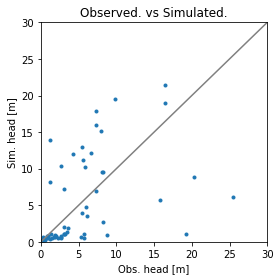

Error is - 9.370944323301005
Params are - [106.9466139  102.93743778  10.81234384   0.5476455    0.28777396
   0.5013235 ]


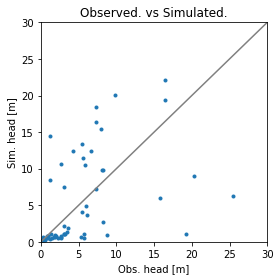

Error is - 9.376235943495681
Params are - [106.84480466 102.67088966  11.0444421    0.53284024   0.27892897
   0.50283043]


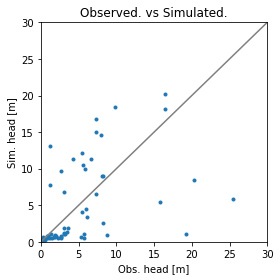

Error is - 9.371814758395928
Params are - [103.52513112 100.27821222  10.94808415   0.53930247   0.3062119
   0.50388119]


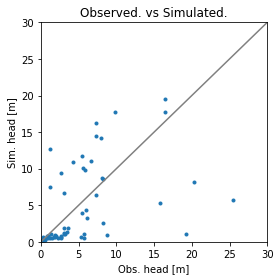

Error is - 9.385858683233026
Params are - [103.71044991 101.53121532  10.63590826   0.55070634   0.31690661
   0.5081806 ]


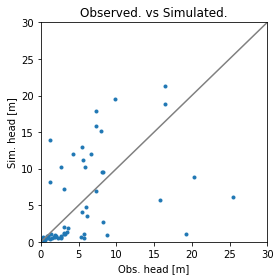

Error is - 9.369397354642771
Params are - [106.06121597 102.38597107  10.94230864   0.53730677   0.28842338
   0.50416797]


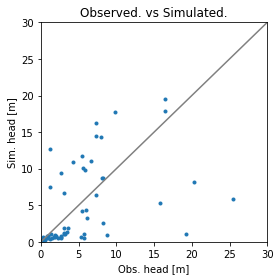

Error is - 9.383298583132774
Params are - [104.66907198 101.77128577  10.93041133   0.52803572   0.31662531
   0.49687414]


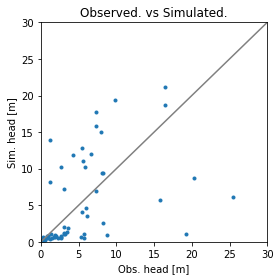

Error is - 9.369498434293067
Params are - [105.6147237  102.25752683  10.83112641   0.54522881   0.29029149
   0.50795203]


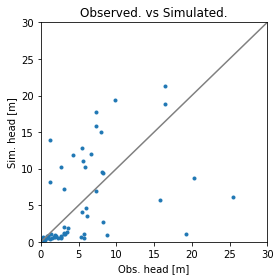

Error is - 9.366719931466356
Params are - [104.81014667 101.59744649  10.90341024   0.53784123   0.29026314
   0.50141101]


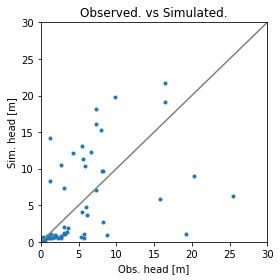

Error is - 9.367935183736037
Params are - [104.3425547  101.14143646  10.94183735   0.53567536   0.28365488
   0.4984571 ]


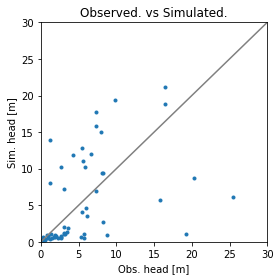

Error is - 9.363578391766776
Params are - [101.97291224 104.39705409  11.08505817   0.54724612   0.2904667
   0.50094688]


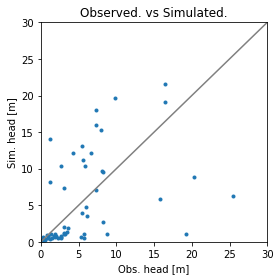

Error is - 9.361089439655473
Params are - [ 99.13963813 106.50470323  11.27282045   0.553851     0.28568861
   0.49832532]


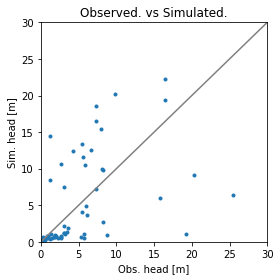

Error is - 9.375756213450805
Params are - [104.62541057 106.37609471  10.95475306   0.54682951   0.27743656
   0.50140372]


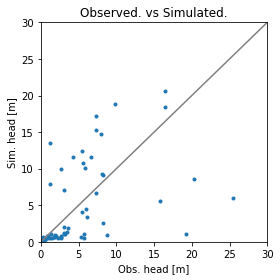

Error is - 9.367478538777025
Params are - [103.80020098 101.80268284  10.94975138   0.54118423   0.29901807
   0.50326182]


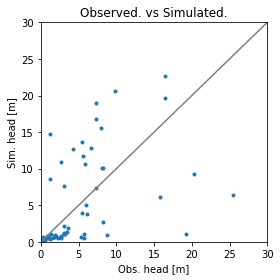

Error is - 9.387024445664121
Params are - [106.91155976 101.54875402  10.95741826   0.55116321   0.27198142
   0.50280565]


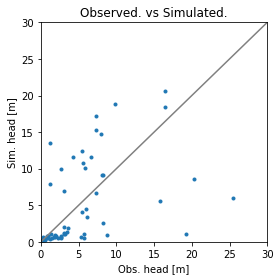

Error is - 9.366655140548794
Params are - [103.13735496 103.59706505  10.94923111   0.54018278   0.29937395
   0.50270759]


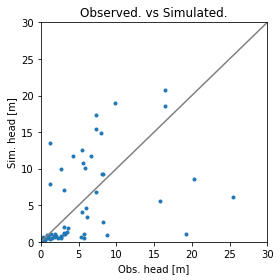

Error is - 9.361993838449443
Params are - [100.57447957 103.11102739  11.13720557   0.53755277   0.29657892
   0.50461841]


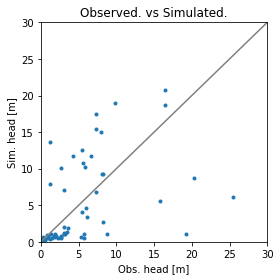

Error is - 9.360136634192814
Params are - [100.2262884  104.07543853  11.22044938   0.53741078   0.2961572
   0.49687868]


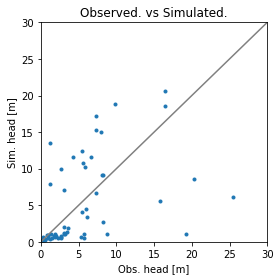

Error is - 9.356013417229647
Params are - [ 97.53207075 104.98439438  11.41511087   0.53350177   0.29909006
   0.49134201]


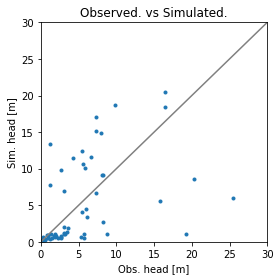

Error is - 9.357830408150798
Params are - [ 96.93674772 104.81313538  11.2668679    0.54406449   0.30158087
   0.49638742]


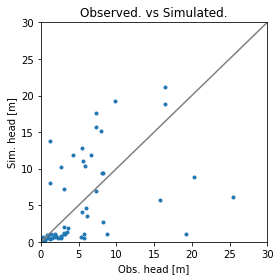

Error is - 9.354659246099528
Params are - [ 96.90994495 106.3999078   11.36513067   0.54114711   0.29184045
   0.4950021 ]


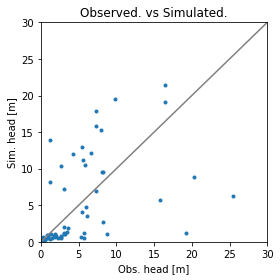

Error is - 9.34927915273758
Params are - [ 93.46481694 108.69852028  11.57282031   0.54112856   0.28825165
   0.49087224]


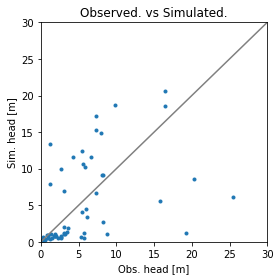

Error is - 9.349106121185576
Params are - [ 92.11822269 108.97216875  11.6346085    0.5455859    0.29992488
   0.49333998]


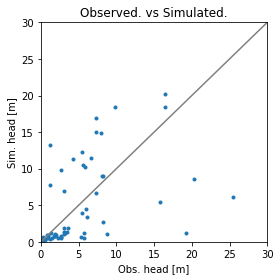

Error is - 9.34067069195317
Params are - [ 85.77226069 112.65952988  12.00020763   0.54945823   0.30475575
   0.48930447]


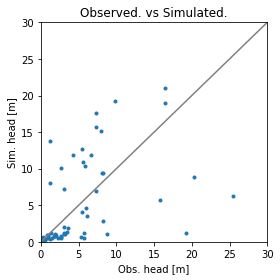

Error is - 9.33924870514446
Params are - [ 88.00264964 109.9933718   11.93911314   0.54633616   0.292608
   0.4875757 ]


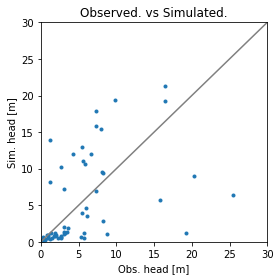

Error is - 9.324405067089955
Params are - [ 80.43529698 113.19152518  12.43405415   0.54941285   0.28922503
   0.48000976]


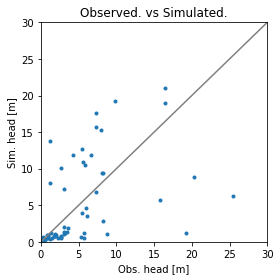

Error is - 9.330627153132298
Params are - [ 83.85246417 113.83957539  12.18342154   0.55291953   0.29295174
   0.47746199]


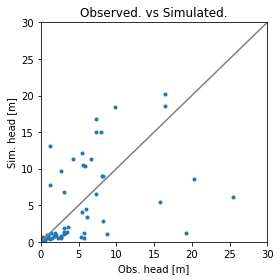

Error is - 9.327585255763198
Params are - [ 80.19158095 112.89085694  12.35134035   0.5363108    0.30626309
   0.47680064]


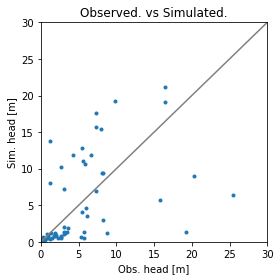

Error is - 9.315033642976575
Params are - [ 76.81274911 117.27499863  12.71878372   0.54351276   0.29193156
   0.47220962]


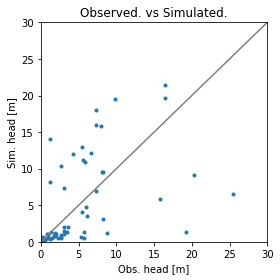

Error is - 9.290640103869206
Params are - [ 66.7507498  123.50593025  13.44474163   0.54323689   0.28710691
   0.46012072]


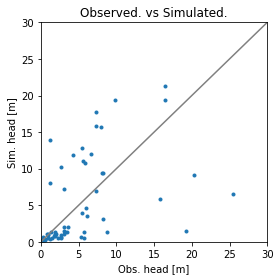

Error is - 9.288577250819857
Params are - [ 65.95698576 123.27758492  13.24708433   0.55732052   0.29042799
   0.46684793]


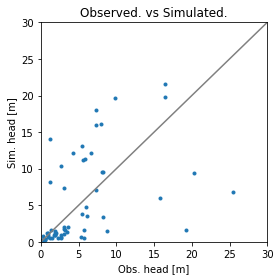

Error is - 9.236238525917285
Params are - [ 50.16944326 132.42418019  14.16307106   0.5692299    0.28609695
   0.4546009 ]


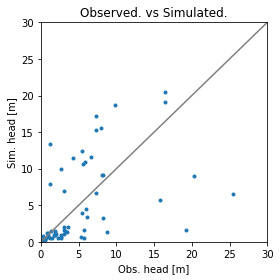

Error is - 9.255502937849634
Params are - [ 55.59244835 127.47201233  13.95279181   0.55906084   0.30054818
   0.45522726]


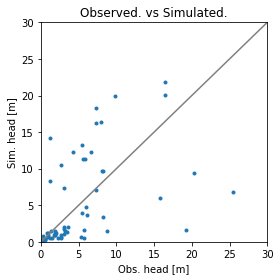

Error is - 9.249442175917661
Params are - [ 53.22506714 128.44849687  14.17626588   0.55393204   0.28264154
   0.44543596]


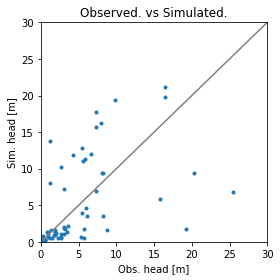

Error is - 9.208465581135837
Params are - [ 44.93573133 132.13809187  14.65733342   0.55080825   0.29100883
   0.44660309]


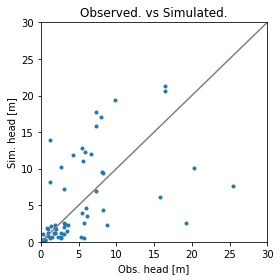

Error is - 9.068229491910282
Params are - [ 25.47736491 141.28735011  15.89428937   0.54975261   0.29003737
   0.43117363]


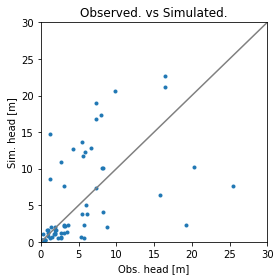

Error is - 9.140172873484678
Params are - [ 30.35854253 142.55230804  15.67039762   0.57189757   0.27228891
   0.43205543]


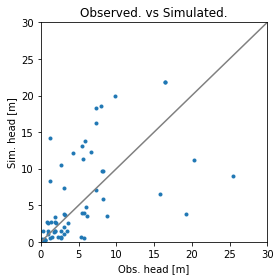

Error is - 8.89177925296177
Params are - [ 13.42257502 152.03856742  16.66646497   0.56629043   0.28368159
   0.41286154]


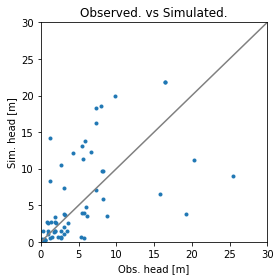

Error is - 8.89177925296177
Params are - [-20.08378597 171.46208854  18.78267038   0.57472922   0.28090988
   0.37928742]


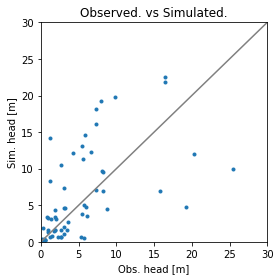

Error is - 8.777997138206102
Params are - [  9.33106393 151.2350414   16.72968527   0.58015091   0.28465794
   0.41699752]


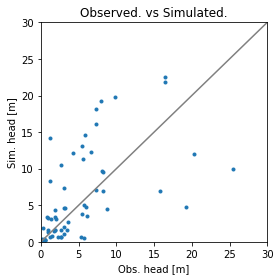

Error is - 8.777997138206102
Params are - [-19.378779   165.09959698  18.37215709   0.59860792   0.28343345
   0.39543591]


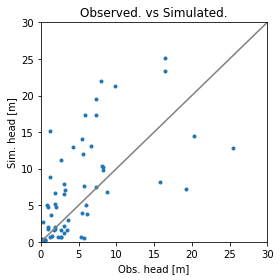

Error is - 8.698628746131341
Params are - [  5.06890391 155.18996902  17.14726625   0.57135697   0.26591993
   0.40914773]


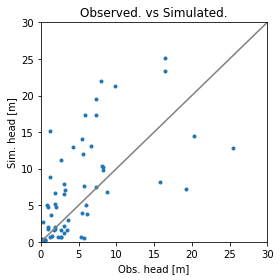

Error is - 8.698628746131341
Params are - [-20.19286831 169.04894736  18.74450347   0.57750504   0.2486058
   0.38610797]


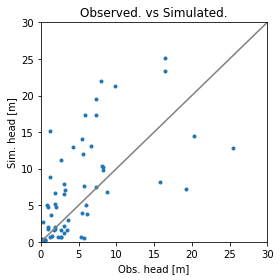

Error is - 8.698628746131341
Params are - [ -8.61576929 163.12730852  17.91412564   0.58229409   0.27825269
   0.40684296]


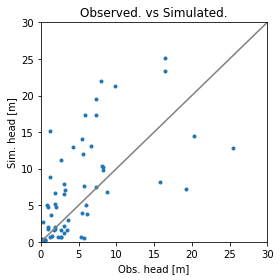

Error is - 8.698628746131341
Params are - [-25.15521626 169.38600131  19.17767197   0.57135096   0.27218252
   0.38175871]


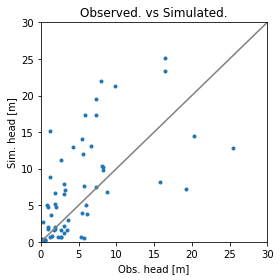

Error is - 8.698628746131341
Params are - [-23.84890179 168.20243788  18.83943687   0.56850108   0.28595511
   0.38753859]


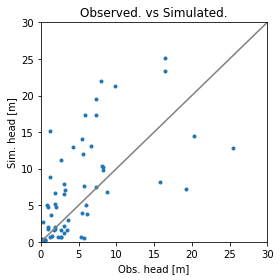

Error is - 8.698628746131341
Params are - [-35.40981307 178.43909174  19.59726096   0.59689554   0.26684589
   0.37387538]


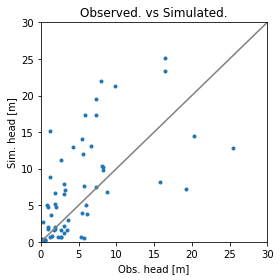

Error is - 8.698628746131341
Params are - [-39.63248587 176.48804921  19.80201735   0.59055942   0.26758976
   0.37919209]


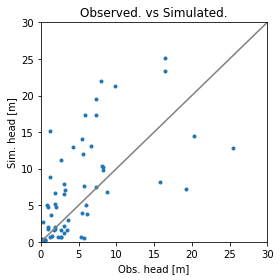

Error is - 8.698628746131341
Params are - [-51.86215805 185.70924449  20.76290774   0.58016845   0.26092402
   0.36245431]


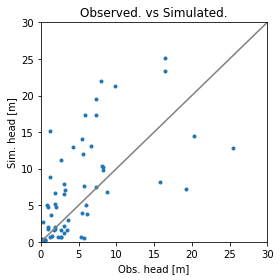

Error is - 8.698628746131341
Params are - [-36.56385256 177.09069372  19.75460212   0.58016406   0.2668575
   0.37609011]


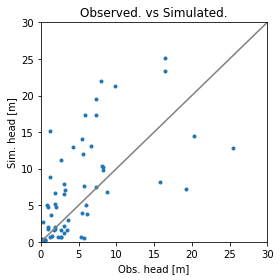

Error is - 8.698628746131341
Params are - [ -5.96724156 159.85359217  17.73799089   0.58015529   0.27872446
   0.40336171]


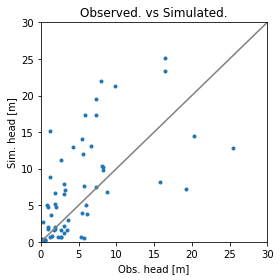

Error is - 8.698628746131341
Params are - [-28.91469981 172.78141833  19.25044931   0.58016187   0.26982424
   0.38290801]


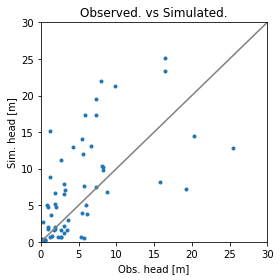

Error is - 8.698628746131341
Params are - [ -1.77343269 159.15863877  17.53069594   0.57682553   0.27208631
   0.40799535]


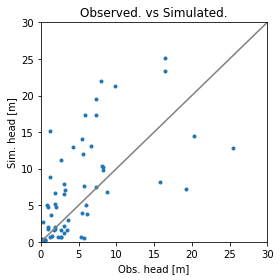

Error is - 8.698628746131341
Params are - [-10.04315617 162.28798516  18.16246911   0.57135397   0.26905122
   0.39545322]


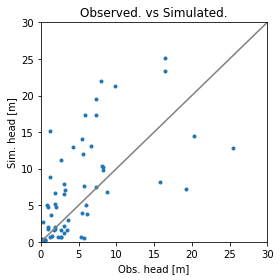

Error is - 8.698628746131341
Params are - [ -9.38999894 161.69620345  17.99335156   0.56992903   0.27593752
   0.39834316]


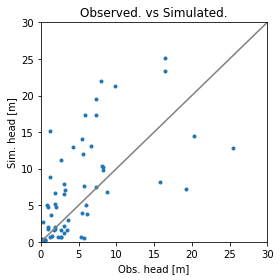

Error is - 8.698628746131341
Params are - [-15.17045458 166.81453038  18.3722636    0.58412626   0.26638291
   0.39151156]


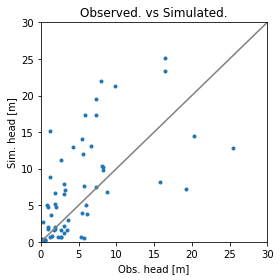

Error is - 8.698628746131341
Params are - [-17.28179098 165.83900911  18.4746418    0.5809582    0.26675484
   0.39416991]


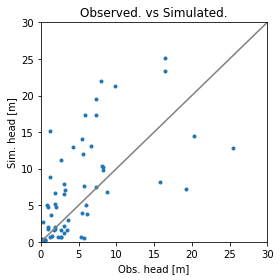

Error is - 8.698628746131341
Params are - [-15.74747432 166.14033137  18.45093418   0.57576052   0.26638872
   0.39261892]


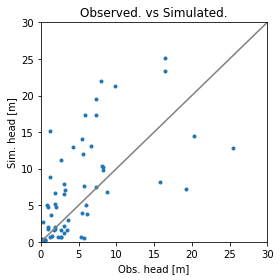

Error is - 8.698628746131341
Params are - [ -0.44916883 157.5217806   17.44262857   0.57575613   0.27232219
   0.40625472]


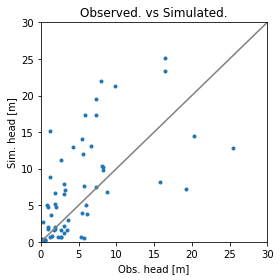

Error is - 8.698628746131341
Params are - [-11.92289795 163.98569367  18.19885778   0.57575942   0.26787208
   0.39602787]


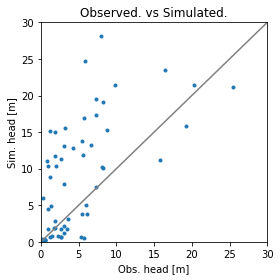

Error is - 9.349106172280333
Params are - [  1.64773561 157.17430389  17.33898109   0.57409125   0.26900312
   0.40857154]


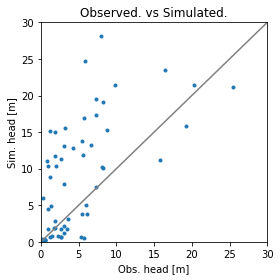

Error is - 9.349106172280333
Params are - [ -2.48712613 158.73897709  17.65486768   0.57135547   0.26748558
   0.40230048]


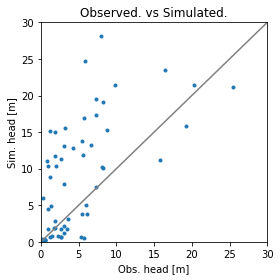

Error is - 9.349106172280333
Params are - [ -2.16054751 158.44308623  17.5703089    0.570643     0.27092872
   0.40374545]


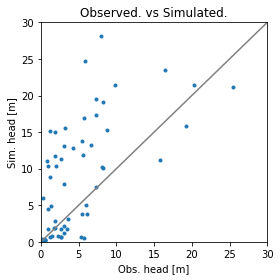

Error is - 9.349106172280333
Params are - [ -5.05077533 161.0022497   17.75976492   0.57774162   0.26615142
   0.40032964]


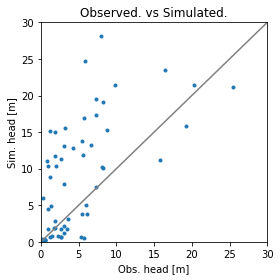

Error is - 9.349106172280333
Params are - [ -6.10644353 160.51448906  17.81095402   0.57615759   0.26633739
   0.40165882]


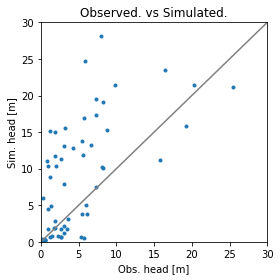

Error is - 9.349106172280333
Params are - [ -5.3392852  160.66515019  17.79910022   0.57355875   0.26615432
   0.40088333]


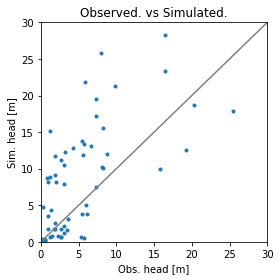

Error is - 8.89277317182584
Params are - [  2.30986754 156.35587481  17.29494741   0.57355655   0.26912106
   0.40770123]


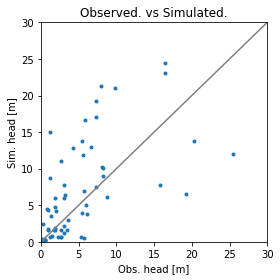

Error is - 8.704100909223666
Params are - [  5.8824629  155.12033118  17.1110914    0.5700907    0.26986589
   0.40893987]


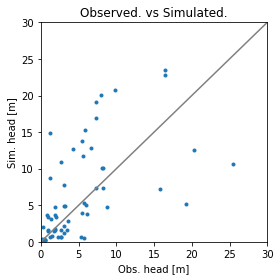

Error is - 8.785116615231438
Params are - [  8.47120744 152.67193104  16.94605598   0.56595637   0.27129001
   0.41313912]


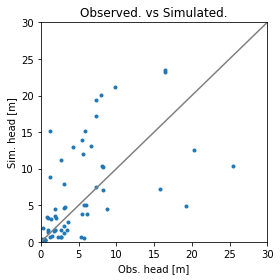

Error is - 8.82330125939969
Params are - [  9.12489794 153.30737611  16.9274277    0.57149277   0.26663314
   0.41285454]


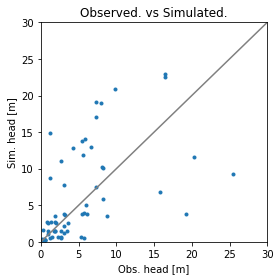

Error is - 8.92008037113127
Params are - [ 13.32215124 151.20095159  16.60038893   0.57082607   0.26979214
   0.41781753]


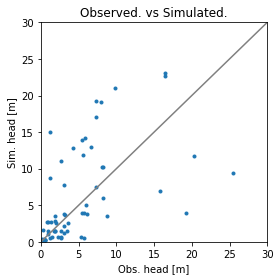

Error is - 8.919195543964005
Params are - [ 13.07876138 150.77450736  16.67007813   0.56700189   0.2685376
   0.41462847]


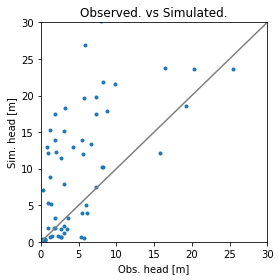

Error is - 9.872124671511086
Params are - [  1.32321579 156.60571158  17.43190002   0.56899235   0.2673304
   0.40431945]


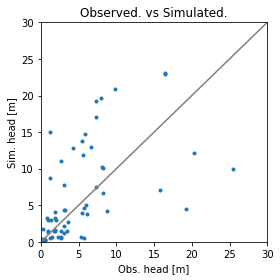

Error is - 8.848222689725006
Params are - [ 10.32241738 152.55214159  16.8082667    0.57036764   0.26917671
   0.41444301]


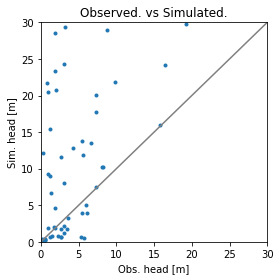

Error is - 13.07720610968969
Params are - [  0.64782432 157.62470056  17.40827368   0.57393844   0.26879797
   0.4074467 ]


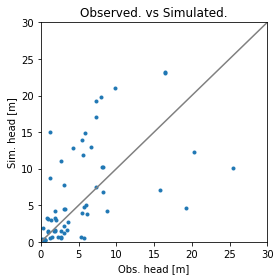

Error is - 8.840633387021212
Params are - [  9.97102712 152.48705566  16.85462702   0.56873603   0.2686027
   0.41283302]


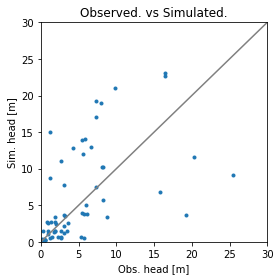

Error is - 8.939905549618274
Params are - [ 13.97043802 150.75372673  16.63663094   0.56577694   0.26804173
   0.41608454]


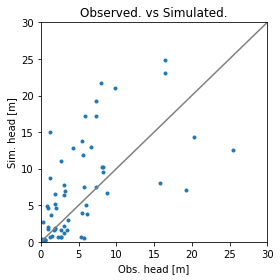

Error is - 8.688369846251332
Params are - [  5.22501016 154.95533779  17.13036829   0.57161165   0.26885123
   0.40979705]


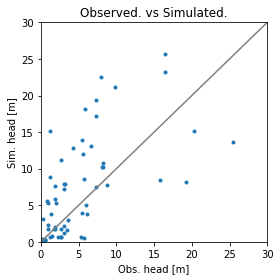

Error is - 8.678111313086891
Params are - [  4.25875244 155.35852534  17.23067884   0.56938053   0.26787759
   0.4077941 ]


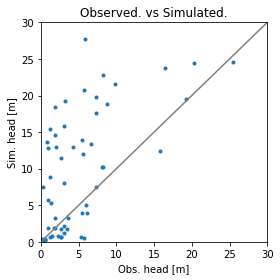

Error is - 10.09366404176183
Params are - [  1.22691997 156.76171722  17.44188491   0.56888697   0.26722803
   0.40446964]


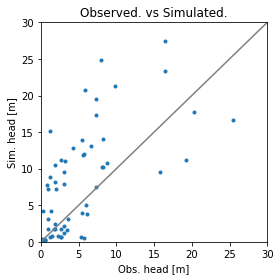

Error is - 8.78496318767628
Params are - [  2.70605115 156.38076784  17.30966914   0.57122697   0.2682099
   0.40772445]


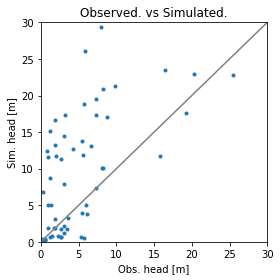

Error is - 9.668452648673853
Params are - [  1.41256473 156.58491129  17.36428226   0.56838162   0.27070504
   0.4059929 ]


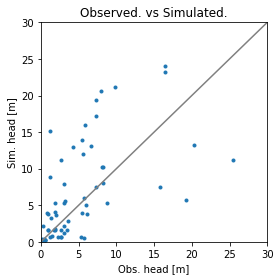

Error is - 8.75699933724512
Params are - [  7.19681464 154.1267599   17.03664134   0.57071498   0.26765111
   0.41113913]


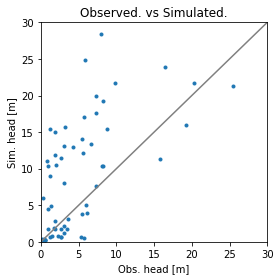

Error is - 9.395226423084276
Params are - [  1.64145763 157.70529931  17.3758491    0.57550423   0.2648352
   0.40504166]


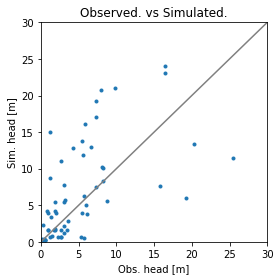

Error is - 8.733818826659688
Params are - [  6.76376999 153.93027311  17.05350426   0.56834333   0.26967631
   0.41111475]


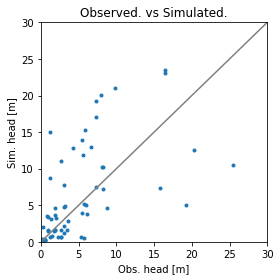

Error is - 8.805183669795706
Params are - [  8.75918686 153.17963095  16.92684766   0.56927242   0.26840412
   0.41158643]


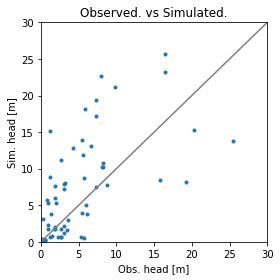

Error is - 8.67574458213481
Params are - [  4.21933508 155.58048361  17.21396377   0.57073833   0.26825845
   0.40868994]


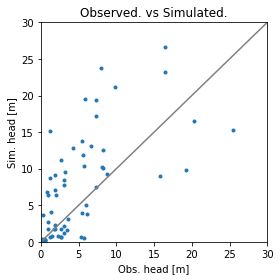

Error is - 8.701854684693332
Params are - [  3.27593019 155.91821344  17.25898293   0.56979219   0.26916535
   0.40735535]


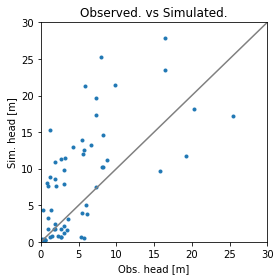

Error is - 8.831831738843904
Params are - [  2.54636157 156.77734702  17.31061289   0.57264679   0.26696984
   0.4061266 ]


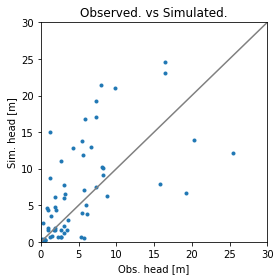

Error is - 8.701814562249009
Params are - [  5.70941788 154.64204159  17.11778142   0.5694192    0.26899969
   0.40986771]


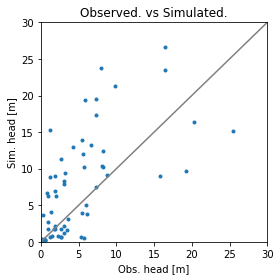

Error is - 8.709848373733898
Params are - [  3.36998699 155.42785908  17.25525577   0.57067559   0.26649153
   0.40861077]


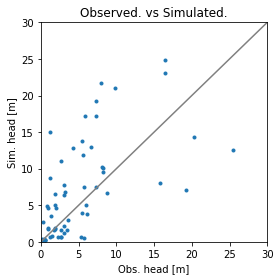

Error is - 8.688810408229777
Params are - [  5.25434392 155.19721316  17.14713249   0.57023692   0.2690223
   0.40885759]


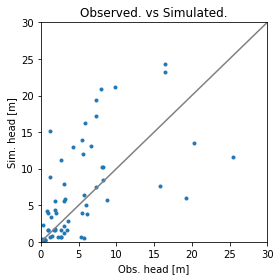

Error is - 8.740188594401609
Params are - [  6.63599094 154.38964339  17.07008076   0.57112235   0.26714438
   0.41069602]


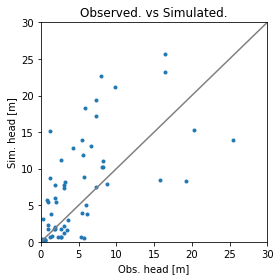

Error is - 8.674082103998794
Params are - [  4.11594538 155.53607093  17.21175738   0.57012473   0.26866011
   0.40819052]


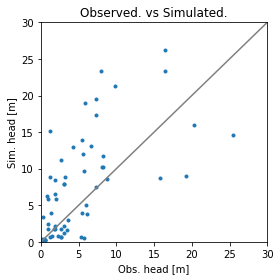

Error is - 8.69057452367624
Params are - [  3.67134575 155.96382503  17.24260759   0.57173051   0.26719684
   0.4076246 ]


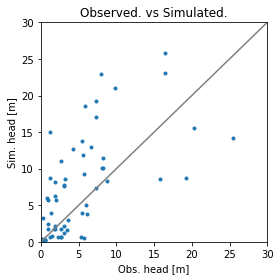

Error is - 8.667223783401923
Params are - [  3.846007   155.6738496   17.24490321   0.56991725   0.27070225
   0.40783687]


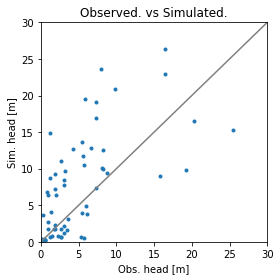

Error is - 8.6841061780889
Params are - [  3.23455854 155.91578989  17.29372168   0.56919739   0.27309341
   0.40718144]


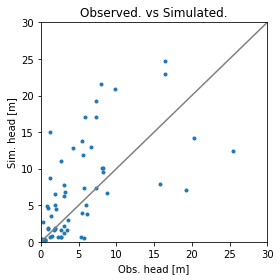

Error is - 8.683069762989618
Params are - [  5.30178558 154.80333512  17.15032707   0.56893929   0.2705938
   0.40943076]


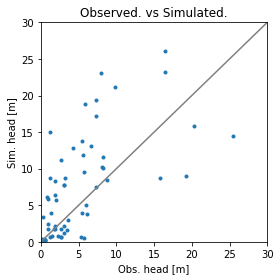

Error is - 8.676877584413752
Params are - [  3.73460129 155.43865431  17.24686703   0.57000033   0.26929218
   0.40838883]


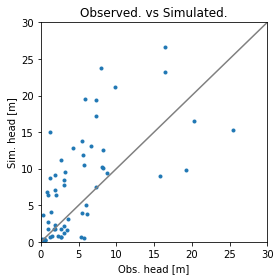

Error is - 8.700350006447577
Params are - [  3.26713209 155.84163518  17.30246414   0.5680885    0.26961023
   0.40697995]


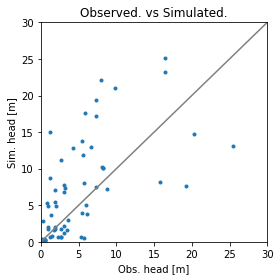

Error is - 8.6767699392049
Params are - [  4.73554064 155.17691214  17.17339225   0.57073086   0.26904098
   0.40909278]


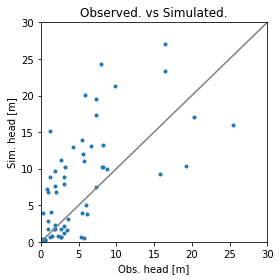

Error is - 8.741197453904828
Params are - [  3.00160836 156.11816353  17.29019375   0.57135805   0.26735005
   0.40723359]


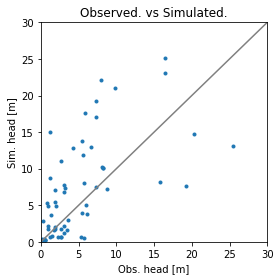

Error is - 8.673295149694122
Params are - [  4.72674127 155.13204222  17.18529374   0.56954398   0.26978286
   0.40888147]


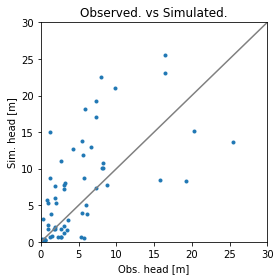

Error is - 8.663473964490564
Params are - [  4.20063778 155.48747893  17.19471362   0.5709713    0.27070135
   0.4092327 ]


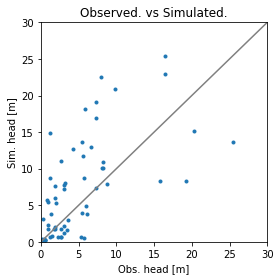

Error is - 8.656565854868376
Params are - [  4.17158045 155.55195572  17.17673101   0.57176669   0.27211323
   0.409952  ]


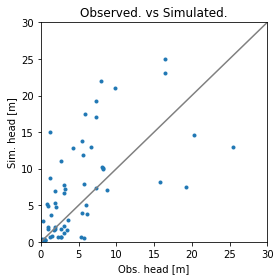

Error is - 8.673947873971517
Params are - [  4.87044865 155.4451171   17.15514676   0.57094028   0.27022712
   0.40915904]


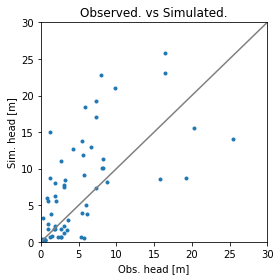

Error is - 8.664895058095208
Params are - [  3.91447863 155.79626093  17.2225397    0.57027956   0.27087369
   0.40847717]


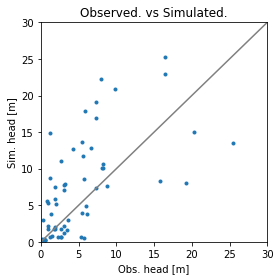

Error is - 8.65576306088545
Params are - [  4.32906538 155.46461522  17.18482683   0.57011917   0.27252797
   0.40880908]


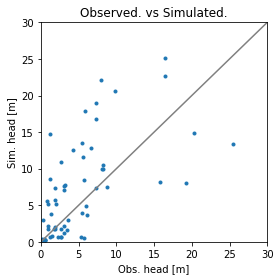

Error is - 8.647064692866234
Params are - [  4.38393053 155.40668102  17.17025837   0.56980958   0.27466272
   0.40886865]


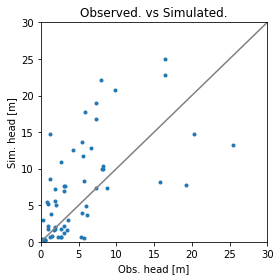

Error is - 8.650830875378524
Params are - [  4.52178346 155.46589793  17.17320021   0.57062772   0.27412718
   0.40953454]


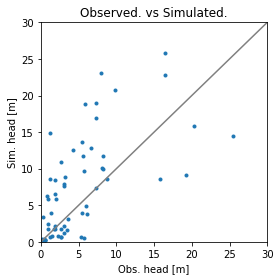

Error is - 8.656637696396718
Params are - [  3.65105847 155.56377871  17.23582866   0.56970798   0.2738602
   0.4086912 ]


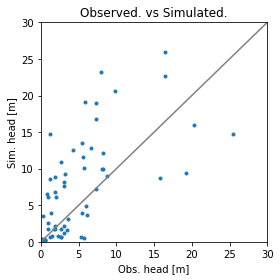

Error is - 8.657196871836735
Params are - [  3.4362049  156.02076575  17.22252664   0.57115895   0.27566356
   0.40890534]


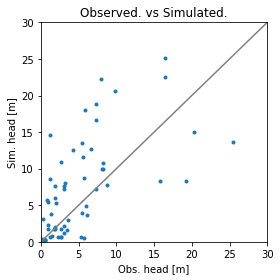

Error is - 8.638065211013284
Params are - [  4.18033849 155.59459708  17.15545832   0.57119958   0.27639795
   0.4103061 ]


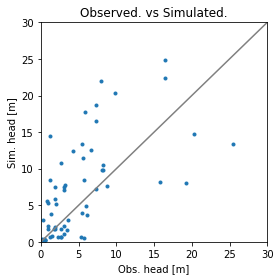

Error is - 8.627974112174043
Params are - [  4.34750423 155.55497082  17.11073588   0.57184074   0.2792458
   0.41154071]


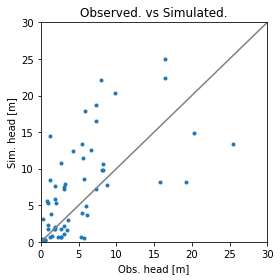

Error is - 8.628310064453121
Params are - [  4.25620872 155.39175573  17.14055389   0.57135766   0.2790172
   0.41068698]


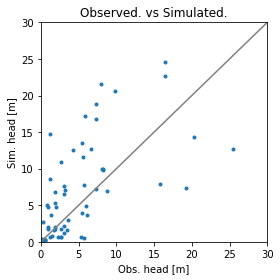

Error is - 8.655503304941899
Params are - [  5.00781705 154.95758089  17.1132427    0.57054451   0.27534522
   0.41085268]


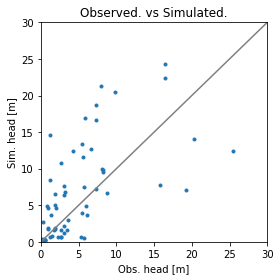

Error is - 8.653600940214801
Params are - [  5.24521635 155.212502    17.0590787    0.57227432   0.27764359
   0.41178733]


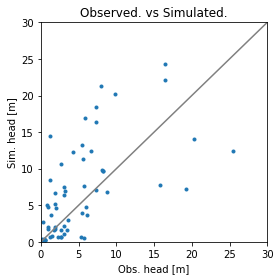

Error is - 8.637578182801462
Params are - [  5.082573   155.11117375  17.07895891   0.57038482   0.28123401
   0.41113829]


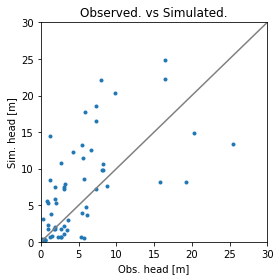

Error is - 8.625158497591732
Params are - [  4.27125505 155.75674619  17.13101929   0.57155377   0.27996495
   0.41033282]


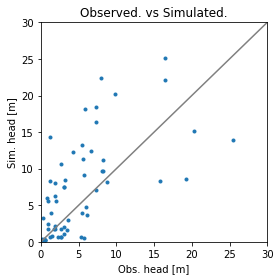

Error is - 8.61677679563298
Params are - [  3.90297405 156.15632884  17.13990758   0.5720584    0.28227482
   0.41007288]


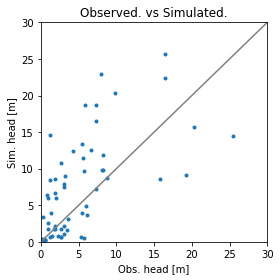

Error is - 8.63534202190533
Params are - [  3.58644165 155.81643403  17.21212625   0.56975199   0.27921032
   0.40882669]


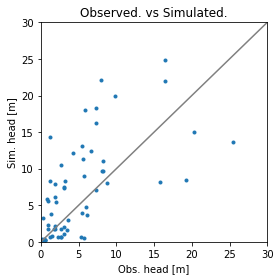

Error is - 8.608825851083724
Params are - [  3.99809393 155.67988346  17.11098008   0.57110668   0.28442111
   0.41084353]


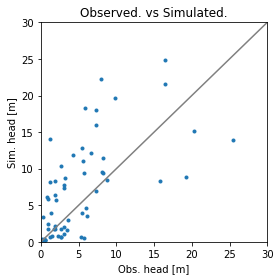

Error is - 8.595107801469764
Params are - [  3.73624916 155.78687623  17.07987002   0.57134616   0.28956807
   0.41149802]


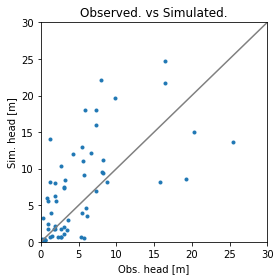

Error is - 8.59531812706748
Params are - [  3.92005307 155.86583211  17.08379247   0.57243701   0.28885402
   0.41238588]


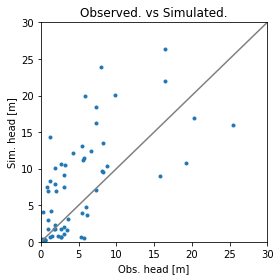

Error is - 8.673658827357814
Params are - [  2.83390396 156.41289217  17.17670313   0.57254583   0.28482274
   0.41053209]


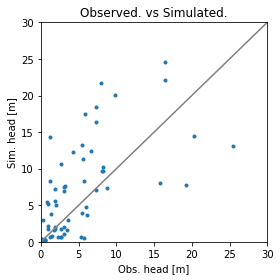

Error is - 8.621094581220555
Params are - [  4.52040574 155.43660335  17.10339496   0.57092507   0.28213119
   0.41098674]


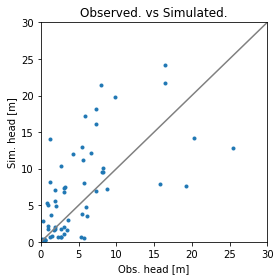

Error is - 8.60653151778687
Params are - [  4.64135668 155.58102166  17.00729202   0.57356969   0.28782005
   0.41356371]


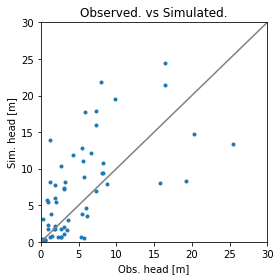

Error is - 8.590094755278816
Params are - [  4.09997226 156.06878861  17.03444376   0.57270136   0.29094744
   0.41266233]


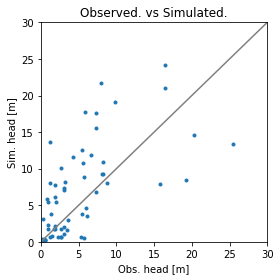

Error is - 8.5760398451218
Params are - [  4.02185403 156.40730506  16.98138869   0.57337321   0.29691256
   0.41365001]


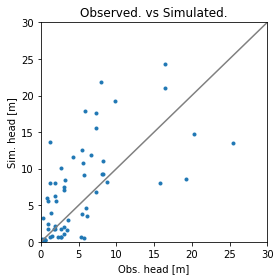

Error is - 8.576642370095197
Params are - [  3.90012668 156.18968493  17.02114603   0.57272911   0.29660777
   0.41251171]


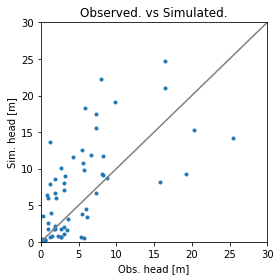

Error is - 8.576714429926964
Params are - [  3.52046548 156.55907959  17.00107064   0.57424612   0.29854791
   0.41357399]


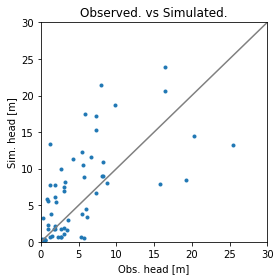

Error is - 8.563756357374404
Params are - [  4.01039432 155.97360435  16.91827904   0.57384203   0.30382864
   0.41565489]


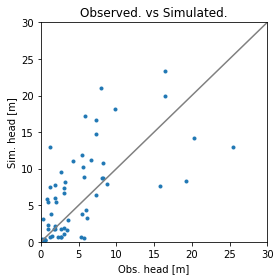

Error is - 8.553047235160983
Params are - [  4.06410445 155.88224211  16.80746478   0.57473385   0.31460555
   0.41844589]


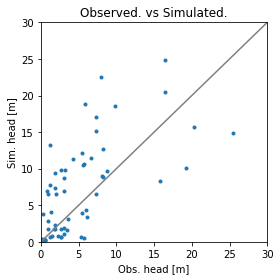

Error is - 8.581349472668466
Params are - [  3.07959429 156.64931834  16.98428552   0.57271879   0.30721192
   0.41379146]


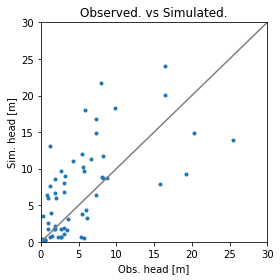

Error is - 8.554538244856387
Params are - [  3.52074496 156.62566998  16.87461609   0.5739454    0.31229724
   0.41543781]


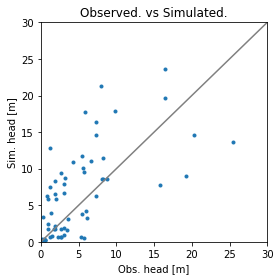

Error is - 8.54740009411363
Params are - [  3.63271413 156.98422377  16.81012056   0.57590266   0.31915958
   0.41763894]


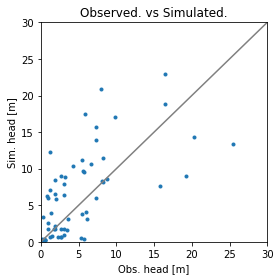

Error is - 8.544598172254178
Params are - [  3.58094662 157.58289754  16.67524584   0.57818092   0.33395533
   0.4207094 ]


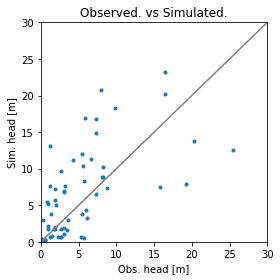

Error is - 8.565334619245329
Params are - [  4.45648646 156.43297472  16.80269183   0.57635075   0.3104302
   0.41765148]


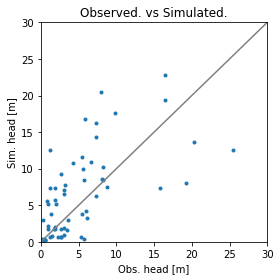

Error is - 8.556841313725604
Params are - [  4.32762225 156.48117852  16.71978044   0.57552496   0.32305498
   0.41922811]


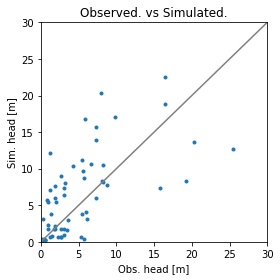

Error is - 8.551640518322552
Params are - [  4.09045957 156.94773772  16.59924986   0.57797392   0.33381085
   0.4225292 ]


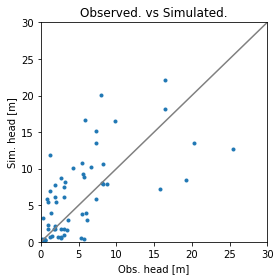

Error is - 8.556733655940969
Params are - [  3.99160074 156.9102618   16.51162758   0.57886339   0.34580549
   0.42435062]


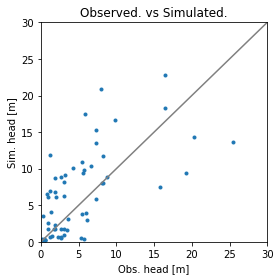

Error is - 8.54872127317857
Params are - [  3.40200641 157.04368783  16.59330303   0.5767234    0.34407961
   0.42258219]


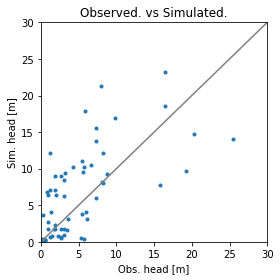

Error is - 8.550110590505252
Params are - [  3.222332   157.18298714  16.63405528   0.57794866   0.33846305
   0.4221236 ]


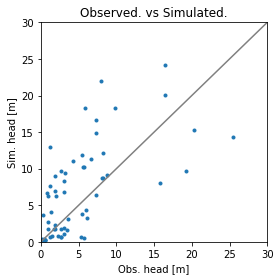

Error is - 8.559337318750138
Params are - [  3.3019306  156.8448123   16.88301737   0.57430533   0.31326505
   0.41625874]


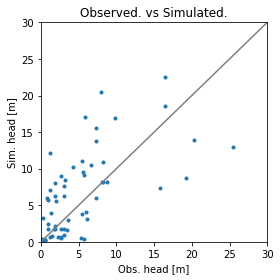

Error is - 8.547561071891637
Params are - [  3.8191832  156.89389943  16.60447503   0.57772387   0.33767038
   0.42232765]


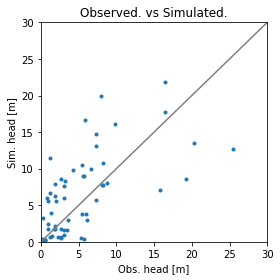

Error is - 8.562703167152616
Params are - [  3.87226579 157.21881395  16.42998185   0.58048281   0.35523102
   0.42746816]


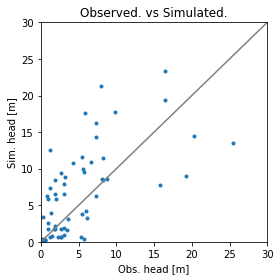

Error is - 8.545491559871387
Params are - [  3.60862517 156.77395597  16.76345753   0.57557975   0.32303068
   0.4184454 ]


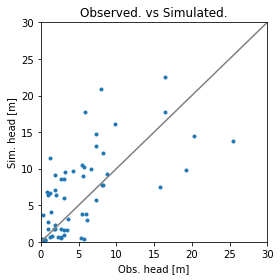

Error is - 8.560300267251511
Params are - [  3.17707987 158.25947977  16.48246408   0.57997633   0.35573108
   0.42445992]


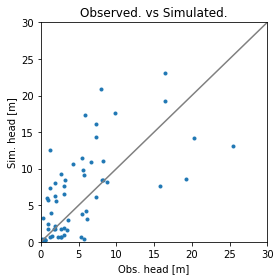

Error is - 8.545785811654568
Params are - [  3.84234831 156.47655152  16.7262146    0.57604447   0.32488693
   0.4199494 ]


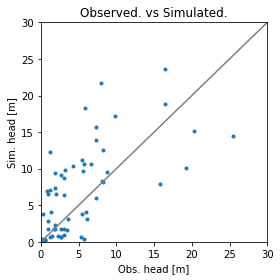

Error is - 8.557207496134694
Params are - [  3.068021   157.0369221   16.73300058   0.57609311   0.33355114
   0.41951668]


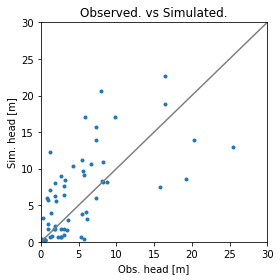

Error is - 8.546286915892749
Params are - [  3.83484993 156.97003381  16.63268754   0.57750372   0.33374593
   0.42177607]


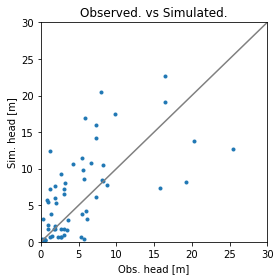

Error is - 8.551788227862042
Params are - [  4.14032121 156.73068823  16.69773924   0.57597004   0.32732658
   0.41980644]


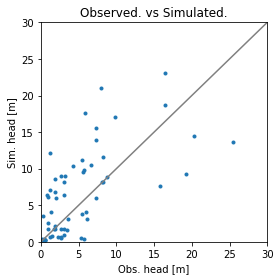

Error is - 8.545186789198006
Params are - [  3.4518293  157.06991241  16.64997627   0.57745401   0.33567893
   0.42154431]


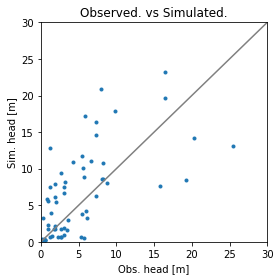

Error is - 8.549385767982892
Params are - [  3.97725444 156.87872906  16.75738257   0.57743885   0.31890978
   0.41900188]


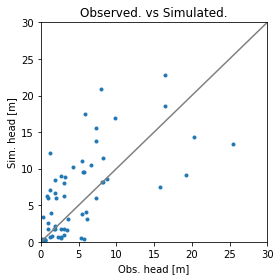

Error is - 8.545367902241809
Params are - [  3.54581841 157.00244814  16.63432292   0.57690226   0.33778715
   0.42168712]


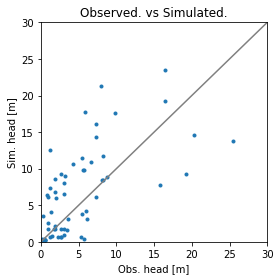

Error is - 8.545868482962211
Params are - [  3.46895604 157.06470037  16.75615987   0.5761645    0.32535794
   0.41904291]


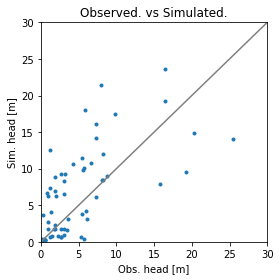

Error is - 8.54839078579153
Params are - [  3.33132469 157.02012151  16.7691048    0.57593825   0.3264864
   0.41868344]


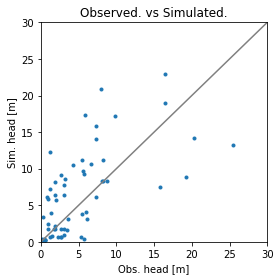

Error is - 8.544515842158535
Params are - [  3.70896862 156.98255573  16.66679185   0.57711235   0.33193104
   0.42100291]


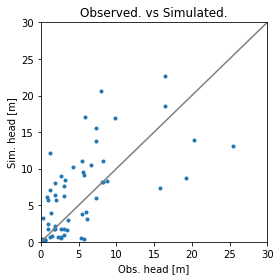

Error is - 8.546685738418432
Params are - [  3.77722277 156.8980734   16.61584314   0.57759342   0.33706542
   0.42206993]


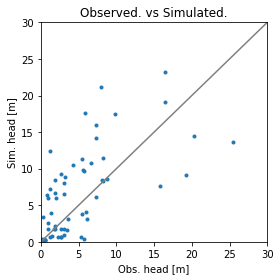

Error is - 8.544403178509764
Params are - [  3.54602272 157.02304363  16.72108068   0.57652173   0.32828481
   0.41979967]


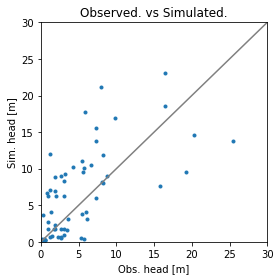

Error is - 8.54830044278399
Params are - [  3.30505531 157.66838628  16.64407709   0.57787254   0.33866905
   0.42111353]


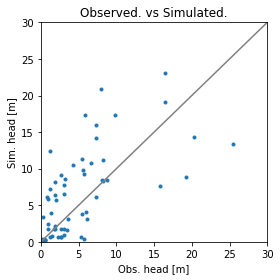

Error is - 8.544345772553669
Params are - [  3.70802506 156.77451021  16.70568022   0.57650148   0.32833246
   0.42024043]


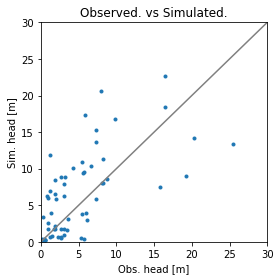

Error is - 8.547283175787454
Params are - [  3.57191174 157.37116659  16.58757507   0.5786445    0.34229256
   0.42321588]


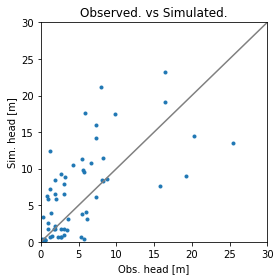

Error is - 8.544264752023961
Params are - [  3.59944681 156.92325862  16.71948691   0.57634594   0.32784615
   0.41963802]


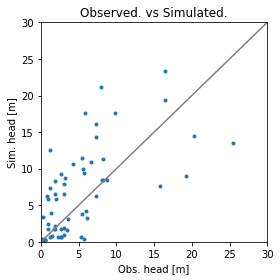

Error is - 8.544918996153742
Params are - [  3.65259463 157.11627791  16.74509768   0.57713655   0.32422242
   0.41929113]


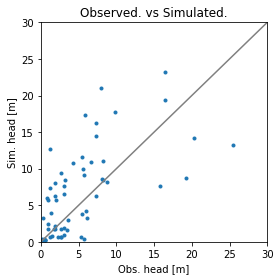

Error is - 8.546327784402985
Params are - [  3.81350552 157.06426881  16.76115146   0.57647898   0.32251181
   0.41868288]


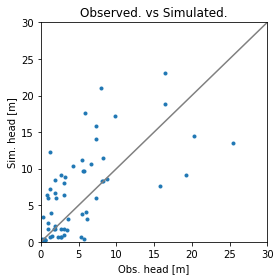

Error is - 8.544240818311172
Params are - [  3.54224836 157.06850151  16.67777007   0.57721025   0.33238715
   0.42082895]


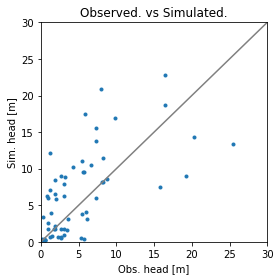

Error is - 8.545057703440728
Params are - [  3.5759581  157.00197784  16.64358751   0.57682101   0.33668989
   0.42144866]


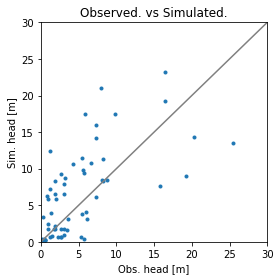

Error is - 8.54427096564254
Params are - [  3.6334355  157.08770289  16.71972014   0.57705766   0.32733929
   0.41983051]


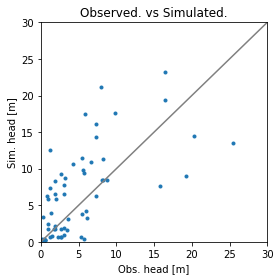

Error is - 8.544544271731912
Params are - [  3.6651024  156.37029333  16.72826412   0.57540222   0.32475164
   0.41973743]


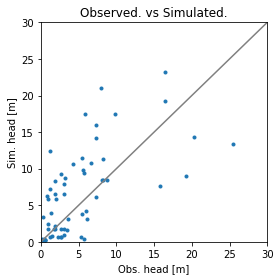

Error is - 8.544181650376286
Params are - [  3.64406346 156.67344438  16.71500955   0.5760969    0.32705256
   0.41998042]


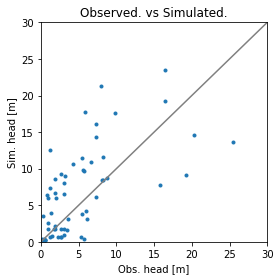

Error is - 8.545344569425536
Params are - [  3.51544535 156.86759801  16.75279067   0.57613231   0.32514976
   0.41910309]


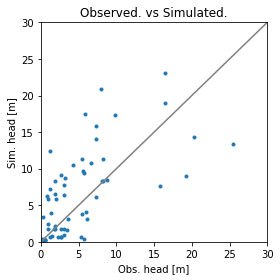

Error is - 8.544121889838431
Params are - [  3.6605878  156.9538163   16.68829156   0.57686734   0.33023572
   0.42052796]


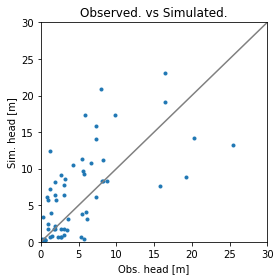

Error is - 8.544340502512481
Params are - [  3.7165796  156.80403435  16.68757213   0.57683813   0.3294463
   0.4205491 ]


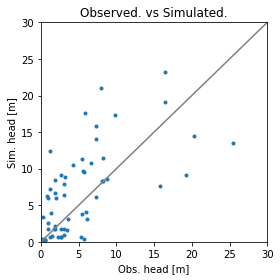

Error is - 8.544152689770756
Params are - [  3.55742879 157.06240914  16.69693656   0.57697059   0.32976993
   0.42021122]


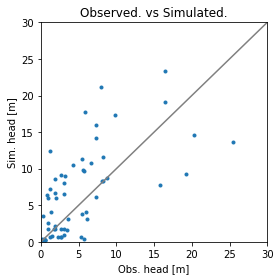

Error is - 8.544730940370732
Params are - [  3.49582397 157.11900994  16.71816613   0.5766781    0.32876396
   0.41978993]


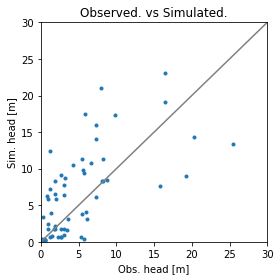

Error is - 8.544098326231342
Params are - [  3.66139069 156.88277824  16.69522063   0.57679812   0.32927572
   0.42035931]


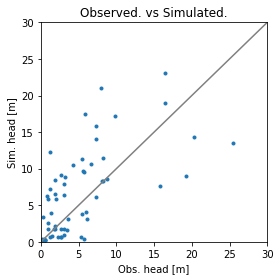

Error is - 8.544019646335014
Params are - [  3.58828647 156.76703317  16.67785162   0.57637205   0.33151646
   0.42068478]


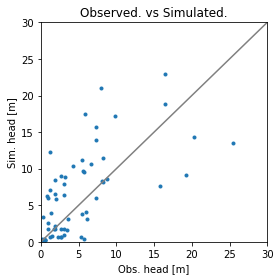

Error is - 8.544199132474406
Params are - [  3.56571196 156.60669832  16.65691737   0.57602924   0.33360504
   0.42111191]


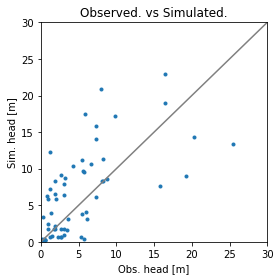

Error is - 8.544021343488584
Params are - [  3.61855504 156.87940229  16.66420642   0.57709248   0.33223303
   0.42122619]


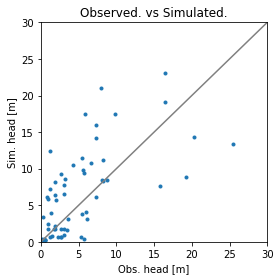

Error is - 8.544258092840936
Params are - [  3.70118906 156.67112634  16.70140205   0.5761889    0.32764066
   0.42016768]


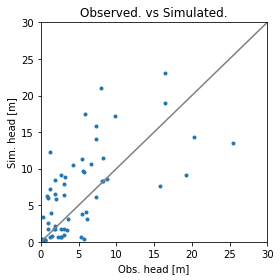

Error is - 8.544047261320822
Params are - [  3.58198353 156.96915772  16.68367806   0.57695491   0.33120053
   0.42066363]


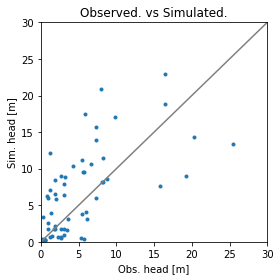

Error is - 8.5444318239784
Params are - [  3.57868065 157.16475458  16.65371874   0.57758827   0.3343579
   0.42124394]


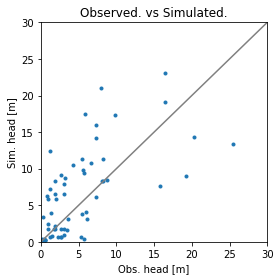

Error is - 8.544012343131918
Params are - [  3.62771776 156.79627193  16.69968685   0.57646974   0.3288789
   0.4202963 ]


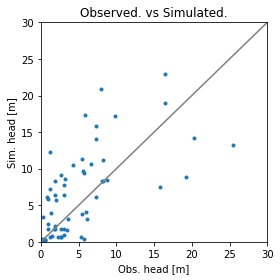

Error is - 8.544224870281854
Params are - [  3.68874498 156.68707742  16.67270849   0.57654762   0.33134352
   0.4210415 ]


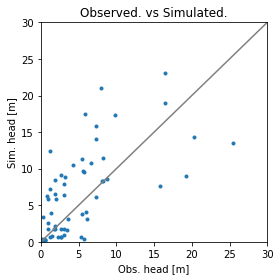

Error is - 8.544023423863822
Params are - [  3.59025783 156.96857621  16.69087954   0.57686485   0.33016333
   0.42041879]


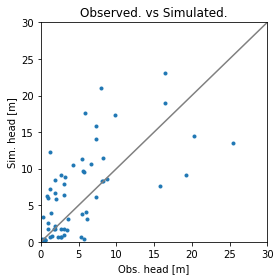

Error is - 8.544007472474767
Params are - [  3.56214264 156.80059022  16.68221615   0.57665004   0.33085359
   0.42068838]


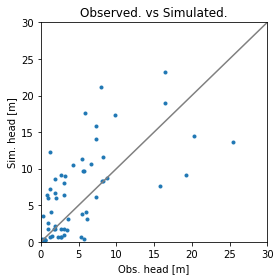

Error is - 8.544207583809502
Params are - [  3.51292006 156.72397717  16.67917845   0.57654139   0.33116253
   0.42076859]


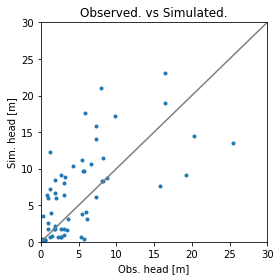

Error is - 8.544191754695204
Params are - [  3.52825707 156.84423227  16.67095225   0.5766699    0.33233956
   0.42096672]


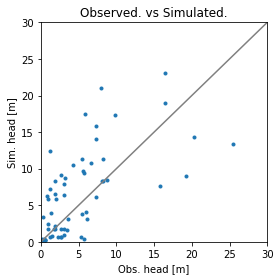

Error is - 8.543998404094026
Params are - [  3.62810729 156.87314175  16.68915354   0.57676607   0.33004168
   0.42051116]


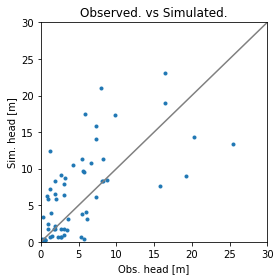

Error is - 8.543921132529917
Params are - [  3.62303881 156.72584747  16.68431998   0.57645016   0.33002847
   0.42061157]


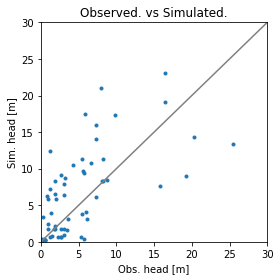

Error is - 8.543908076646252
Params are - [  3.64356645 156.60419235  16.68464094   0.57619778   0.32944244
   0.42058554]


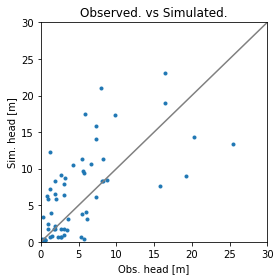

Error is - 8.543904018225914
Params are - [  3.63253405 156.6049677   16.67503896   0.57631787   0.33082537
   0.42091199]


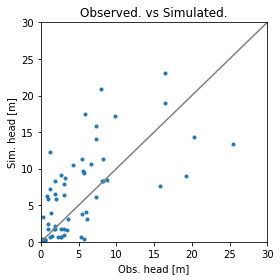

Error is - 8.543908668414991
Params are - [  3.65367216 156.42316344  16.66711867   0.57604438   0.33115639
   0.42115859]


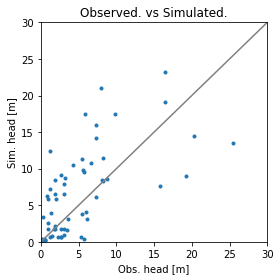

Error is - 8.544056908695266
Params are - [  3.60889651 156.60266341  16.70532293   0.57583204   0.32828645
   0.41999986]


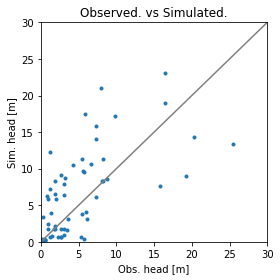

Error is - 8.543951768817015
Params are - [  3.61614041 156.81021757  16.67448555   0.57677737   0.33124638
   0.42091961]


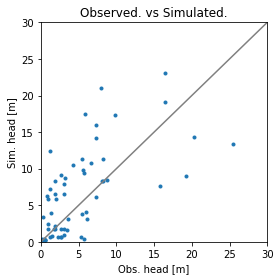

Error is - 8.543939520555183
Params are - [  3.64844973 156.72942733  16.6905557    0.57668757   0.328913
   0.42061955]


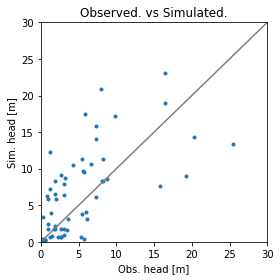

Error is - 8.543898270964347
Params are - [  3.6159291  156.67790705  16.66567677   0.57666249   0.33156192
   0.42111577]


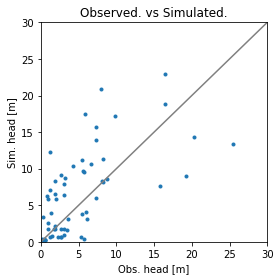

Error is - 8.54396637627
Params are - [  3.61003477 156.61872461  16.64867173   0.57675887   0.33290344
   0.42152551]


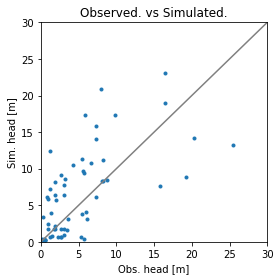

Error is - 8.544117278663718
Params are - [  3.69943303 156.63269437  16.67763433   0.57648634   0.32982334
   0.42086616]


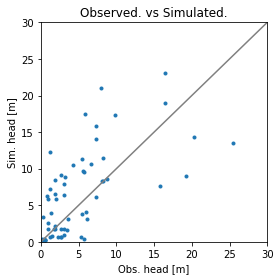

Error is - 8.543919606778923
Params are - [  3.59646524 156.75861626  16.6810707    0.57660912   0.33059603
   0.42073282]


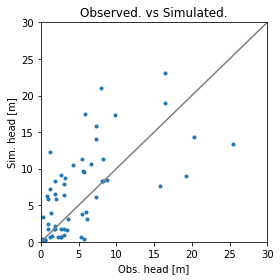

Error is - 8.543794709712266
Params are - [  3.62292104 156.52196767  16.66800267   0.576318     0.33082004
   0.42111727]


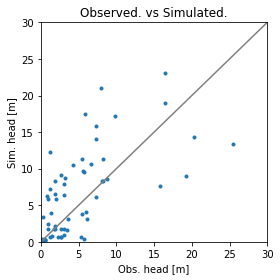

Error is - 8.543703672575726
Params are - [  3.62032792 156.34638063  16.65742723   0.57609397   0.33120921
   0.42142032]


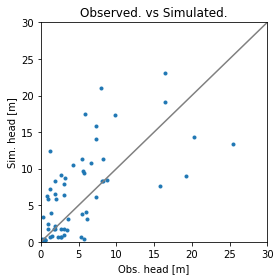

Error is - 8.543783095702024
Params are - [  3.63628375 156.43027953  16.67698455   0.5760789    0.32960294
   0.42087573]


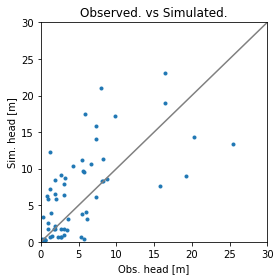

Error is - 8.543858319289713
Params are - [  3.59991911 156.41135384  16.65639068   0.5759658    0.33216631
   0.42126118]


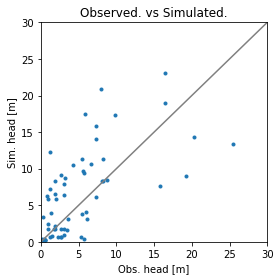

Error is - 8.543777596454252
Params are - [  3.65305489 156.26641078  16.65764901   0.57582982   0.3310067
   0.42132402]


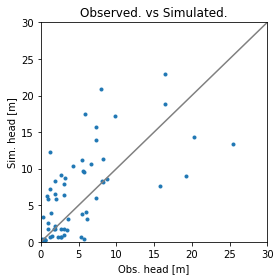

Error is - 8.543815537345163
Params are - [  3.60911649 156.30824082  16.64508146   0.5761185    0.33268171
   0.42171747]


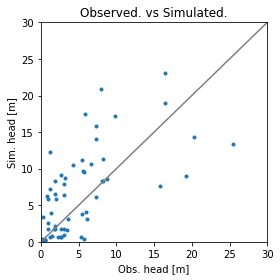

Error is - 8.543670037285425
Params are - [  3.61234303 156.20855652  16.64469761   0.57593196   0.33191756
   0.4216595 ]


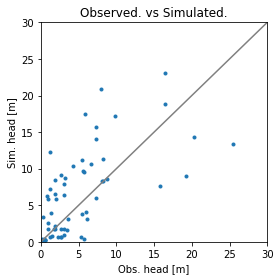

Error is - 8.543578539184148
Params are - [  3.60224753 156.01035093  16.62952693   0.575739     0.33246366
   0.42203326]


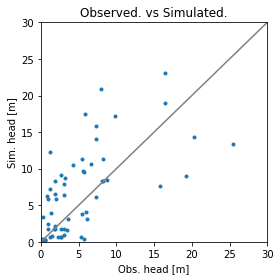

Error is - 8.543542860138272
Params are - [  3.62438746 155.91309846  16.64200985   0.5752795    0.33148159
   0.42176155]


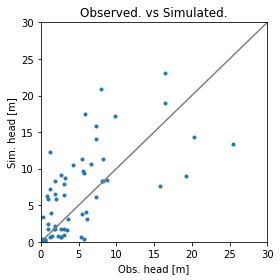

Error is - 8.543366014934337
Params are - [  3.62861664 155.53069417  16.6301764    0.57458801   0.33144142
   0.42208444]


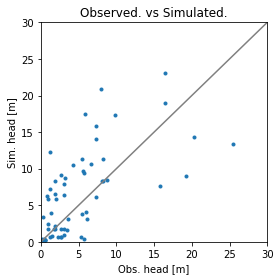

Error is - 8.543474280533301
Params are - [  3.64996329 155.88609845  16.64255785   0.57551693   0.33063558
   0.42189057]


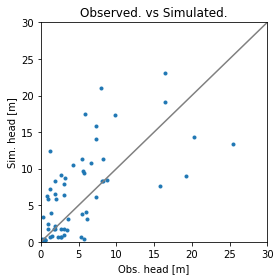

Error is - 8.543489222389699
Params are - [  3.65438152 155.84849734  16.65302586   0.5751637    0.32943812
   0.42149198]


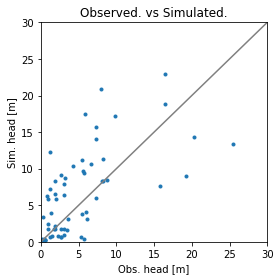

Error is - 8.54339493109857
Params are - [  3.63324684 155.53253123  16.61313654   0.57489824   0.33246196
   0.42253914]


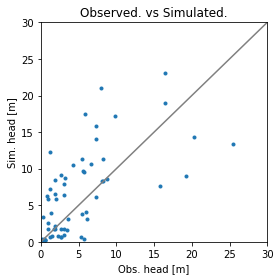

Error is - 8.54319821229545
Params are - [  3.60987302 155.45177347  16.61763459   0.5748368    0.33154328
   0.42249588]


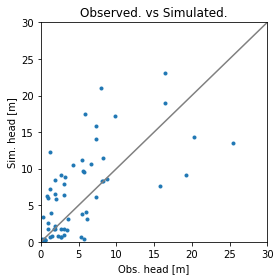

Error is - 8.54296037489699
Params are - [  3.58828209 155.04445482  16.59762738   0.57434029   0.33181158
   0.42308181]


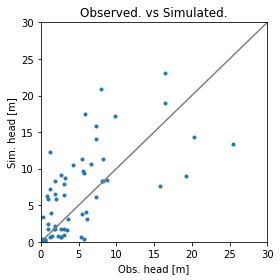

Error is - 8.542973953505612
Params are - [  3.63191805 154.93782835  16.59792309   0.5739881    0.33154156
   0.4229534 ]


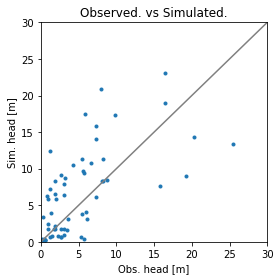

Error is - 8.542996766078744
Params are - [  3.65988862 154.91635053  16.61528878   0.57375942   0.32997974
   0.42264719]


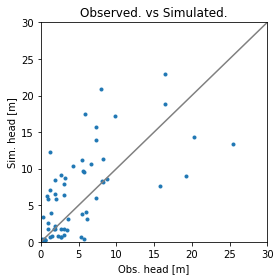

Error is - 8.543013052709624
Params are - [  3.60959033 154.76748851  16.57921082   0.57386663   0.33318582
   0.42357354]


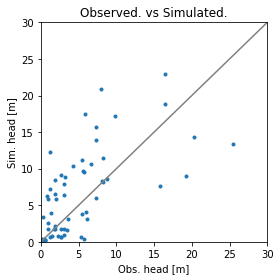

Error is - 8.542773729268358
Params are - [  3.6005509  154.35701742  16.56856315   0.5729633    0.33283845
   0.42373594]


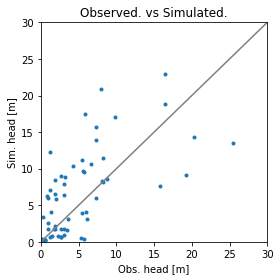

Error is - 8.542545709071184
Params are - [  3.5758447  153.59247691  16.53156581   0.57168648   0.33393989
   0.42465863]


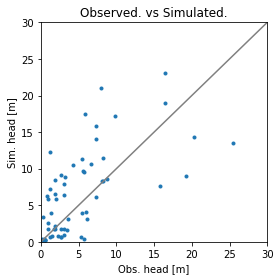

Error is - 8.54249688397851
Params are - [  3.5981333  154.06389986  16.57079422   0.5725114    0.33150471
   0.42379386]


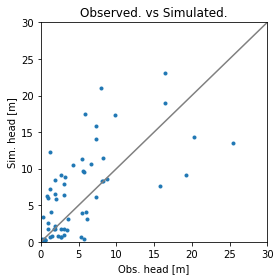

Error is - 8.542120538552377
Params are - [  3.58057653 153.32958417  16.54962305   0.57131798   0.33102608
   0.42442123]


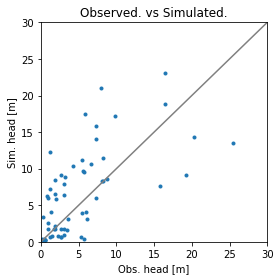

Error is - 8.54208468859137
Params are - [  3.58675014 153.33203359  16.52690324   0.57173162   0.3323868
   0.42502749]


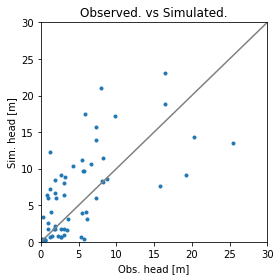

Error is - 8.541510430205573
Params are - [  3.56581688 152.2327033   16.47526667   0.57030343   0.33285949
   0.42649902]


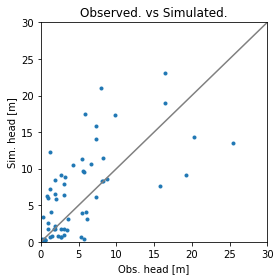

Error is - 8.541992606099308
Params are - [  3.5911853  153.25031085  16.54322077   0.57126527   0.33053363
   0.42451356]


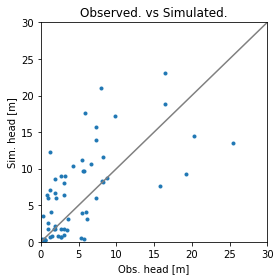

Error is - 8.542064946984326
Params are - [  3.5179859  152.54610227  16.48312014   0.57054109   0.33392433
   0.42606203]


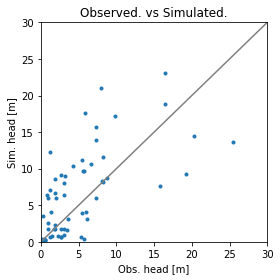

Error is - 8.541626983102143
Params are - [  3.50797908 151.72738243  16.46221819   0.56916342   0.33315677
   0.42679202]


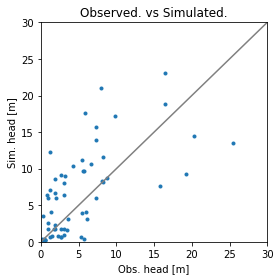

Error is - 8.540962623783509
Params are - [  3.52484738 150.51506516  16.41737749   0.5670856    0.33333516
   0.42790035]


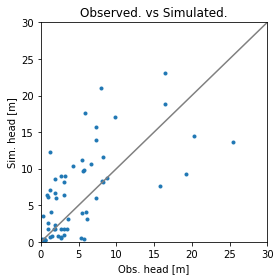

Error is - 8.540139416842244
Params are - [  3.49313002 148.25037033  16.32725255   0.56345826   0.33409695
   0.43030962]


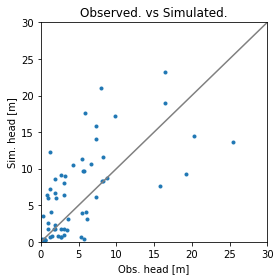

Error is - 8.540679493840008
Params are - [  3.50971321 150.18634088  16.41533465   0.56699667   0.3312592
   0.42820719]


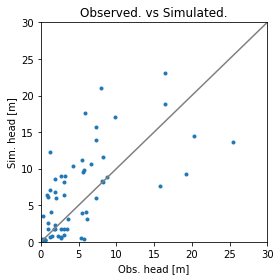

Error is - 8.540664963790777
Params are - [  3.48136027 149.40148584  16.3525146    0.56592474   0.33425071
   0.42970658]


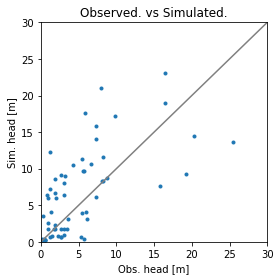

Error is - 8.539997899682767
Params are - [  3.53174235 149.13676227  16.37548233   0.56516284   0.33146125
   0.42928063]


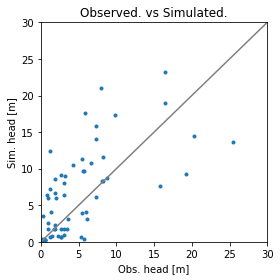

Error is - 8.53906139506599
Params are - [  3.53862057 147.43209227  16.32166343   0.56247371   0.33022971
   0.43088994]


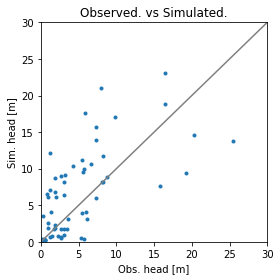

Error is - 8.53971615410733
Params are - [  3.44102138 146.4931475   16.24152926   0.56150814   0.33475065
   0.43295457]


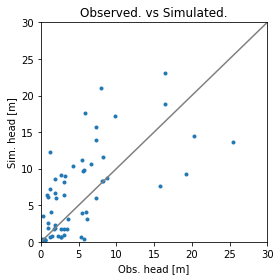

Error is - 8.538730932950829
Params are - [  3.50190836 146.27133094  16.24896887   0.56105823   0.33265879
   0.43273029]


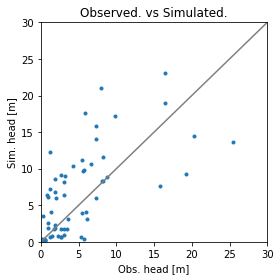

Error is - 8.537302050615054
Params are - [  3.49887299 143.5433052   16.14234421   0.55700563   0.3324098
   0.43569942]


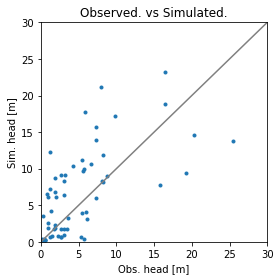

Error is - 8.538142911050624
Params are - [  3.42175593 142.86954404  16.12494623   0.55548561   0.33280618
   0.43609009]


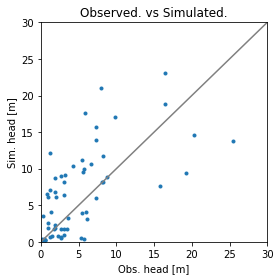

Error is - 8.537681356603871
Params are - [  3.44854051 142.47697418  16.08808211   0.55495536   0.33492213
   0.43700954]


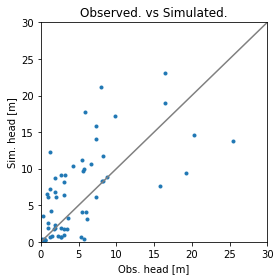

Error is - 8.536530712859848
Params are - [  3.46595354 140.95365866  16.06275799   0.55237083   0.33215443
   0.43794448]


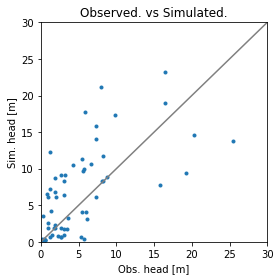

Error is - 8.53460954401419
Params are - [  3.45825017 136.72974507  15.91787969   0.54559387   0.3311063
   0.44206342]


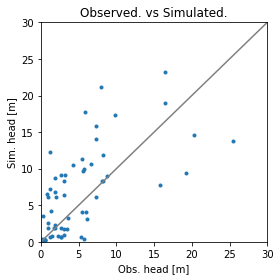

Error is - 8.535380240411977
Params are - [  3.44255717 138.26456576  15.95156242   0.54888251   0.33131131
   0.44125938]


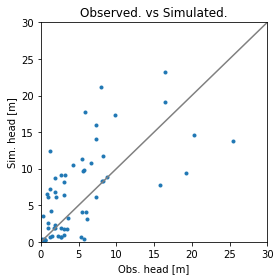

Error is - 8.53434643484975
Params are - [  3.49517774 137.27892801  15.9406301    0.54662409   0.32951116
   0.4413827 ]


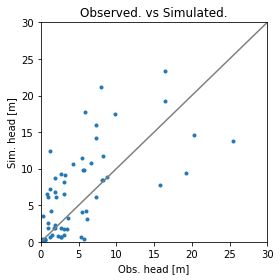

Error is - 8.53208050666249
Params are - [  3.52225592 132.67181827  15.79018052   0.53918207   0.32689142
   0.44559676]


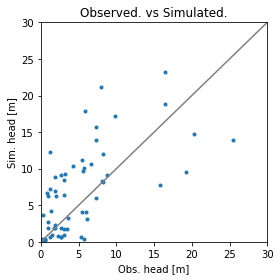

Error is - 8.533177536986685
Params are - [  3.39212366 131.41989191  15.68333496   0.53789464   0.33291934
   0.4483496 ]


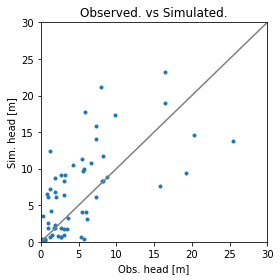

Error is - 8.531564402851508
Params are - [  3.49911088 132.16588942  15.7328484    0.53901908   0.33038059
   0.44723595]


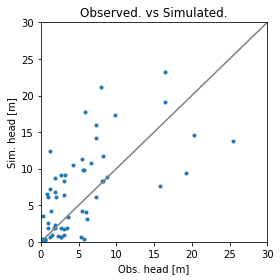

Error is - 8.528358887863646
Params are - [  3.53778836 126.81406212  15.53679949   0.53078582   0.32916779
   0.45280889]


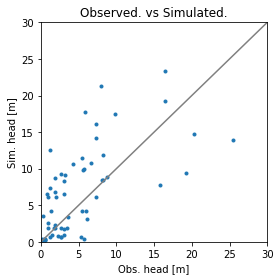

Error is - 8.529730859342132
Params are - [  3.50207558 127.33748859  15.58595166   0.53149282   0.32634652
   0.45158295]


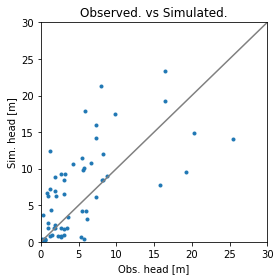

Error is - 8.527560728724215
Params are - [  3.45281062 120.8692187   15.34622538   0.52093829   0.32683776
   0.45818758]


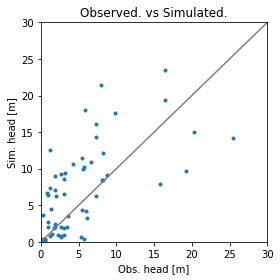

Error is - 8.523938282070981
Params are - [  3.42977943 109.53217545  14.94816596   0.50290461   0.32405173
   0.46943166]


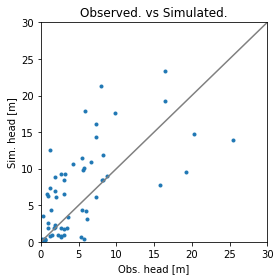

Error is - 8.524779445991078
Params are - [  3.5048672  116.57049471  15.20254167   0.51373543   0.32551639
   0.46201838]


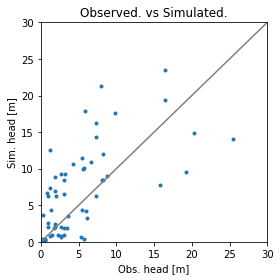

Error is - 8.522609772487385
Params are - [  3.50471321 111.38556528  14.9977784    0.5064046    0.3238581
   0.46786599]


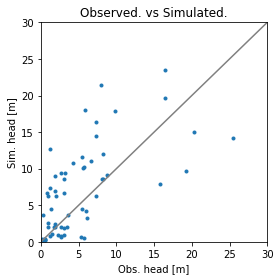

Error is - 8.517615761075186
Params are - [ 3.52794473 98.71347538 14.53772776  0.48680996  0.320234    0.48076727]


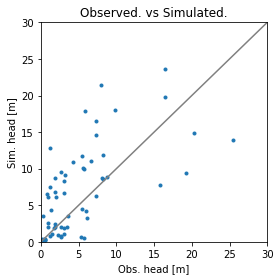

Error is - 8.520823480935512
Params are - [  3.61611342 105.7932796   14.85045406   0.4970756    0.31781662
   0.4723857 ]


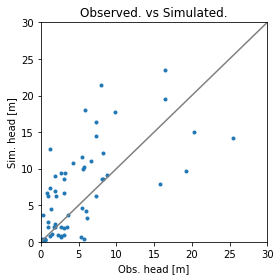

Error is - 8.516174458727845
Params are - [ 3.51726699 95.58184035 14.43036634  0.48175268  0.3208196   0.48406819]


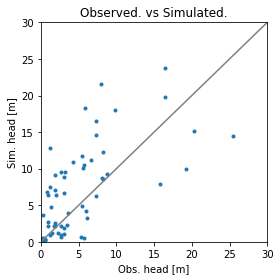

Error is - 8.509828147488705
Params are - [ 3.51477252 77.03685139 13.75045925  0.45303798  0.31778369  0.5033039 ]


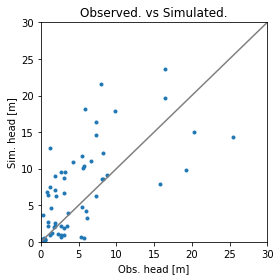

Error is - 8.511631813056452
Params are - [ 3.54167964 84.14929096 14.02276441  0.46329031  0.31851022  0.49532232]


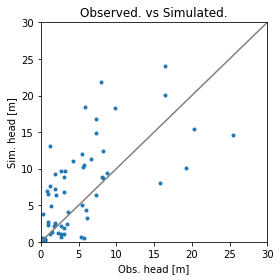

Error is - 8.513278133182386
Params are - [ 3.50726396 70.45112704 13.56723821  0.44149882  0.31213643  0.50826752]


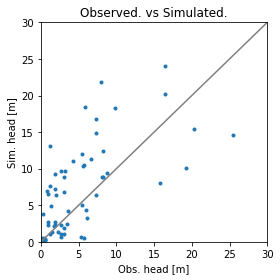

Error is - 8.510288636219355
Params are - [ 3.54098403 65.32157189 13.35639488  0.43447033  0.31132784  0.51447441]


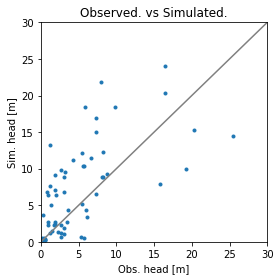

Error is - 8.505683252736963
Params are - [ 3.65314    57.62302331 13.08018023  0.42248972  0.3085512   0.52207538]


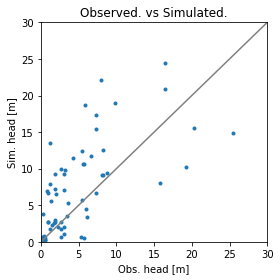

Error is - 8.50566182938786
Params are - [ 3.76482028 31.66844723 12.14618737  0.38228227  0.30080093  0.54839725]


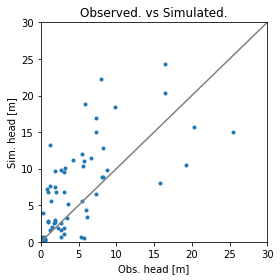

Error is - 8.50712374095389
Params are - [ 3.51637497 36.6536417  12.2764699   0.39005429  0.30911442  0.54445852]


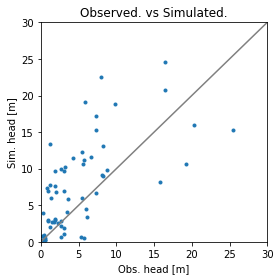

Error is - 8.515724124209207
Params are - [ 3.60068707 23.04683469 11.83544358  0.36806804  0.30299051  0.55730737]


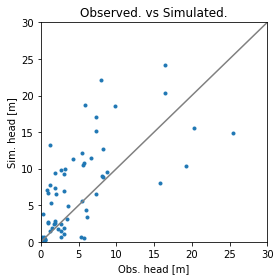

Error is - 8.506163599256983
Params are - [ 3.58250148 41.96349486 12.51101462  0.39775352  0.30730138  0.53817234]


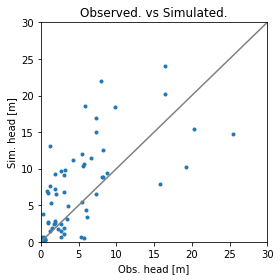

Error is - 8.498968590938777
Params are - [ 3.64644702 41.81330564 12.4538586   0.39879742  0.3094764   0.53977539]


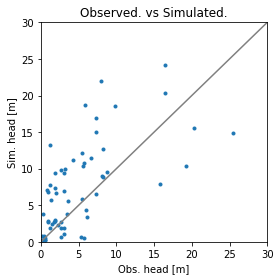

Error is - 8.49575919339185
Params are - [ 3.71603855 27.49439493 11.89716879  0.37744672  0.30814639  0.55552932]


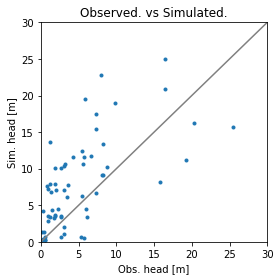

Error is - 8.558887008977466
Params are - [ 3.67015097  9.23017638 11.28980053  0.34839139  0.299648    0.5727896 ]


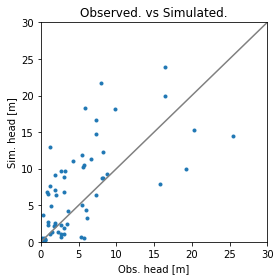

Error is - 8.506052689888831
Params are - [ 3.57379747 65.41951231 13.33952344  0.43456558  0.31379466  0.51468914]


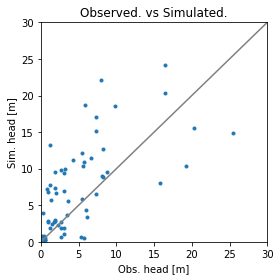

Error is - 8.498779569470202
Params are - [ 3.68178439 28.09054225 11.95054624  0.37724312  0.30765266  0.55370908]


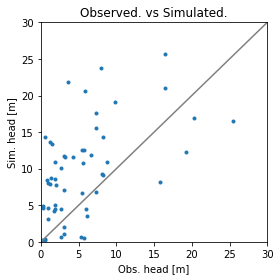

Error is - 14.143372739595492
Params are - [ 3.76366653  0.05982638 10.95651087  0.33341052  0.29781979  0.58168132]


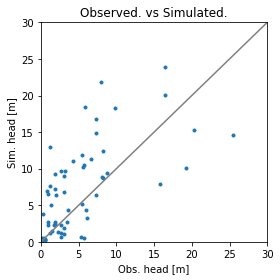

Error is - 8.503807599994452
Params are - [ 3.57699602 57.79259513 13.05197216  0.42313111  0.31279272  0.52289825]


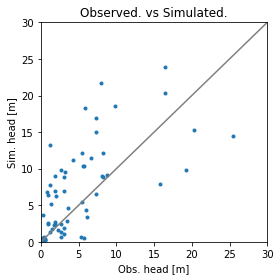

Error is - 8.497325030820573
Params are - [ 3.7822711  47.48935388 12.68900097  0.40741982  0.30771516  0.53333994]


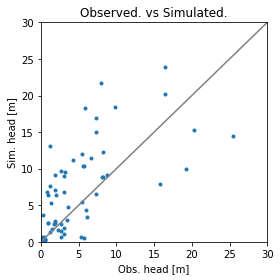

Error is - 8.493099413740703
Params are - [ 3.78273445 44.02145372 12.51378503  0.40294269  0.30966612  0.53801532]


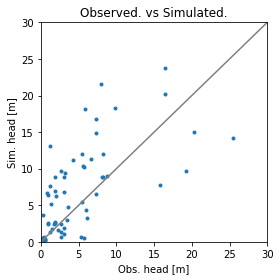

Error is - 8.4886100935312
Params are - [ 3.88285094 45.05043314 12.51517023  0.40553728  0.3108485   0.53793681]


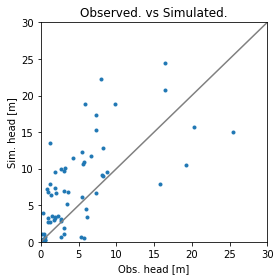

Error is - 8.510347167691506
Params are - [ 3.89445629 13.77574321 11.41049181  0.35645452  0.30219078  0.56924775]


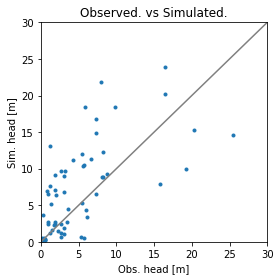

Error is - 8.500412578698272
Params are - [ 3.65396218 52.50857004 12.85726553  0.41503782  0.31089369  0.52832879]


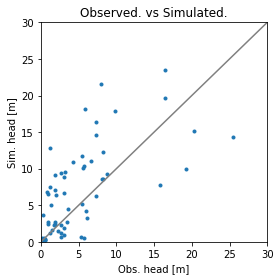

Error is - 8.493028895060315
Params are - [ 3.66648078 54.47351589 12.84085394  0.41965635  0.31854877  0.52885015]


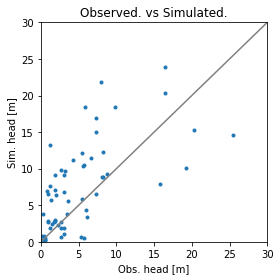

Error is - 8.486595581339895
Params are - [ 3.88413329 27.24300824 11.86469641  0.37764925  0.30847567  0.55633311]


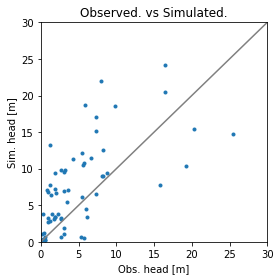

Error is - 8.500536435003559
Params are - [ 4.03770192 11.96821479 11.27105854  0.35490832  0.30631715  0.57305054]


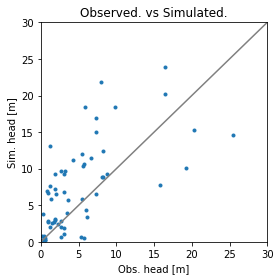

Error is - 8.485646133443668
Params are - [ 3.88389084 24.10517941 11.72854666  0.3732797   0.30956869  0.56023735]


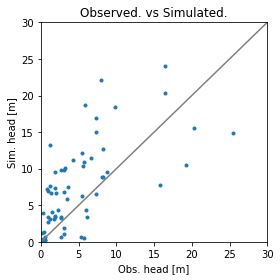

Error is - 8.509050446478094
Params are - [ 3.99885517  9.90348409 11.16418723  0.35240063  0.30890618  0.57619163]


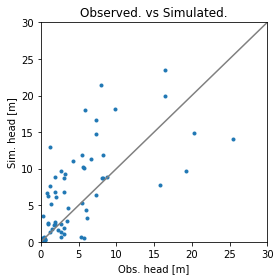

Error is - 8.485820209172529
Params are - [ 3.92343743 47.19475291 12.56126609  0.40975325  0.3134484   0.53703315]


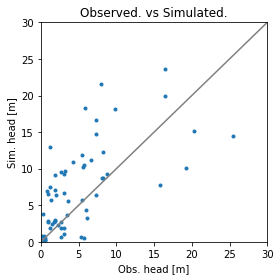

Error is - 8.479107442738783
Params are - [ 3.87000618 27.69774097 11.78023307  0.38035436  0.31529698  0.55863336]


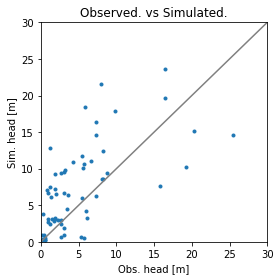

Error is - 8.478785332352889
Params are - [ 3.91387372 17.80193451 11.32584913  0.36682164  0.31908789  0.57128006]


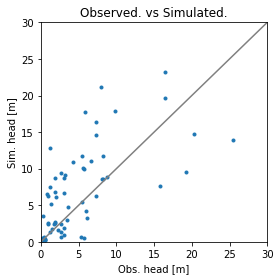

Error is - 8.478944821821832
Params are - [ 4.00218378 44.46187977 12.38162537  0.40678577  0.31851292  0.54169422]


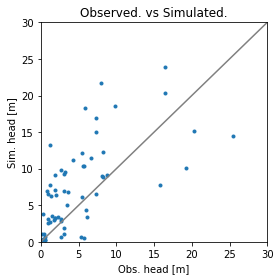

Error is - 8.48524295079881
Params are - [ 4.16364255 14.14554677 11.28486402  0.36028594  0.30809859  0.57265475]


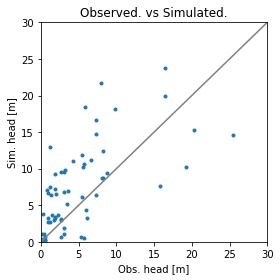

Error is - 8.48518442921347
Params are - [ 4.0408696  13.26700073 11.20044566  0.35932124  0.31488223  0.57514074]


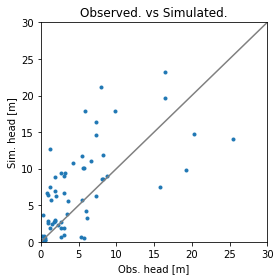

Error is - 8.46871535679839
Params are - [ 4.09183269 26.41575646 11.62950257  0.38109992  0.31939057  0.56301364]


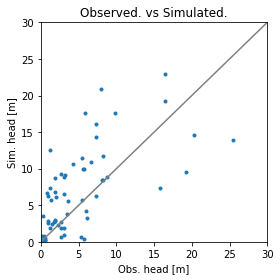

Error is - 8.464424146336649
Params are - [ 4.19568239 26.00213057 11.51190564  0.38282526  0.32484801  0.56635391]


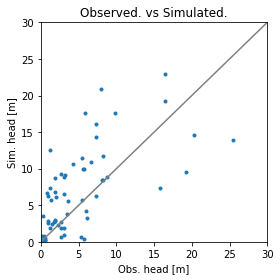

Error is - 8.464424146336649
Params are - [ 4.14327686 -0.60019566 10.58314607  0.34001993  0.31821771  0.5920872 ]


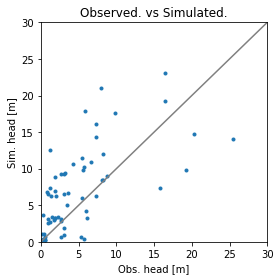

Error is - 8.468567538114568
Params are - [ 4.26928546 14.25425283 11.0340653   0.36540689  0.32498043  0.57949961]


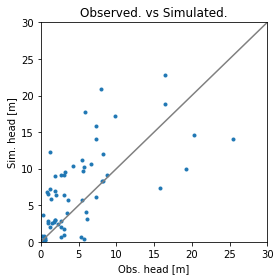

Error is - 8.467176452368715
Params are - [ 4.02474805 24.25012081 11.39414837  0.38010763  0.33207781  0.56936383]


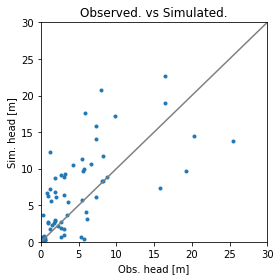

Error is - 8.465650971035947
Params are - [ 4.14214715 28.78970688 11.54313429  0.38800114  0.33102603  0.5649522 ]


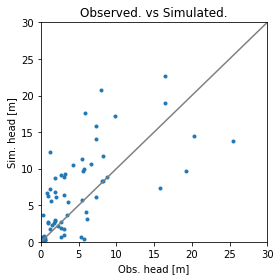

Error is - 8.465650971035947
Params are - [ 4.22748743 -7.62922979 10.08245757  0.33427506  0.33156637  0.60615138]


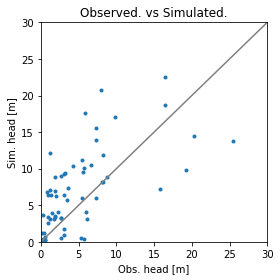

Error is - 8.476038485896638
Params are - [ 4.4203354  10.5536607  10.72376995  0.36339034  0.33515089  0.58818931]


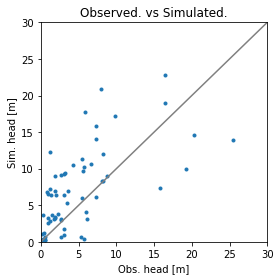

Error is - 8.471832563508633
Params are - [ 4.29371998 12.36572915 10.87428975  0.36424816  0.33113514  0.583962  ]


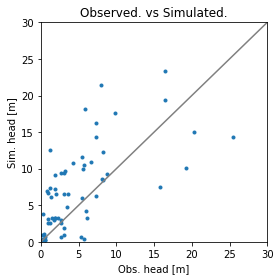

Error is - 8.473475581554581
Params are - [ 4.04048914 15.98986606 11.17532933  0.36596381  0.32310364  0.57550737]


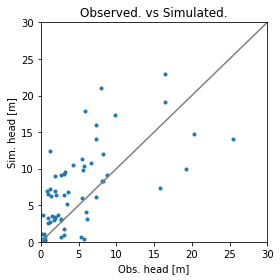

Error is - 8.471073505926556
Params are - [ 4.23041227 13.27176338 10.94954964  0.36467707  0.32912727  0.58184834]


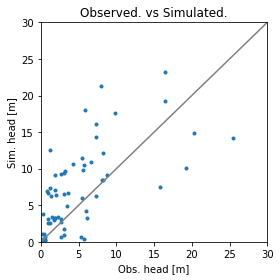

Error is - 8.471924889537856
Params are - [ 4.10379685 15.08383183 11.10006944  0.3655349   0.32511152  0.57762103]


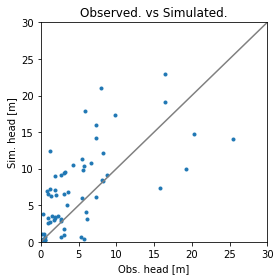

Error is - 8.470997807768958
Params are - [ 4.19875841 13.72478049 10.98717959  0.36489153  0.32812333  0.58079152]


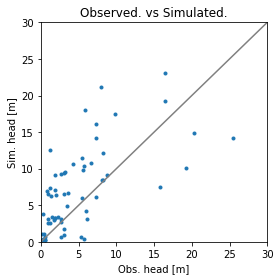

Error is - 8.47142715566206
Params are - [ 4.1354507  14.63081472 11.06243949  0.36532044  0.32611546  0.57867786]


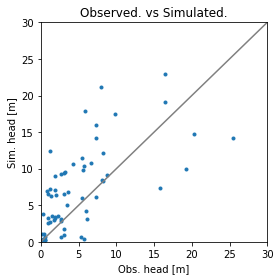

Error is - 8.471033341571601
Params are - [ 4.18293148 13.95128905 11.00599457  0.36499876  0.32762136  0.5802631 ]


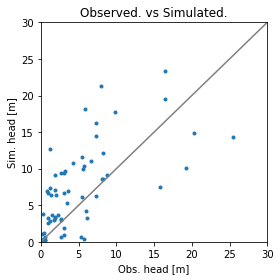

Error is - 8.47655856076232
Params are - [ 4.16947962 12.70096746 11.04752586  0.36142259  0.32153286  0.57922055]


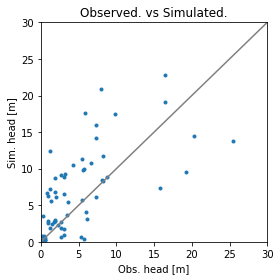

Error is - 8.464772961373528
Params are - [ 4.16891477 27.39591873 11.52751997  0.3854132   0.32793702  0.56565306]


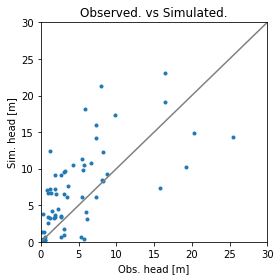

Error is - 8.48843240987445
Params are - [ 4.21158491  9.18645039 10.7971816   0.35855016  0.32820719  0.58625264]


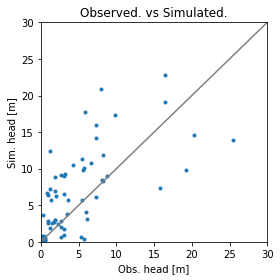

Error is - 8.465282942671928
Params are - [ 4.11021522 25.12612569 11.45302701  0.38146645  0.32846291  0.56785887]


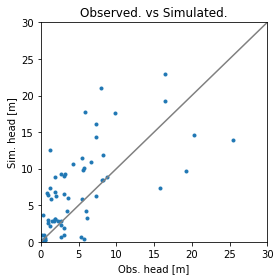

Error is - 8.463786560947856
Params are - [ 4.23248393 20.1281917  11.27298547  0.37411608  0.32491422  0.57292676]


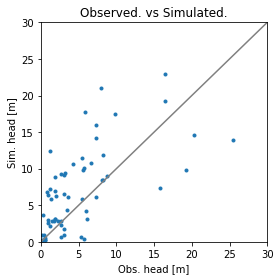

Error is - 8.464271207049551
Params are - [ 4.1972204  19.86345553 11.24954262  0.37385839  0.32648567  0.57357271]


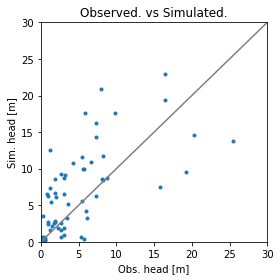

Error is - 8.469161802807225
Params are - [ 4.14641387 34.5524795  11.89032058  0.39448383  0.32318637  0.55560931]


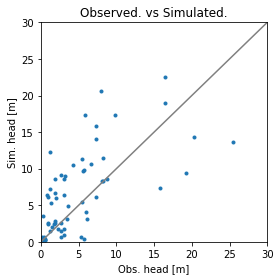

Error is - 8.47029915266789
Params are - [ 4.18083057 38.32179978 11.92090791  0.4026318   0.33041188  0.55477098]


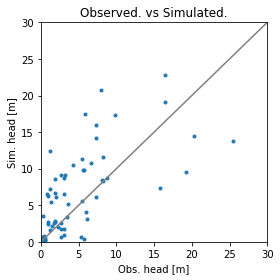

Error is - 8.46654949445102
Params are - [ 4.17799283 31.9165917  11.70256239  0.3923295   0.32819212  0.56088338]


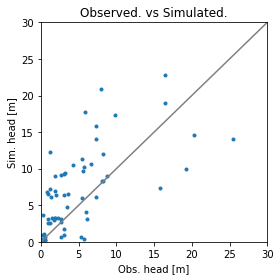

Error is - 8.467048182943927
Params are - [ 4.21442264 15.59165847 11.01552712  0.36885246  0.33042695  0.58014025]


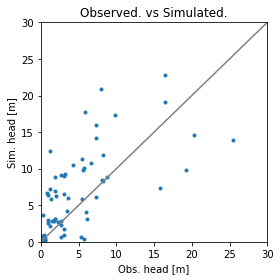

Error is - 8.463833082304845
Params are - [ 4.19742045 20.33186373 11.23422548  0.3752603   0.3286168   0.57400752]


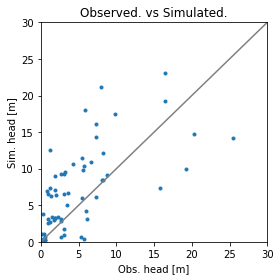

Error is - 8.470359993505435
Params are - [ 4.18931955 14.36597028 11.047173    0.36531705  0.32556276  0.5792409 ]


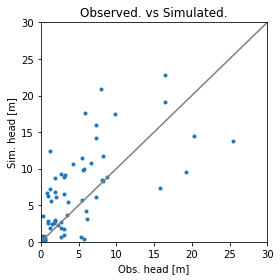

Error is - 8.464693186186546
Params are - [ 4.18082451 27.52893635 11.53871505  0.38557639  0.32753478  0.56547276]


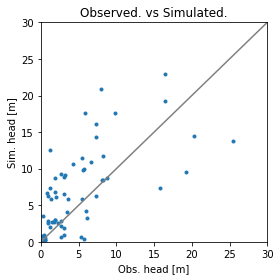

Error is - 8.462615342672269
Params are - [ 4.2806336  21.95737318 11.32527107  0.37755009  0.32498259  0.57147003]


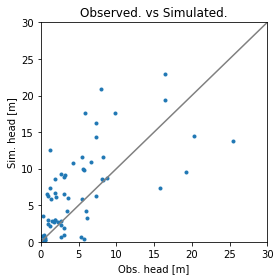

Error is - 8.461979383233047
Params are - [ 4.36584278 20.37299692 11.26139311  0.37559192  0.32324243  0.57327562]


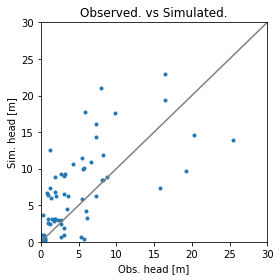

Error is - 8.464407720318064
Params are - [ 4.28757672 17.34660621 11.16206916  0.37032958  0.32394362  0.5762167 ]


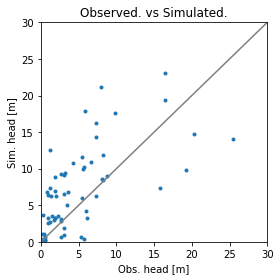

Error is - 8.468794562969482
Params are - [ 4.31125104 13.81947854 11.02532545  0.36508412  0.32314881  0.57997831]


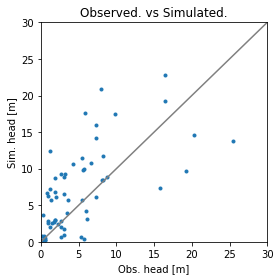

Error is - 8.463521356487451
Params are - [ 4.21343114 24.10157189 11.41036765  0.38045332  0.32643829  0.56909915]


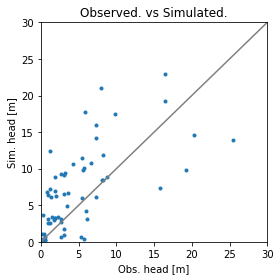

Error is - 8.466652687346405
Params are - [ 4.30230942 14.71276476 11.01828885  0.36704461  0.32636567  0.58001224]


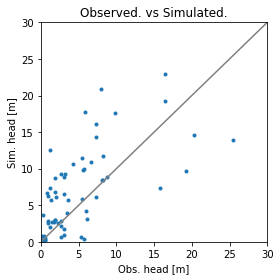

Error is - 8.463496095374913
Params are - [ 4.22233915 23.17978912 11.38850145  0.37888009  0.32522743  0.56976849]


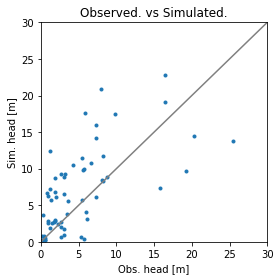

Error is - 8.463954923728915
Params are - [ 4.18866923 25.31268342 11.44360277  0.38239045  0.327698    0.56800005]


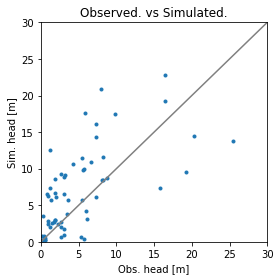

Error is - 8.462845361257076
Params are - [ 4.27617516 24.6122434  11.42081602  0.38170566  0.32556005  0.56878648]


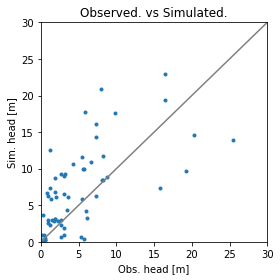

Error is - 8.463042406431727
Params are - [ 4.31389497 18.92953549 11.21916029  0.37294534  0.32363508  0.57462129]


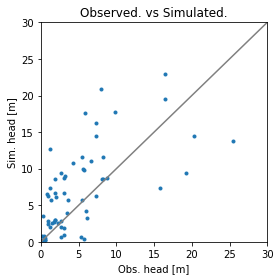

Error is - 8.463068411613747
Params are - [ 4.34396859 23.44291244 11.42351584  0.37930383  0.32105569  0.56881841]


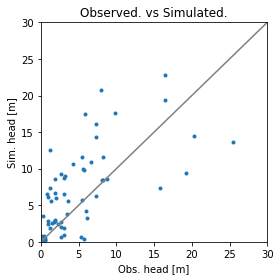

Error is - 8.462539829458942
Params are - [ 4.34606667 24.75149139 11.43493265  0.38217731  0.3234721   0.56852972]


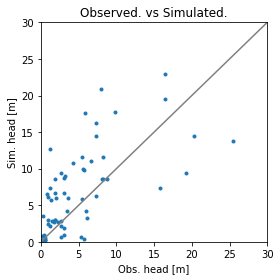

Error is - 8.462148541002986
Params are - [ 4.4093313  20.99475103 11.30573881  0.37641473  0.32095931  0.57216752]


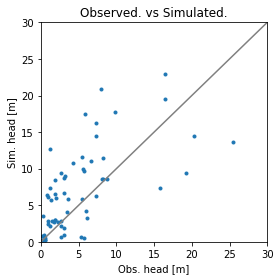

Error is - 8.461747957160519
Params are - [ 4.46275401 21.18818777 11.30001746  0.37716617  0.32074746  0.57229785]


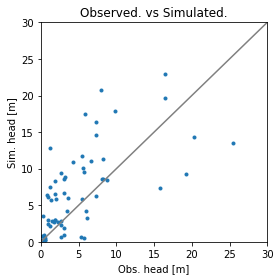

Error is - 8.461886461942337
Params are - [ 4.58296145 20.1923871  11.25577547  0.37630921  0.31850748  0.57356253]


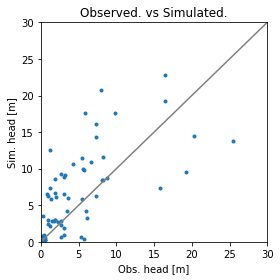

Error is - 8.461442821787744
Params are - [ 4.38071971 20.17348956 11.22383693  0.37602988  0.32481645  0.57440775]


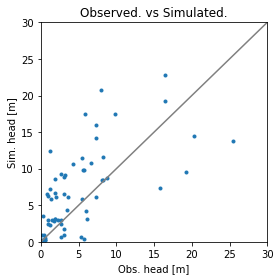

Error is - 8.461380342238664
Params are - [ 4.39909526 18.53877811 11.12399748  0.3743929   0.32669683  0.57720242]


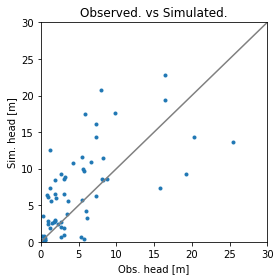

Error is - 8.461848902487795
Params are - [ 4.43919343 24.55661405 11.39647155  0.38287089  0.32325765  0.56946525]


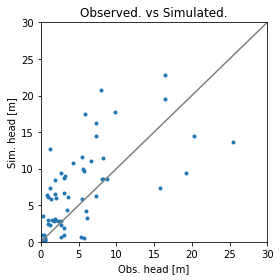

Error is - 8.461413225197886
Params are - [ 4.53125266 18.85536303 11.18670099  0.37449898  0.32056521  0.57552631]


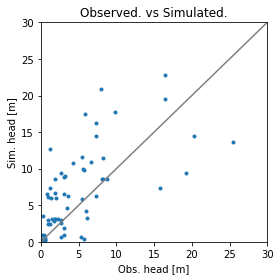

Error is - 8.461985605959487
Params are - [ 4.52308981 16.75073891 11.08984048  0.37146788  0.3216842   0.57811527]


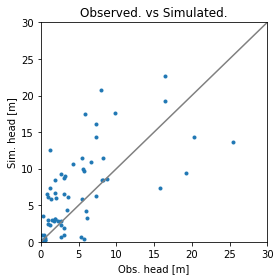

Error is - 8.460601896742316
Params are - [ 4.49774469 19.09280857 11.14706822  0.37558152  0.32443862  0.57646005]


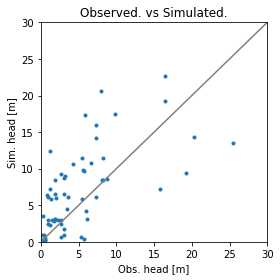

Error is - 8.460356487642926
Params are - [ 4.54195138 18.14183734 11.06773292  0.37516491  0.32617828  0.57860631]


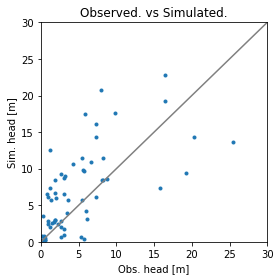

Error is - 8.461571549095659
Params are - [ 4.39027337 23.80052016 11.35559735  0.38176071  0.32521176  0.57067598]


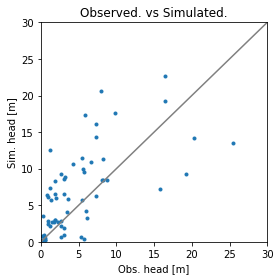

Error is - 8.46034068761292
Params are - [ 4.55566392 21.3207699  11.21544614  0.37969293  0.32430997  0.57464909]


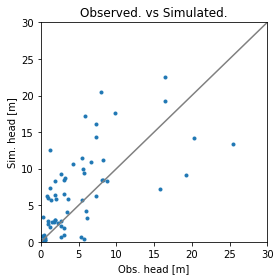

Error is - 8.460375463632447
Params are - [ 4.65057449 21.79465639 11.19247266  0.38174344  0.32484373  0.57533583]


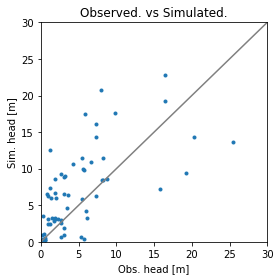

Error is - 8.461802521569396
Params are - [ 4.52113677 16.05853806 11.0200259   0.37135464  0.32464552  0.58018741]


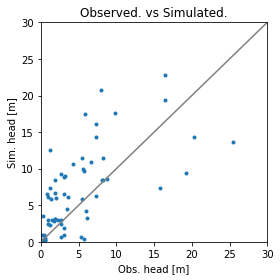

Error is - 8.46083586504146
Params are - [ 4.50065094 18.18305706 11.11413731  0.3742337   0.32429855  0.57750687]


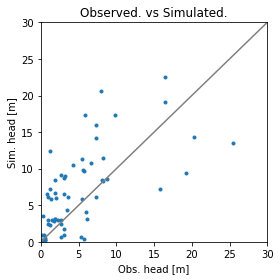

Error is - 8.460396679917533
Params are - [ 4.5102085  18.42525409 11.05451994  0.37608187  0.3283394   0.57909114]


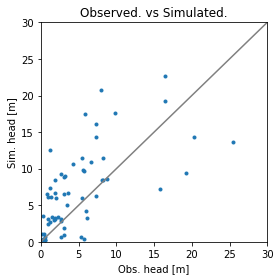

Error is - 8.463089154754746
Params are - [ 4.62266752 14.02116635 10.89858091  0.36959439  0.32491765  0.58351807]


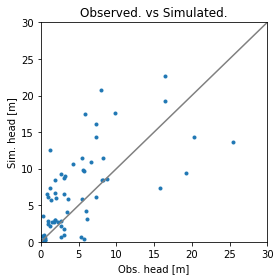

Error is - 8.46073482072503
Params are - [ 4.44837191 21.35568171 11.24134324  0.37871913  0.32513823  0.5738865 ]


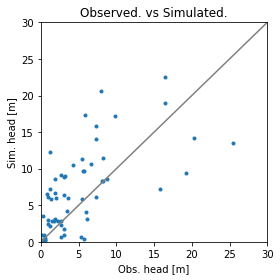

Error is - 8.4607780185228
Params are - [ 4.45406131 19.79976305 11.08569136  0.37826284  0.33108854  0.57812114]


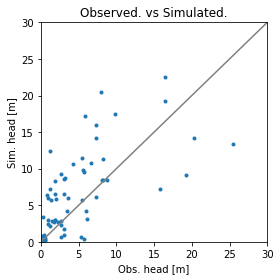

Error is - 8.460009012852092
Params are - [ 4.60454072 20.53667627 11.13562616  0.3796589   0.32642083  0.57675127]


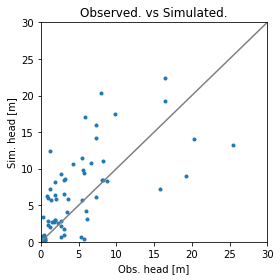

Error is - 8.460478444374035
Params are - [ 4.70726345 21.53562535 11.1414405   0.38229189  0.32628283  0.5765257 ]


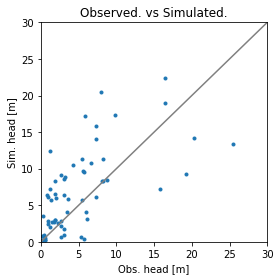

Error is - 8.460411814422928
Params are - [ 4.53761497 21.67693706 11.15264928  0.38162649  0.32952653  0.57619495]


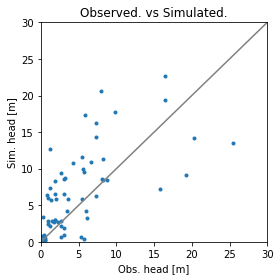

Error is - 8.46052501123673
Params are - [ 4.61205582 20.68595575 11.20341454  0.37871857  0.32221587  0.57493862]


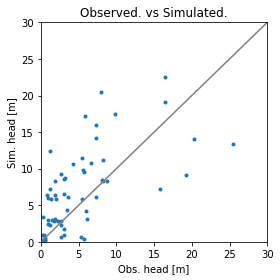

Error is - 8.459924988050618
Params are - [ 4.67230653 18.9067951  11.03511975  0.3782621   0.32719206  0.57952396]


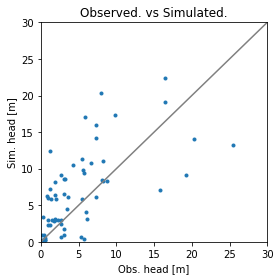

Error is - 8.460385605981312
Params are - [ 4.78427385 17.68235179 10.93200801  0.37803358  0.32821897  0.58234269]


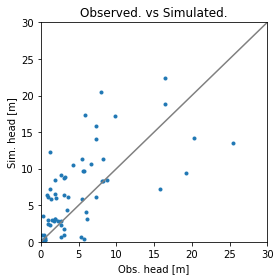

Error is - 8.460657696564388
Params are - [ 4.52870619 18.98346751 11.01695019  0.37811049  0.33177315  0.58000029]


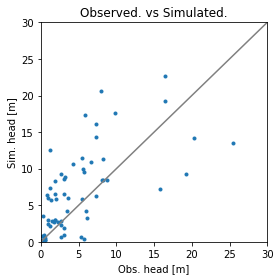

Error is - 8.460095551373652
Params are - [ 4.59121842 20.26033369 11.15679845  0.37856655  0.32460519  0.57620404]


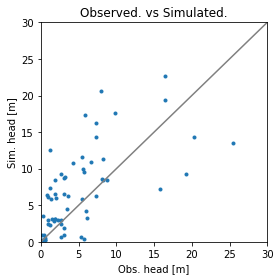

Error is - 8.460618604621054
Params are - [ 4.62101485 17.52028507 11.06909852  0.3741826   0.32282204  0.57874699]


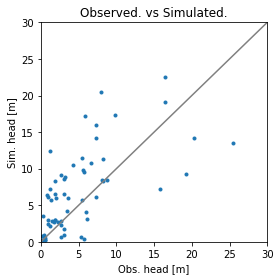

Error is - 8.460073772186444
Params are - [ 4.55846494 20.63777407 11.13176159  0.37976552  0.32785041  0.57683296]


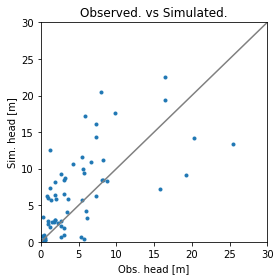

Error is - 8.460455476866656
Params are - [ 4.66450681 21.5094747  11.19297507  0.38095509  0.32384617  0.57509807]


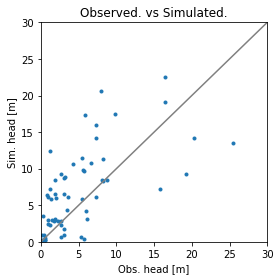

Error is - 8.46006230216609
Params are - [ 4.54878307 19.19630924 11.08913372  0.37730018  0.32721609  0.57809288]


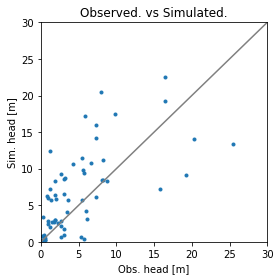

Error is - 8.460399163100872
Params are - [ 4.63504115 22.14438208 11.18689568  0.38258382  0.32635324  0.57541175]


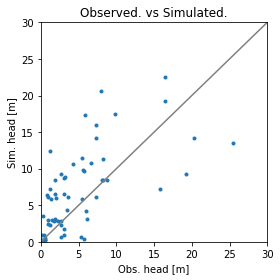

Error is - 8.460047163461429
Params are - [ 4.56522383 19.14247353 11.09752361  0.37701963  0.32622202  0.57780767]


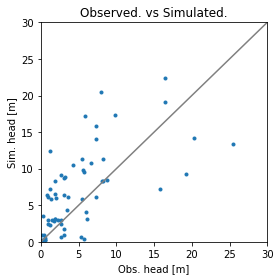

Error is - 8.460118408069784
Params are - [ 4.62451525 18.23935073 10.99987495  0.37716469  0.3288589   0.58042183]


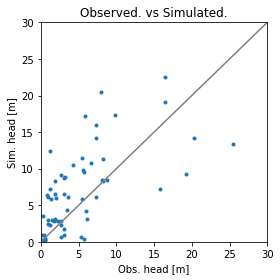

Error is - 8.459957176442677
Params are - [ 4.60730242 19.00970552 11.05376775  0.37779675  0.32772167  0.57897865]


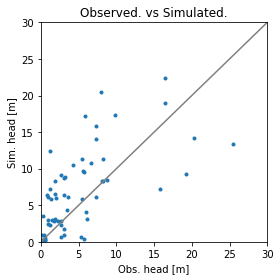

Error is - 8.460152837530684
Params are - [ 4.59432209 18.88291089 11.02417908  0.37803447  0.3296025   0.57979176]


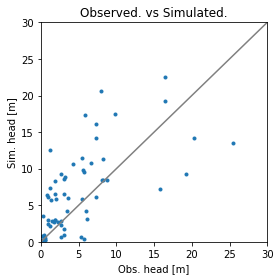

Error is - 8.459970876190607
Params are - [ 4.59199433 19.91597799 11.12364361  0.37843353  0.32585452  0.57710097]


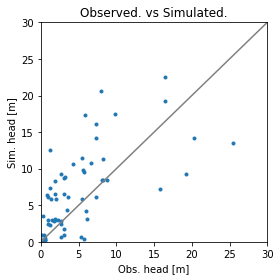

Error is - 8.460005922323967
Params are - [ 4.63825203 18.26487182 11.04650995  0.37639151  0.32569199  0.57925217]


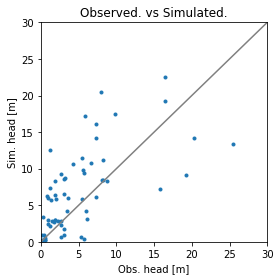

Error is - 8.459947164006348
Params are - [ 4.67775688 19.3958575  11.07492989  0.37855396  0.32581826  0.57837869]


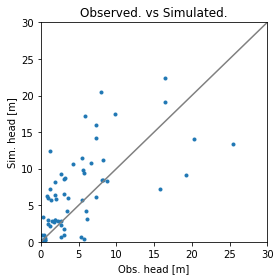

Error is - 8.459987109410115
Params are - [ 4.69882715 19.53415454 11.05900876  0.37934595  0.32667775  0.57885423]


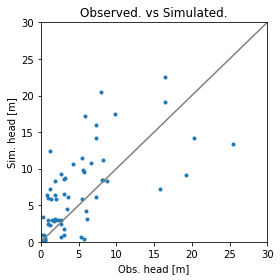

Error is - 8.460035990546954
Params are - [ 4.69093906 17.80577788 10.99536708  0.37660237  0.32656459  0.58061162]


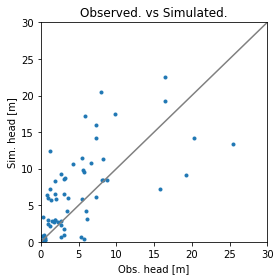

Error is - 8.459927965477243
Params are - [ 4.62614031 19.85395167 11.10056139  0.37889476  0.32645677  0.57771636]


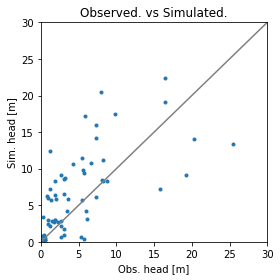

Error is - 8.46008387128295
Params are - [ 4.65319051 20.60727562 11.10250043  0.38070417  0.32754836  0.57759878]


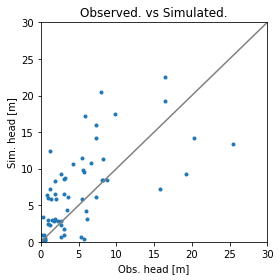

Error is - 8.459917570874518
Params are - [ 4.64198665 18.85047277 11.06050757  0.37746968  0.32615608  0.57883882]


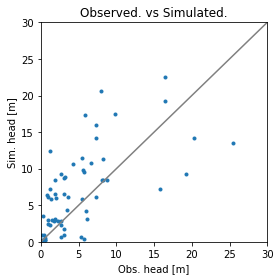

Error is - 8.460015002569216
Params are - [ 4.57366856 19.11009898 11.09050123  0.37712431  0.3263887   0.57799159]


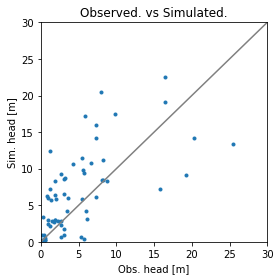

Error is - 8.45992060840659
Params are - [ 4.6675375  19.42814065 11.06688188  0.37879054  0.32660549  0.57863857]


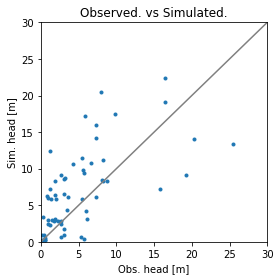

Error is - 8.460015599717329
Params are - [ 4.70568243 18.56566308 11.0069458   0.37815573  0.32746226  0.58025738]


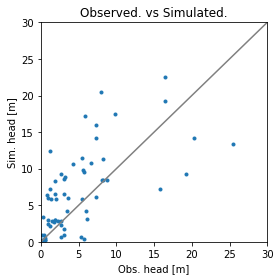

Error is - 8.459914331529795
Params are - [ 4.62041636 19.57839926 11.09446916  0.37836408  0.32625645  0.57789007]


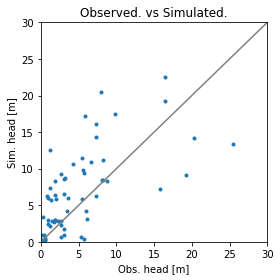

Error is - 8.460013109846084
Params are - [ 4.69474566 19.66150013 11.0903888   0.37898162  0.3251067   0.57801684]


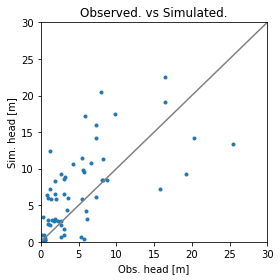

Error is - 8.459910503017039
Params are - [ 4.62916323 19.17265417 11.06292301  0.37809297  0.32706793  0.5787382 ]


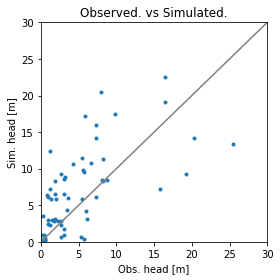

Error is - 8.459921908961798
Params are - [ 4.60809331 19.20094704 11.06522436  0.37807075  0.32742666  0.57873664]


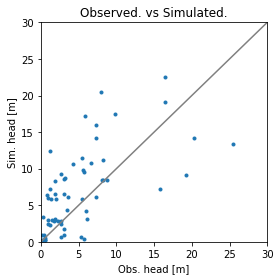

Error is - 8.459932775943072
Params are - [ 4.65369422 18.52518466 11.02781385  0.37745527  0.32711145  0.57973906]


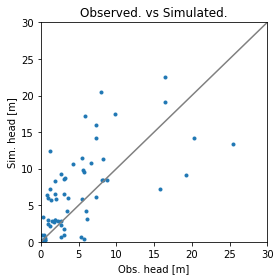

Error is - 8.459905938659732
Params are - [ 4.63302878 19.52175992 11.08237451  0.37853489  0.32662044  0.57822203]


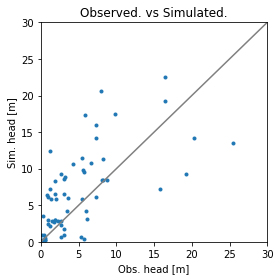

Error is - 8.459953367261294
Params are - [ 4.59443541 19.67732951 11.10900708  0.37817887  0.32618562  0.57749748]


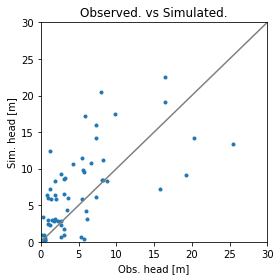

Error is - 8.459902648943627
Params are - [ 4.65283875 19.0994287  11.05359158  0.37824129  0.32694045  0.57901734]


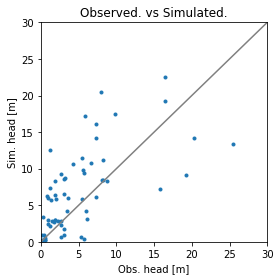

Error is - 8.459940524063539
Params are - [ 4.67356378 19.34933811 11.07502487  0.37842707  0.32578895  0.57837837]


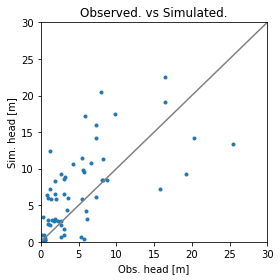

Error is - 8.459902973476407
Params are - [ 4.62446093 19.23804481 11.06767449  0.37815983  0.32701723  0.57864707]


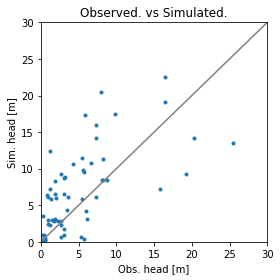

Error is - 8.459941928905117
Params are - [ 4.59976073 19.05877923 11.07363156  0.37749704  0.32674737  0.57847928]


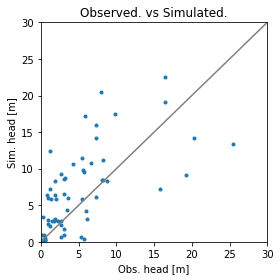

Error is - 8.459902854555674
Params are - [ 4.65059331 19.33580029 11.0685693   0.37846716  0.32664096  0.57859875]


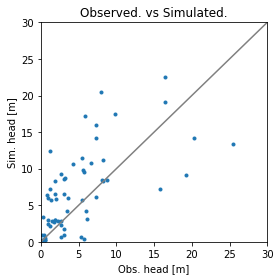

Error is - 8.459929777976026
Params are - [ 4.62818047 19.79822295 11.08269311  0.3791504   0.32735841  0.578199  ]


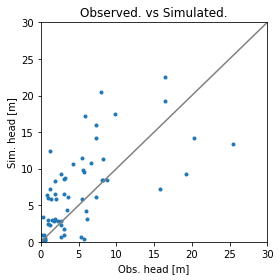

Error is - 8.459902809632771
Params are - [ 4.6385351  19.08741032 11.06605396  0.37788986  0.32645666  0.57867887]


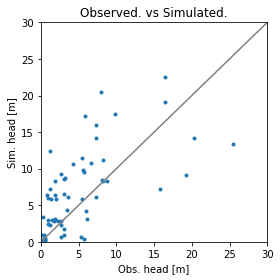

Error is - 8.45992285792332
Params are - [ 4.65579034 18.90663348 11.03925979  0.37809792  0.32732477  0.57941068]


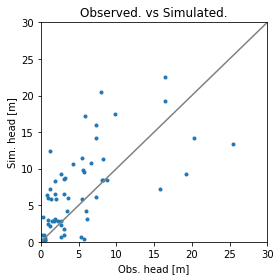

Error is - 8.459902537467448
Params are - [ 4.62925985 19.41045782 11.08066682  0.37829754  0.32652353  0.57827022]


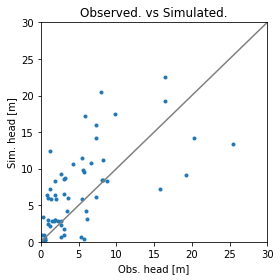

Error is - 8.45989821434228
Params are - [ 4.64707568 19.39164645 11.07672054  0.37843722  0.32633183  0.57840656]


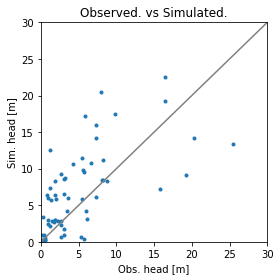

Error is - 8.459908777382543
Params are - [ 4.65603191 19.50114258 11.0836193   0.37860935  0.32596379  0.57824075]


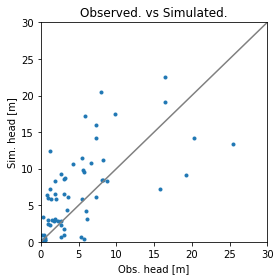

Error is - 8.459897467798468
Params are - [ 4.64789243 18.99916954 11.05538439  0.37796274  0.32668312  0.57898424]


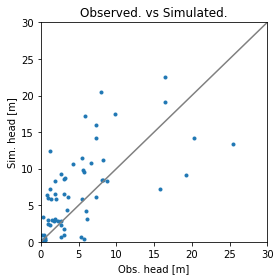

Error is - 8.459906869341758
Params are - [ 4.65532425 18.73787435 11.04188933  0.37767667  0.32671446  0.57936534]


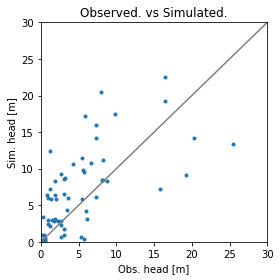

Error is - 8.45990932306251
Params are - [ 4.66427078 19.20325956 11.0659877   0.37827211  0.32617495  0.57867159]


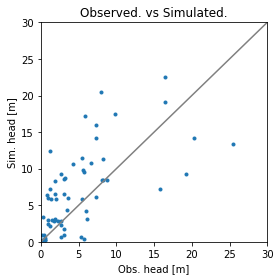

Error is - 8.459897828715107
Params are - [ 4.63441339 19.2293485  11.06725279  0.3781879   0.32680666  0.5786532 ]


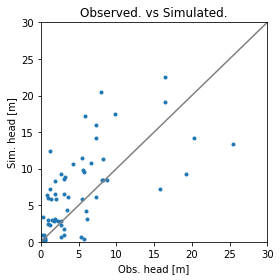

Error is - 8.459898551305109
Params are - [ 4.6327451  19.07002014 11.06465406  0.37787169  0.32660646  0.57873807]


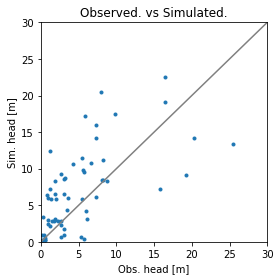

Error is - 8.459893511723235
Params are - [ 4.6428733  19.3126134  11.06670277  0.37844294  0.32684069  0.57867768]


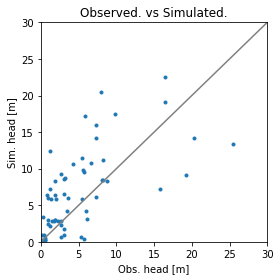

Error is - 8.459896258442663
Params are - [ 4.64504239 19.42521494 11.06702718  0.37871948  0.3270327   0.57867708]


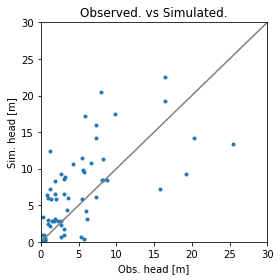

Error is - 8.459900855107955
Params are - [ 4.62524783 19.37165658 11.08353554  0.37815872  0.32632365  0.57822598]


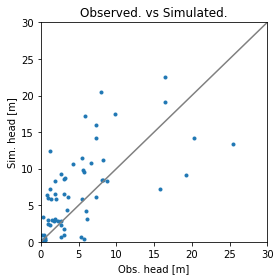

Error is - 8.459890625195563
Params are - [ 4.64748939 19.04769372 11.05741655  0.37805619  0.32667394  0.57895835]


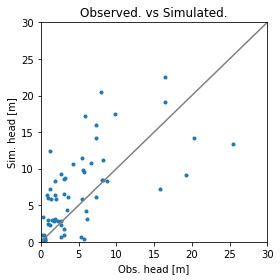

Error is - 8.459893103527044
Params are - [ 4.65660415 18.86631167 11.04579141  0.37793552  0.32674914  0.57930242]


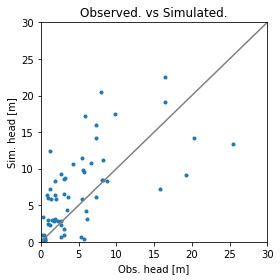

Error is - 8.459905099539412
Params are - [ 4.65891526 18.97850734 11.0458415   0.37816084  0.32699058  0.57924672]


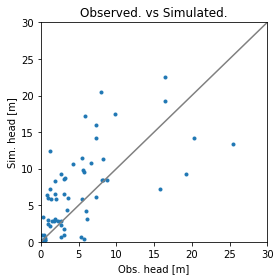

Error is - 8.459894440047004
Params are - [ 4.63366469 19.27336927 11.07411203  0.37815925  0.32649038  0.57848117]


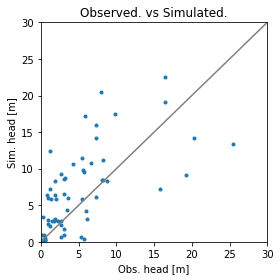

Error is - 8.459896313849804
Params are - [ 4.65172453 19.34792681 11.06787563  0.37854373  0.32666908  0.578649  ]


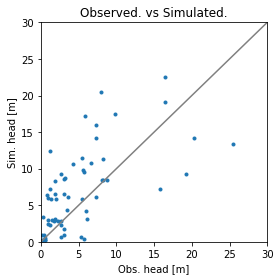

Error is - 8.459899613907146
Params are - [ 4.63894356 19.0117273  11.05286085  0.37801369  0.32705612  0.57906131]


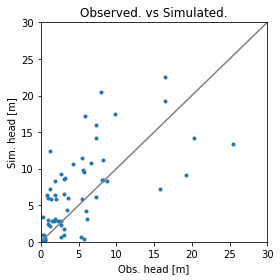

Error is - 8.45989389623454
Params are - [ 4.64504265 19.29666666 11.07075562  0.37833134  0.32651291  0.57857025]


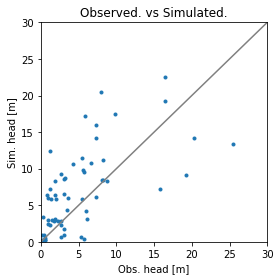

Error is - 8.459890428788466
Params are - [ 4.65514893 19.19646464 11.0634962   0.37831083  0.32648338  0.57878703]


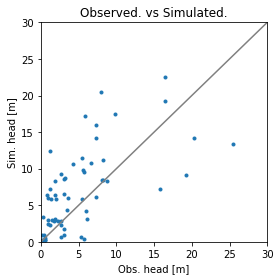

Error is - 8.459892836220678
Params are - [ 4.66551671 19.18002271 11.0616179   0.3783723   0.32632173  0.57885394]


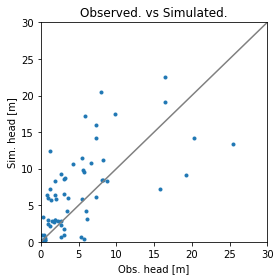

Error is - 8.459893478376117
Params are - [ 4.64408874 19.49240863 11.07806854  0.37865202  0.32654034  0.57839025]


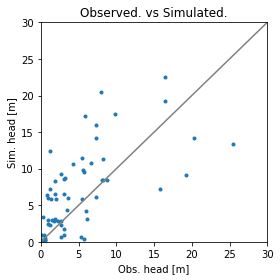

Error is - 8.459889137633413
Params are - [ 4.63771137 19.19181196 11.06897494  0.37810713  0.32651146  0.57863924]


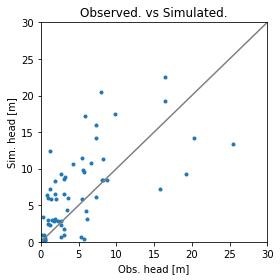

Error is - 8.459892854829809
Params are - [ 4.63070479 19.11375453 11.06952459  0.37788883  0.32643265  0.57863436]


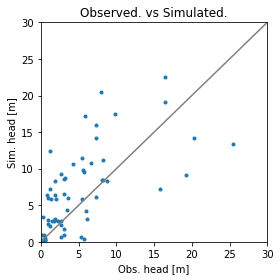

Error is - 8.459891531571849
Params are - [ 4.6571201  19.23918373 11.06102618  0.37847423  0.32669719  0.57885977]


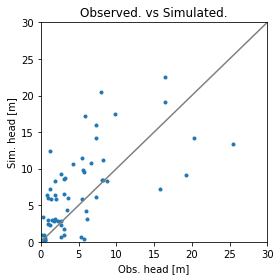

Error is - 8.459885104774411
Params are - [ 4.64976796 19.19672536 11.06113944  0.37834977  0.32673609  0.57886719]


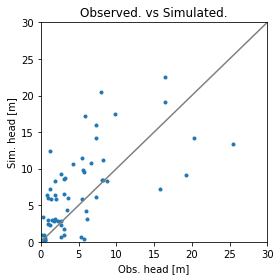

Error is - 8.459882392489886
Params are - [ 4.65213061 19.14675472 11.05633136  0.37835899  0.32684769  0.57901566]


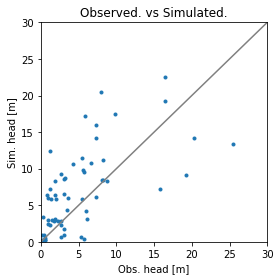

Error is - 8.459883735991767
Params are - [ 4.65502308 19.1254924  11.06173515  0.37821019  0.32641064  0.57887242]


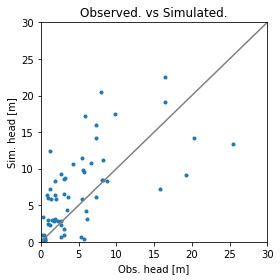

Error is - 8.459893600409275
Params are - [ 4.65745243 18.82339176 11.04492492  0.37785384  0.32666775  0.57932057]


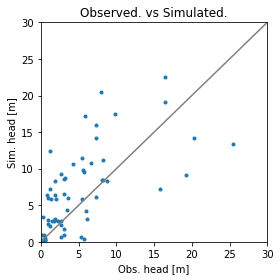

Error is - 8.45988795232526
Params are - [ 4.64742966 19.32515441 11.06978264  0.37845247  0.32657219  0.57862283]


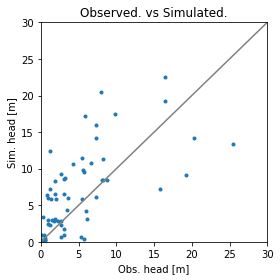

Error is - 8.45988573772434
Params are - [ 4.64119091 19.10527355 11.0648861   0.37802437  0.32646924  0.57877208]


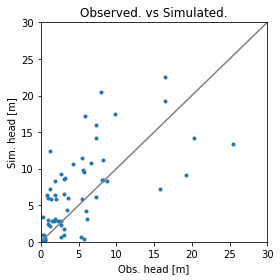

Error is - 8.459882297910076
Params are - [ 4.64872214 19.31595683 11.07098558  0.3784318   0.32642426  0.5786114 ]


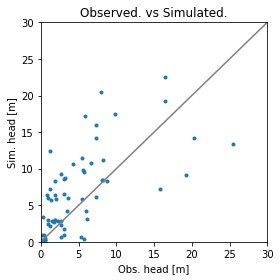

Error is - 8.459883354390191
Params are - [ 4.64933851 19.45008839 11.07777009  0.3786196   0.32629942  0.57843793]


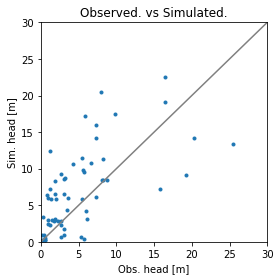

Error is - 8.45987853355445
Params are - [ 4.63892032 19.20701665 11.06740239  0.37821749  0.32659512  0.57872419]


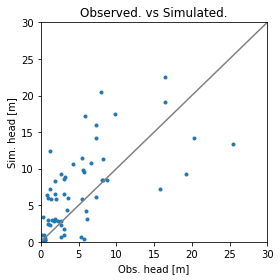

Error is - 8.4598762489331
Params are - [ 4.63080602 19.21229266 11.06935548  0.37817081  0.32665099  0.57869276]


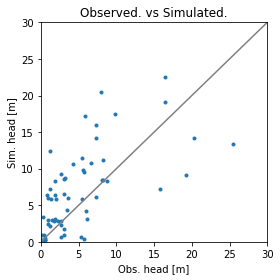

Error is - 8.459875584678656
Params are - [ 4.6540561  19.21849623 11.06205049  0.37844242  0.32661354  0.57888981]


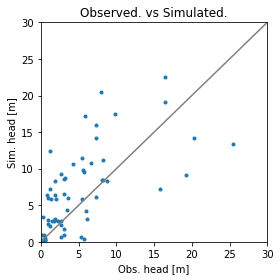

Error is - 8.459873587475961
Params are - [ 4.66222847 19.23183837 11.05858827  0.37861007  0.32666459  0.5790151 ]


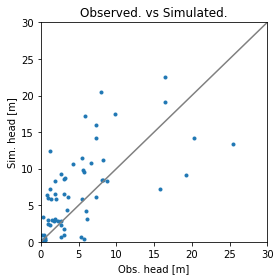

Error is - 8.459869658381889
Params are - [ 4.64927075 19.05404843 11.05751134  0.37814961  0.32658361  0.57903697]


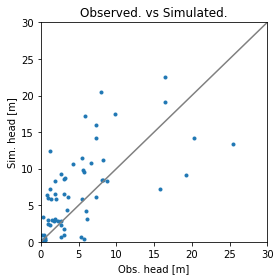

Error is - 8.459864414420613
Params are - [ 4.6501913  18.91849544 11.0513757   0.37799817  0.32658932  0.57924404]


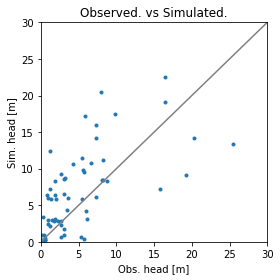

Error is - 8.45986797287089
Params are - [ 4.65850963 19.21166992 11.05790441  0.37856897  0.32672658  0.57904505]


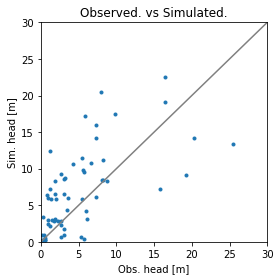

Error is - 8.45986105494408
Params are - [ 4.64583964 19.22017692 11.05977845  0.37850274  0.3268905   0.57900225]


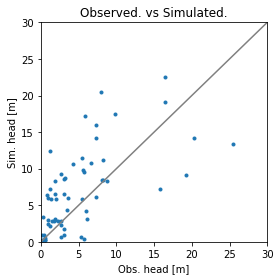

Error is - 8.459854270925849
Params are - [ 4.64124791 19.26751917 11.0588001   0.37864902  0.32713043  0.57906716]


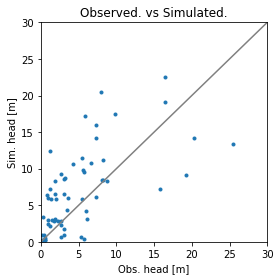

Error is - 8.459850338129309
Params are - [ 4.64510454 19.23916941 11.06600515  0.37845063  0.32654771  0.57887618]


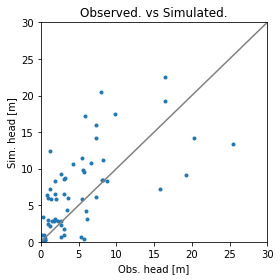

Error is - 8.459837136816404
Params are - [ 4.64159151 19.28537676 11.07084205  0.37849645  0.32639772  0.57880644]


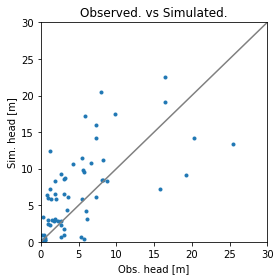

Error is - 8.459839455482365
Params are - [ 4.64613614 19.05977394 11.05130309  0.37839936  0.32696228  0.57934545]


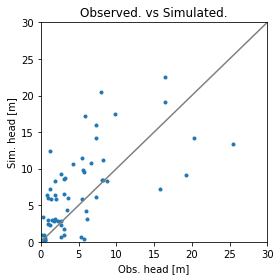

Error is - 8.459843085029624
Params are - [ 4.6691623  19.11259854 11.04691573  0.37873653  0.32683931  0.57948165]


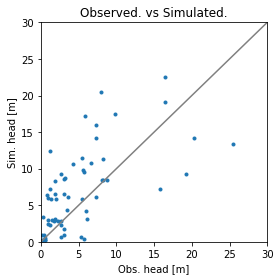

Error is - 8.459827352344627
Params are - [ 4.64005112 19.05330623 11.05379209  0.37833944  0.32688396  0.57931484]


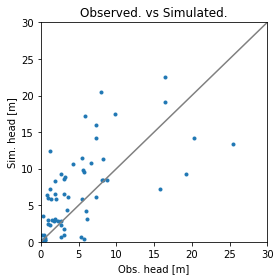

Error is - 8.459815545049294
Params are - [ 4.62896245 18.96404016 11.051394    0.37820412  0.32699365  0.57946471]


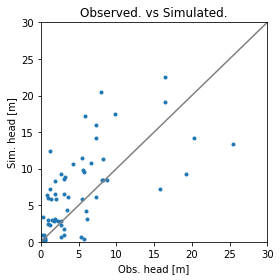

Error is - 8.459815080182725
Params are - [ 4.63392091 18.99093142 11.05230581  0.37825891  0.32691098  0.57942477]


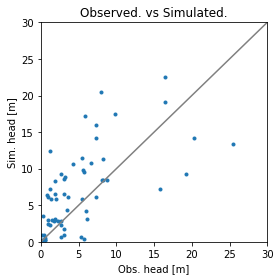

Error is - 8.459803853000803
Params are - [ 4.62162655 18.88056217 11.04950651  0.37810388  0.32700318  0.57961462]


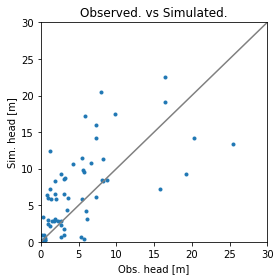

Error is - 8.45979186862258
Params are - [ 4.63271766 19.27146148 11.05821146  0.37886495  0.32718621  0.5793493 ]


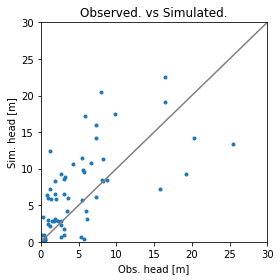

Error is - 8.459767620062241
Params are - [ 4.62398084 19.4479445  11.06162934  0.37929834  0.32748466  0.57940193]


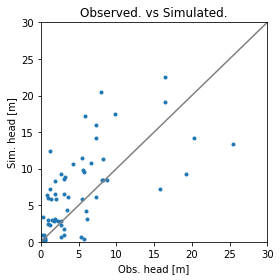

Error is - 8.45976764315632
Params are - [ 4.63590535 18.98257952 11.05173014  0.37843054  0.32676317  0.57963777]


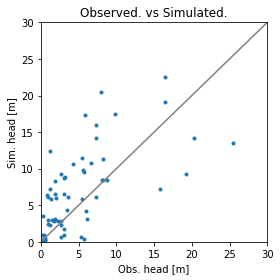

Error is - 8.45980388043198
Params are - [ 4.59690531 19.09416047 11.06521932  0.37824103  0.3270289   0.57927532]


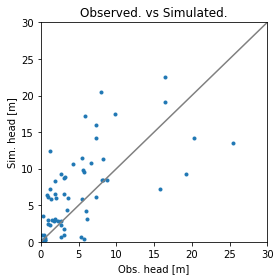

Error is - 8.459756855058913
Params are - [ 4.60352119 19.15844725 11.0654707   0.37852542  0.32692814  0.57938815]


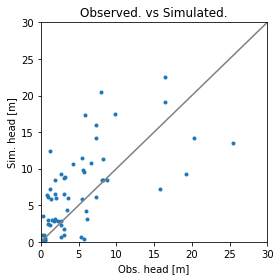

Error is - 8.459740781597057
Params are - [ 4.58221372 19.20778391 11.0725545   0.37858845  0.32691108  0.5794095 ]


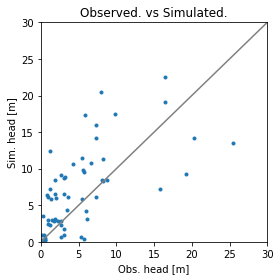

Error is - 8.45976033592568
Params are - [ 4.58827323 18.90698014 11.04650255  0.37845901  0.32766383  0.58012818]


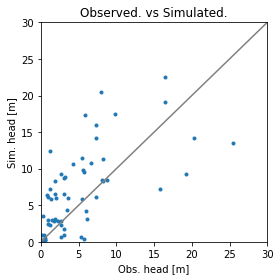

Error is - 8.459719575305106
Params are - [ 4.58733921 19.20929674 11.06432012  0.37883629  0.32729129  0.57969106]


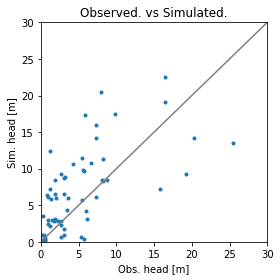

Error is - 8.459692577937084
Params are - [ 4.5665276  19.33192503 11.07078318  0.37915238  0.32744011  0.57980424]


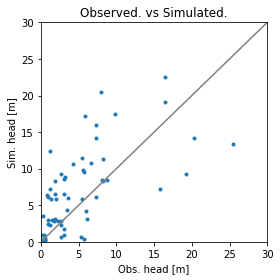

Error is - 8.45967829530566
Params are - [ 4.60927045 19.15843128 11.05234942  0.37910317  0.3273931   0.58005676]


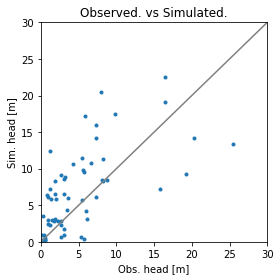

Error is - 8.459623302323328
Params are - [ 4.61545302 19.19056669 11.04591448  0.37953424  0.3275752   0.58044747]


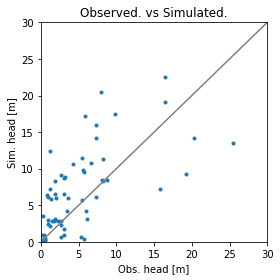

Error is - 8.459632421528744
Params are - [ 4.58249137 19.47536443 11.06686489  0.37971711  0.3276095   0.57999507]


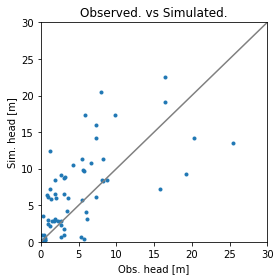

Error is - 8.459679113751246
Params are - [ 4.55040791 19.53760872 11.06968617  0.3798193   0.32813163  0.58009102]


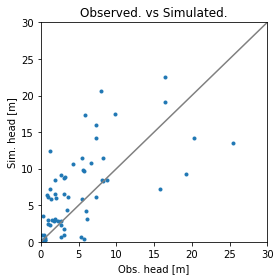

Error is - 8.459678972581905
Params are - [ 4.53780811 19.10213181 11.06247258  0.37912516  0.32762579  0.58055657]


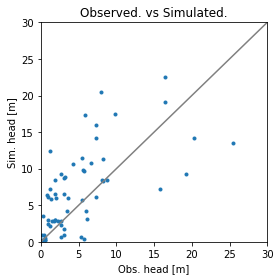

Error is - 8.45957848438718
Params are - [ 4.55669401 19.70814672 11.08292272  0.38018654  0.32743394  0.57997312]


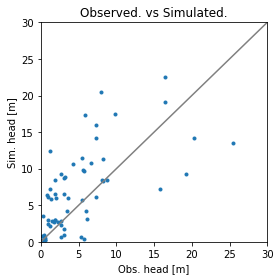

Error is - 8.45952192941853
Params are - [ 4.5409044  20.10873    11.1011328   0.3810503   0.327319    0.57989558]


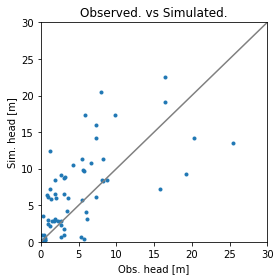

Error is - 8.459526476967747
Params are - [ 4.54898375 19.70765832 11.06639687  0.38087771  0.32832267  0.58085382]


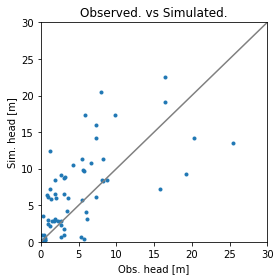

Error is - 8.459493394176812
Params are - [ 4.55882193 19.70876162 11.06670608  0.38088889  0.32808782  0.58080894]


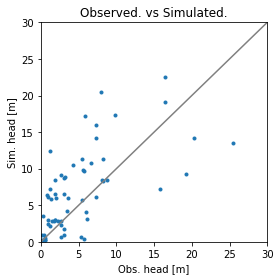

Error is - 8.459409560882062
Params are - [ 4.55496909 19.89717992 11.06466753  0.38175715  0.32841167  0.58131129]


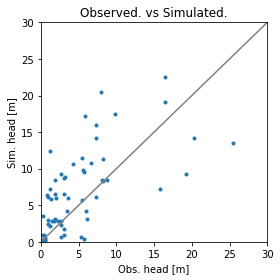

Error is - 8.459412751845996
Params are - [ 4.57646201 19.62293501 11.06613021  0.38086792  0.32748965  0.58092891]


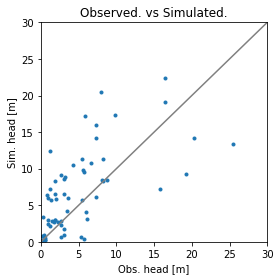

Error is - 8.459465081295347
Params are - [ 4.60194643 20.23201298 11.07456301  0.38214298  0.3279501   0.58058748]


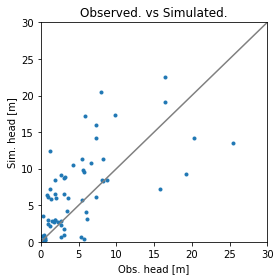

Error is - 8.459322148192392
Params are - [ 4.5637482  20.11099655 11.07273674  0.38235965  0.32807993  0.58134645]


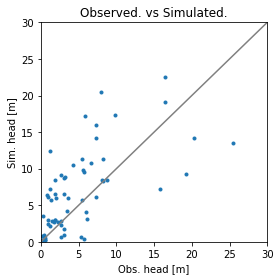

Error is - 8.459190435118892
Params are - [ 4.55437661 20.42881261 11.07567267  0.38368093  0.32831515  0.58202213]


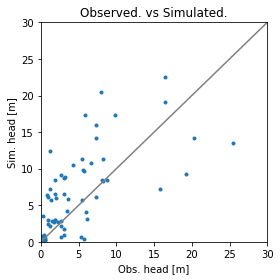

Error is - 8.459298744586432
Params are - [ 4.51042774 20.80854292 11.10360655  0.38392475  0.32836087  0.58141894]


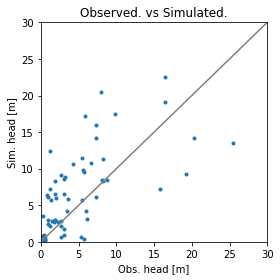

Error is - 8.459232343738957
Params are - [ 4.56404501 20.65841283 11.09552739  0.38359697  0.32762614  0.58120096]


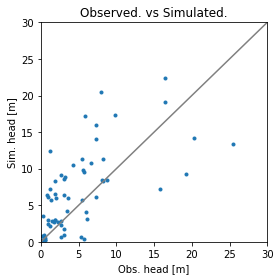

Error is - 8.45916987180149
Params are - [ 4.5798379  20.44056875 11.05892298  0.38427327  0.32873219  0.58259432]


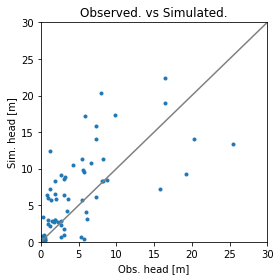

Error is - 8.459095164093243
Params are - [ 4.59930464 20.60648812 11.03781807  0.38588475  0.32943879  0.58394369]


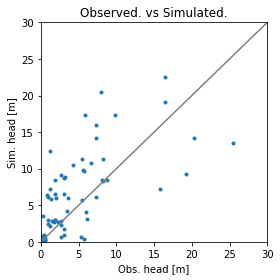

Error is - 8.459068619638527
Params are - [ 4.51791527 20.44211082 11.07324446  0.38442784  0.32859732  0.58302116]


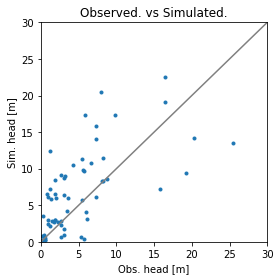

Error is - 8.458968423458836
Params are - [ 4.47589969 20.54715974 11.07258519  0.38557027  0.32892094  0.58423799]


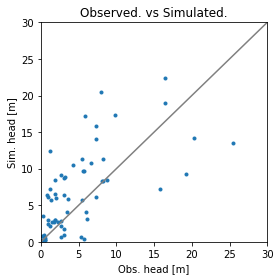

Error is - 8.4590269192354
Params are - [ 4.50987892 21.35926371 11.08382892  0.38727036  0.32953487  0.58378275]


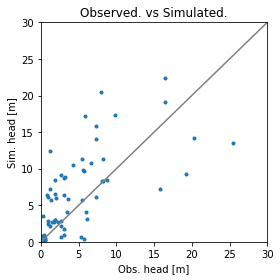

Error is - 8.45884440093868
Params are - [ 4.51634178 21.57238006 11.09167874  0.38821887  0.32898725  0.5842242 ]


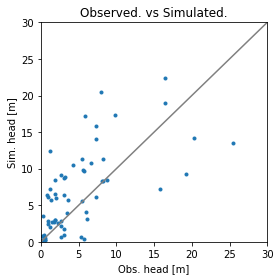

Error is - 8.458676342271543
Params are - [ 4.49702813 22.40998012 11.10518434  0.39144972  0.32927504  0.58568065]


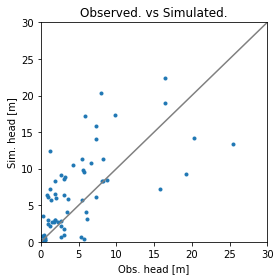

Error is - 8.458699673909193
Params are - [ 4.55641659 21.19482945 11.05326564  0.38855958  0.32934277  0.58553712]


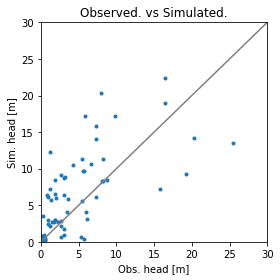

Error is - 8.458678414672315
Params are - [ 4.50025652 21.52376509 11.04725755  0.39054157  0.33064971  0.58720049]


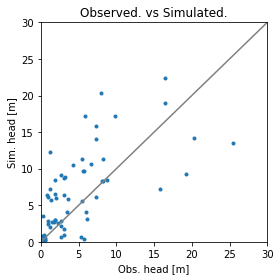

Error is - 8.458561703571835
Params are - [ 4.49188489 22.11834947 11.05764057  0.39274449  0.3307389   0.58810543]


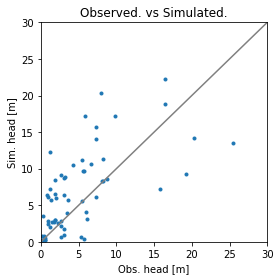

Error is - 8.458471176136829
Params are - [ 4.46063903 22.9631179  11.04862452  0.39727627  0.33195077  0.59114708]


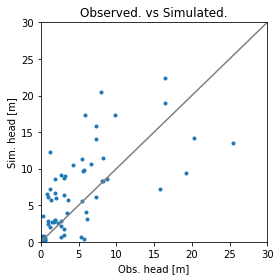

Error is - 8.458598611841687
Params are - [ 4.40073498 22.72621722 11.09909732  0.39433784  0.33045258  0.58858501]


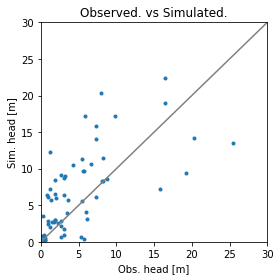

Error is - 8.45820487786684
Params are - [ 4.45377939 22.4290928  11.05817593  0.39530806  0.3306624   0.5903467 ]


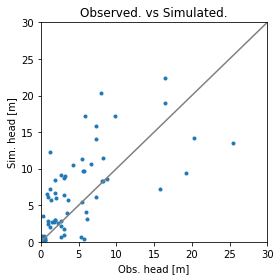

Error is - 8.457888298882946
Params are - [ 4.42572962 22.96400735 11.04534944  0.39932692  0.33122617  0.59362867]


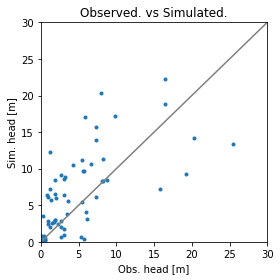

Error is - 8.458394275199831
Params are - [ 4.47103527 24.04681264 11.06034108  0.40159369  0.33204475  0.59302169]


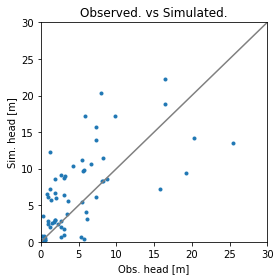

Error is - 8.458501850345227
Params are - [ 4.36205792 24.34980399 11.08201911  0.40294909  0.33252357  0.59421741]


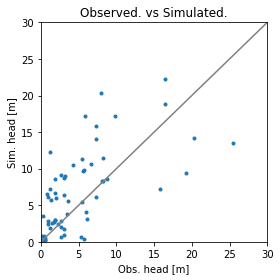

Error is - 8.458270046740545
Params are - [ 4.3721518  24.96288132 11.09961438  0.40510294  0.33184125  0.59489301]


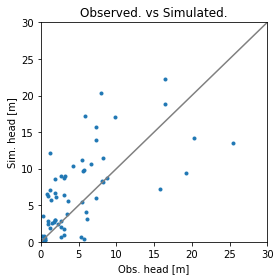

Error is - 8.458403014332452
Params are - [ 4.33375475 24.92763335 11.03983094  0.40874586  0.33407132  0.59948364]


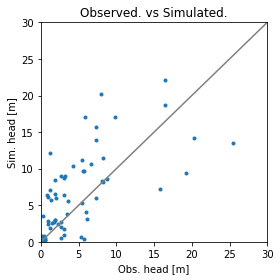

Error is - 8.458308587732978
Params are - [ 4.40772115 25.34520163 11.02616251  0.41066042  0.33410003  0.60021216]


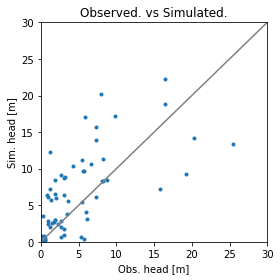

Error is - 8.457990055300867
Params are - [ 4.46161928 24.05341408 11.02462185  0.40461961  0.33255453  0.59657801]


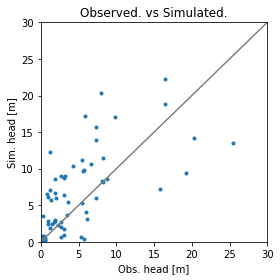

Error is - 8.457965589578265
Params are - [ 4.36336493 25.80353222 11.05001555  0.41274021  0.33332857  0.60145864]


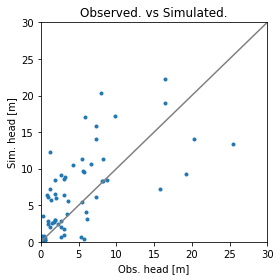

Error is - 8.458016447307083
Params are - [ 4.50011927 24.13098307 11.06220399  0.40260207  0.33096045  0.59378042]


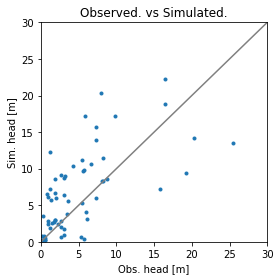

Error is - 8.457658590816202
Params are - [ 4.37253341 25.03986058 11.04231482  0.41009036  0.33262558  0.60049528]


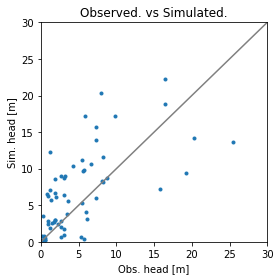

Error is - 8.45743887219613
Params are - [ 4.32328248 25.53638455 11.03330169  0.41433869  0.332916    0.60423208]


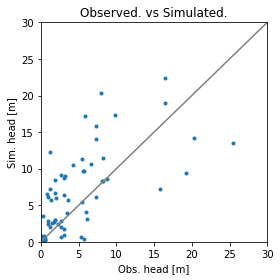

Error is - 8.457599558665134
Params are - [ 4.40770131 23.80519923 11.07887312  0.40224973  0.33017563  0.59464479]


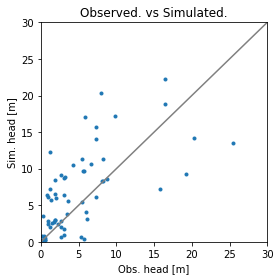

Error is - 8.457192696209495
Params are - [ 4.4551205  23.80162551 10.9985075   0.40685613  0.3318792   0.59988119]


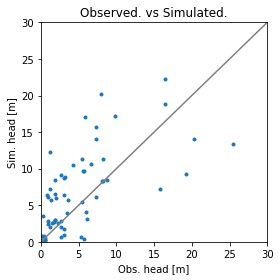

Error is - 8.456753884677196
Params are - [ 4.49660485 23.22099761 10.94795405  0.40773273  0.33189818  0.60237527]


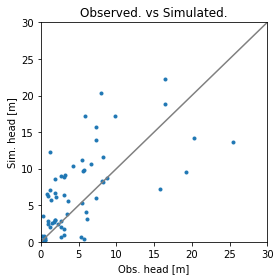

Error is - 8.457310049545704
Params are - [ 4.32598156 24.33019528 10.99783457  0.41106723  0.33307258  0.60385873]


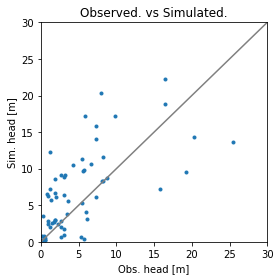

Error is - 8.456995031745619
Params are - [ 4.31926897 24.50002467 11.02648763  0.41119889  0.33165118  0.60348805]


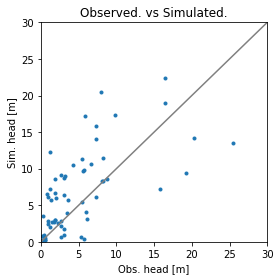

Error is - 8.456773250647132
Params are - [ 4.40282467 22.31540402 10.99325129  0.40256452  0.330318    0.5992839 ]


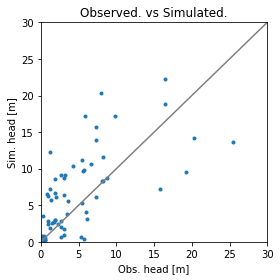

Error is - 8.456316258291029
Params are - [ 4.33282499 24.93872777 10.98055135  0.41705701  0.33211769  0.60899894]


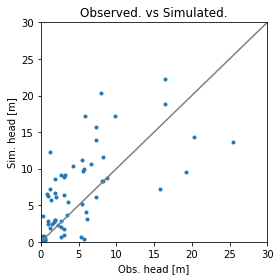

Error is - 8.455784791866245
Params are - [ 4.28637268 25.92608798 10.94815231  0.42592206  0.33256344  0.61668407]


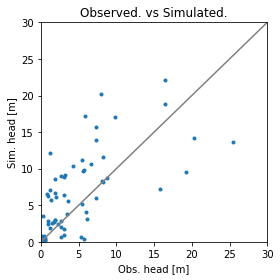

Error is - 8.456121728007442
Params are - [ 4.31041042 24.80449881 10.90345406  0.42202498  0.33396417  0.61532925]


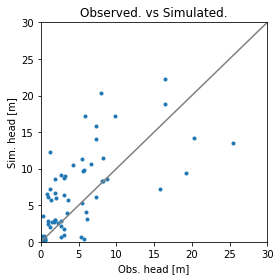

Error is - 8.455588051355043
Params are - [ 4.39053857 22.82935157 10.90574294  0.4124981   0.33157318  0.60944101]


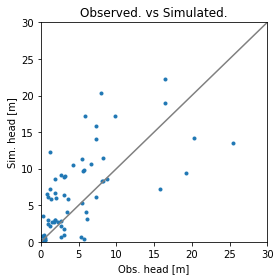

Error is - 8.454869941740672
Params are - [ 4.42416661 21.47583508 10.84196357  0.41157781  0.33090177  0.61204548]


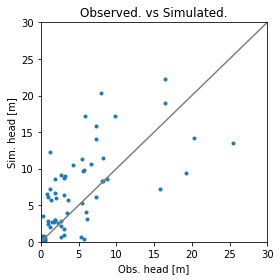

Error is - 8.454840895143587
Params are - [ 4.42056785 23.08408744 10.88925306  0.41593977  0.33069301  0.61254327]


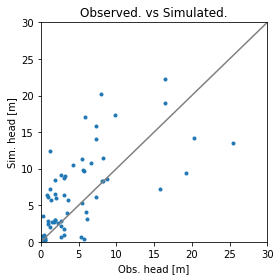

Error is - 8.45378781023561
Params are - [ 4.46786099 22.46103352 10.83496231  0.41837604  0.32950322  0.61688555]


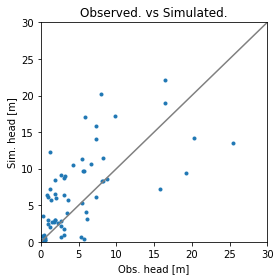

Error is - 8.454208491268961
Params are - [ 4.4768111  22.23459433 10.79675823  0.41820049  0.33139842  0.61737978]


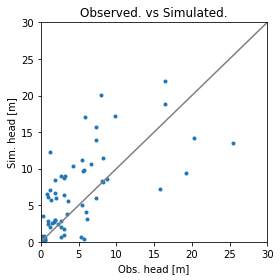

Error is - 8.45384371499671
Params are - [ 4.41791755 24.39227843 10.76449689  0.43204685  0.33309173  0.6276159 ]


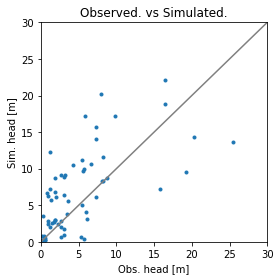

Error is - 8.452973065133405
Params are - [ 4.29790827 23.87711177 10.74864173  0.43498335  0.33190941  0.63293807]


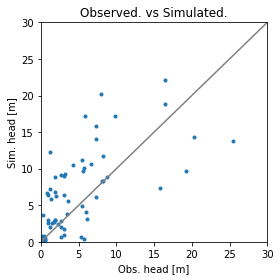

Error is - 8.451975640251932
Params are - [ 4.19855998 24.20516884 10.64898557  0.44860866  0.33191502  0.64821947]


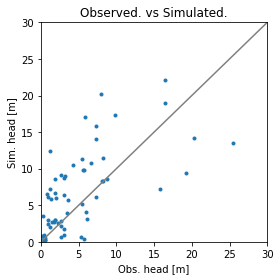

Error is - 8.451743934592306
Params are - [ 4.44681921 22.09383391 10.7083189   0.42955232  0.32916037  0.6309475 ]


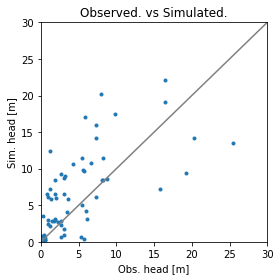

Error is - 8.450155158715699
Params are - [ 4.51502361 20.73850146 10.61075131  0.43331599  0.32675846  0.63875663]


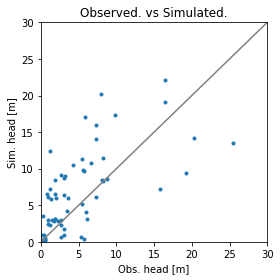

Error is - 8.45084428362738
Params are - [ 4.54707393 19.24304924 10.55115365  0.42811988  0.3286261   0.63695019]


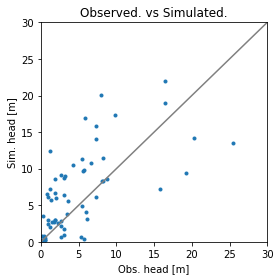

Error is - 8.449589609104489
Params are - [ 4.45024911 22.9490402  10.56040575  0.44797816  0.32952921  0.64989036]


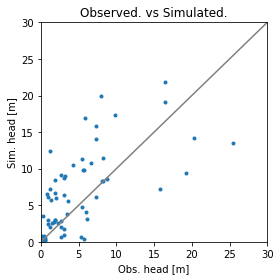

Error is - 8.447501935217229
Params are - [ 4.46329036 23.68564275 10.41962684  0.46617833  0.32884293  0.66881281]


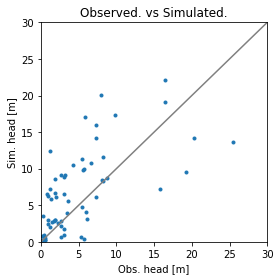

Error is - 8.44798279846177
Params are - [ 4.3930977  22.67396375 10.47990062  0.4573481   0.32818074  0.6617004 ]


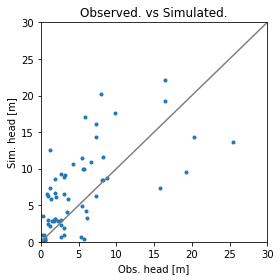

Error is - 8.447275678983665
Params are - [ 4.44371798 19.9435081  10.41729655  0.45193549  0.32485043  0.66282578]


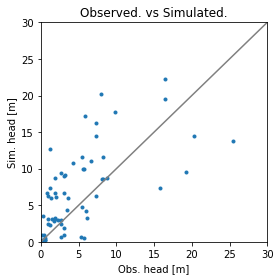

Error is - 8.44620626168558
Params are - [ 4.45661819 17.71912293 10.24369638  0.46187981  0.32072978  0.68043071]


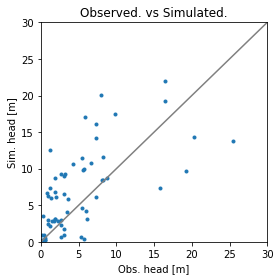

Error is - 8.444163199182773
Params are - [ 4.39002693 20.29411615 10.14974249  0.48010755  0.32551446  0.69473786]


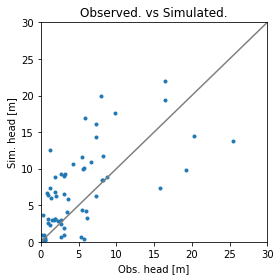

Error is - 8.441208932618142
Params are - [ 4.3511099  19.21065746  9.80713258  0.51097331  0.32352007  0.73366401]


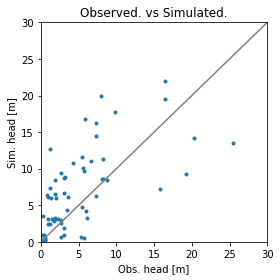

Error is - 8.444742639285284
Params are - [ 4.71017792 16.88514369 10.05510156  0.47066315  0.32030434  0.69188545]


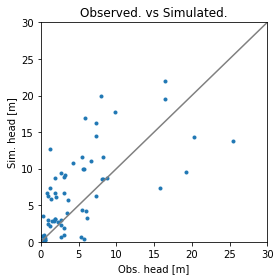

Error is - 8.441564683318559
Params are - [ 4.41603196 21.06129478  9.98758279  0.50533302  0.32081934  0.72146648]


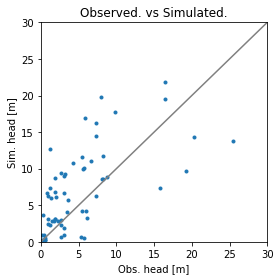

Error is - 8.43963586645871
Params are - [ 4.41508507 19.67344033  9.72026228  0.52414258  0.32070727  0.74722999]


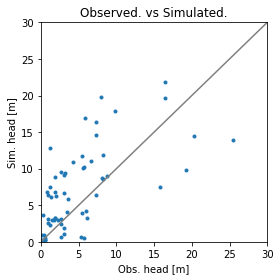

Error is - 8.437143114986826
Params are - [ 4.3651158  19.14090976  9.27501777  0.56955587  0.31768167  0.80146668]


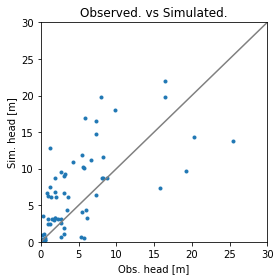

Error is - 8.439559030586132
Params are - [ 4.52768368 16.56029337  9.44948535  0.53751307  0.31578531  0.77087498]


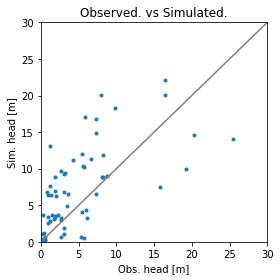

Error is - 8.4454692259749
Params are - [ 4.47895546 13.17349791  9.18637863  0.55246108  0.31077057  0.7977833 ]


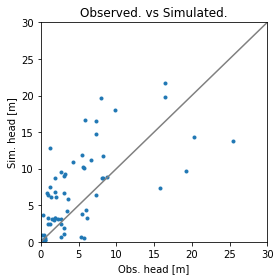

Error is - 8.43591171370608
Params are - [ 4.49307338 17.62480939  9.00986984  0.58695336  0.31556399  0.82528292]


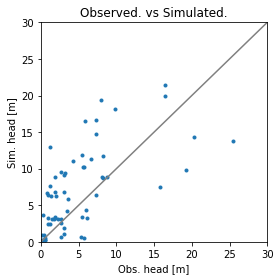

Error is - 8.43359417060776
Params are - [ 4.51130098 17.57765263  8.39295657  0.64949014  0.3129811   0.89770902]


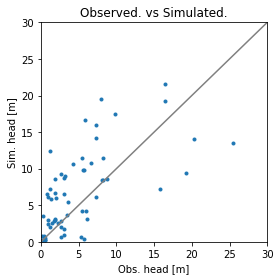

Error is - 8.440636372555561
Params are - [ 4.48151796 23.63848599  9.80271357  0.52871511  0.32626004  0.74123891]


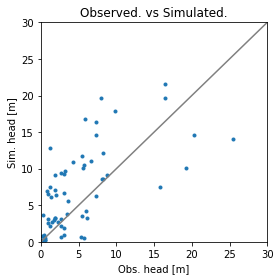

Error is - 8.435945800618025
Params are - [ 4.17407551 22.1779543   8.84986131  0.62986369  0.31871151  0.86358791]


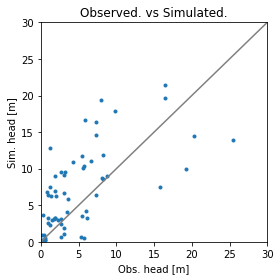

Error is - 8.433501136895424
Params are - [ 4.38756931 18.37402306  8.5381396   0.63670405  0.31749389  0.8813807 ]


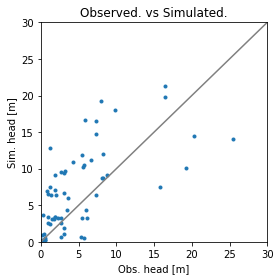

Error is - 8.432682686472784
Params are - [ 4.37333799 17.0303872   7.81341801  0.70238956  0.31583116  0.96133781]


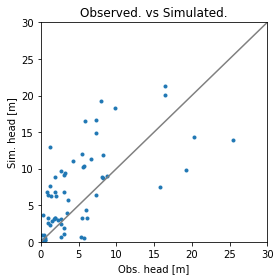

Error is - 8.432054626764366
Params are - [ 4.45990073 19.49790362  8.05401828  0.69486916  0.31223019  0.94507442]


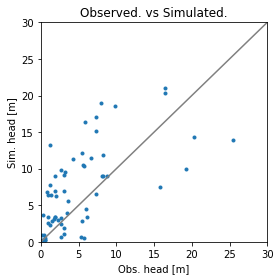

Error is - 8.432572969382159
Params are - [ 4.51429615 19.64152669  7.17746113  0.78681709  0.30658525  1.05077963]


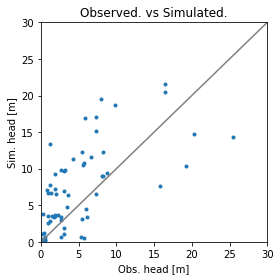

Error is - 8.445022568194414
Params are - [ 4.32228694 13.68988097  7.47553886  0.73251205  0.30481361  1.0054447 ]


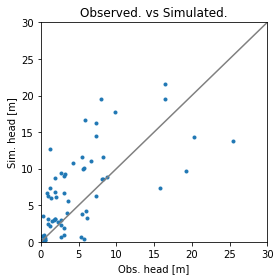

Error is - 8.43553878250088
Params are - [ 4.4417102  21.15133473  9.22091989  0.57966435  0.32089843  0.80729036]


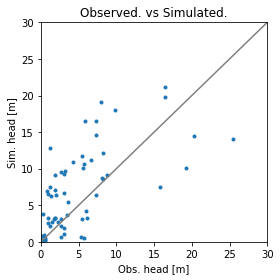

Error is - 8.431454923112788
Params are - [ 4.24746339 22.2984207   7.75257859  0.73776452  0.31699271  0.98794709]


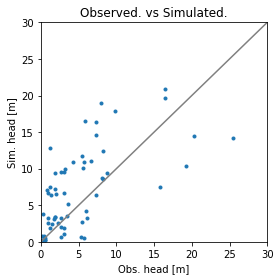

Error is - 8.43250077088439
Params are - [ 4.10735325 25.16748437  6.90412522  0.83789025  0.31759642  1.09648314]


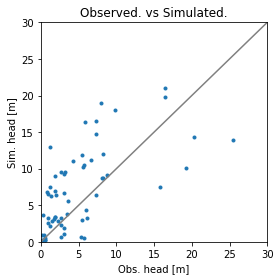

Error is - 8.430027508353104
Params are - [ 4.3708138  20.77030797  7.41956646  0.76179126  0.3148667   1.01951552]


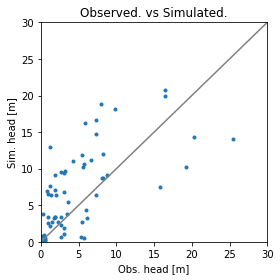

Error is - 8.429131401485787
Params are - [ 4.3736628  21.58500707  6.4918408   0.85790896  0.31345921  1.12853995]


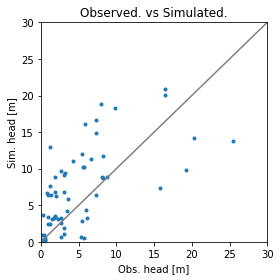

Error is - 8.429965291489717
Params are - [ 4.6283832  17.53561435  7.05871607  0.77749854  0.31208609  1.04571164]


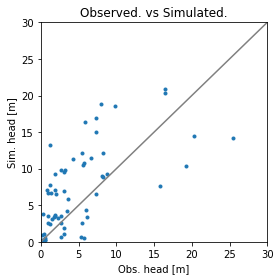

Error is - 8.433918071461804
Params are - [ 4.42297283 17.35699379  5.96692288  0.89364261  0.30696172  1.18148295]


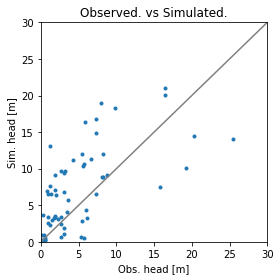

Error is - 8.431216180161263
Params are - [ 4.42765717 18.30557902  6.78042213  0.81514805  0.3104459   1.0879348 ]


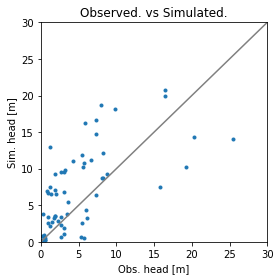

Error is - 8.429600798733029
Params are - [ 4.32550078 21.17331803  6.25737472  0.87903613  0.31403399  1.15447288]


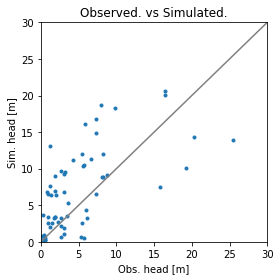

Error is - 8.429341772403662
Params are - [ 4.44751803 23.1015604   6.31823219  0.88501889  0.31058487  1.15522245]


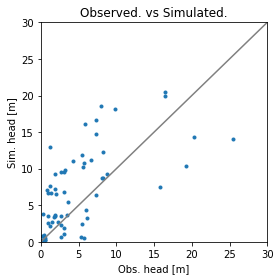

Error is - 8.429273306574096
Params are - [ 4.35682773 21.83526291  5.49903656  0.95592253  0.3136374   1.24153518]


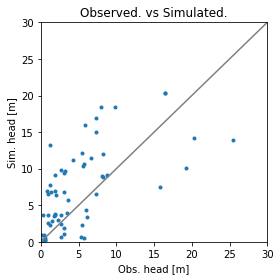

Error is - 8.430479527090736
Params are - [ 4.60571984 18.88035989  5.04929557  0.98574652  0.30775644  1.28319188]


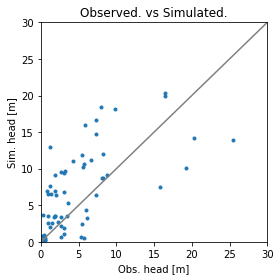

Error is - 8.427940491593873
Params are - [ 4.48488029 23.06479519  5.44440984  0.96522914  0.31340677  1.24828985]


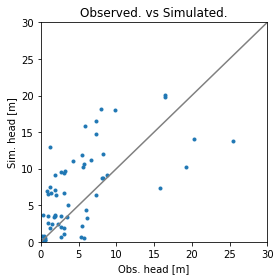

Error is - 8.428116637250127
Params are - [ 4.51349185 25.44440327  4.77640369  1.04026969  0.3148872   1.32846738]


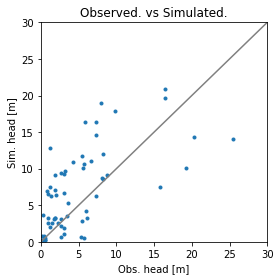

Error is - 8.430193578017894
Params are - [ 4.26653777 23.88482609  7.30724116  0.78779155  0.31797967  1.04139877]


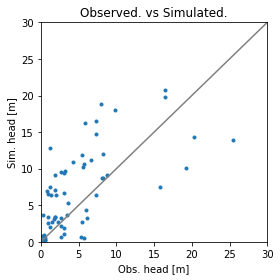

Error is - 8.428968974620028
Params are - [ 4.35133328 22.63370954  6.74275476  0.83728029  0.31542386  1.10184705]


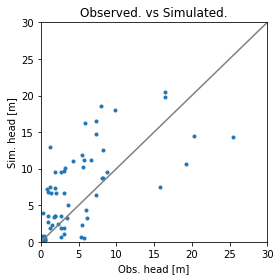

Error is - 8.432761678861121
Params are - [ 4.15152444 26.9289367   5.19250022  1.01596677  0.3147626   1.29759081]


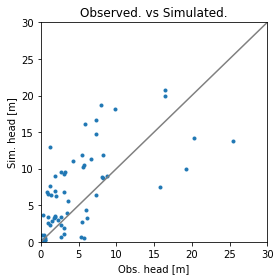

Error is - 8.428673220458007
Params are - [ 4.50916851 19.88394493  6.59216211  0.8371156   0.31275522  1.10868143]


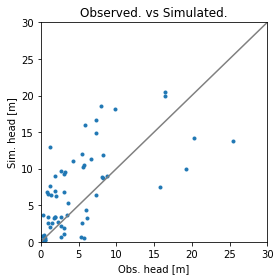

Error is - 8.428182748891393
Params are - [ 4.51562943 22.86144199  6.10543736  0.90045568  0.31238845  1.17356576]


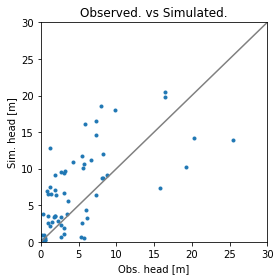

Error is - 8.428089589539837
Params are - [ 4.41631598 20.85316014  5.97364829  0.89961851  0.31643877  1.17893062]


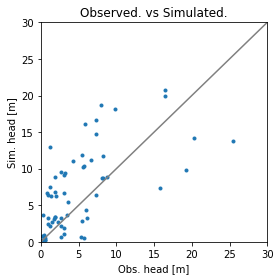

Error is - 8.428436668443373
Params are - [ 4.5268357  21.79209005  6.95104783  0.80994686  0.31432002  1.07174971]


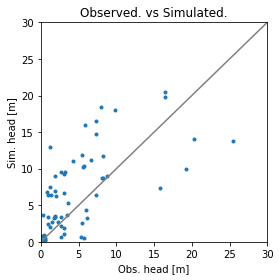

Error is - 8.427512029920472
Params are - [ 4.56105826 22.11137354  6.11131259  0.89197307  0.31478516  1.16581486]


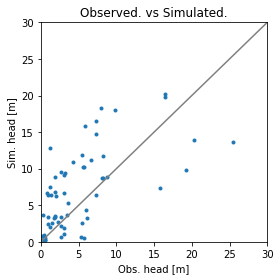

Error is - 8.427497157844417
Params are - [ 4.654756   22.37455678  5.92104849  0.90900513  0.31544813  1.18445232]


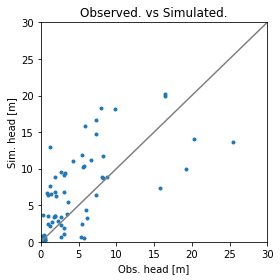

Error is - 8.427671537558416
Params are - [ 4.68452868 20.97628682  5.58649654  0.93651001  0.31282859  1.22004285]


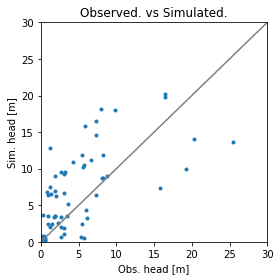

Error is - 8.427484489647696
Params are - [ 4.58514685 24.09016539  5.40186734  0.96980618  0.31552169  1.25032894]


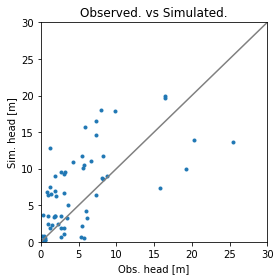

Error is - 8.428157115549283
Params are - [ 4.62313603 26.19327562  4.80671995  1.03615146  0.31690492  1.32115269]


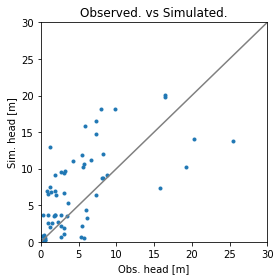

Error is - 8.427793512198548
Params are - [ 4.5869167  22.94804539  4.52658812  1.05026135  0.31435744  1.34678707]


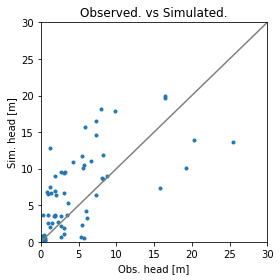

Error is - 8.427306166174294
Params are - [ 4.6218854  21.90756125  4.84591551  1.00968776  0.31694534  1.30271146]


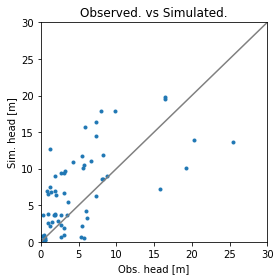

Error is - 8.428048357296692
Params are - [ 4.67501339 21.43062088  4.21615458  1.0643038   0.31922379  1.36728431]


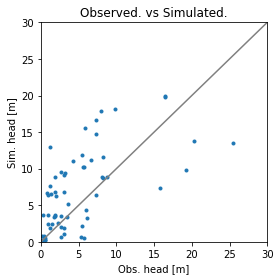

Error is - 8.428558046346337
Params are - [ 4.789722   24.26731013  4.60179366  1.04721468  0.31306389  1.33860687]


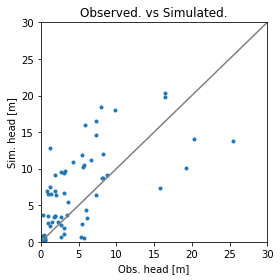

Error is - 8.427415486571194
Params are - [ 4.50966748 21.70669764  5.63068463  0.93651755  0.31559505  1.21884968]


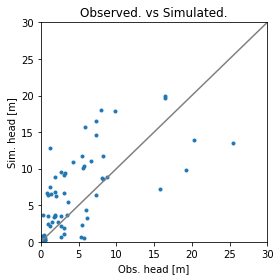

Error is - 8.427435806813792
Params are - [ 4.72942009 21.6029759   5.19312371  0.97203352  0.31682532  1.25943425]


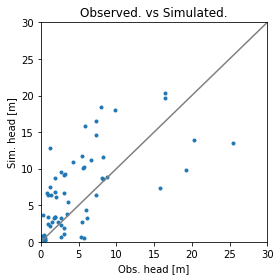

Error is - 8.427671470915818
Params are - [ 4.6748848  21.2713692   6.33312394  0.86092536  0.31669727  1.13181943]


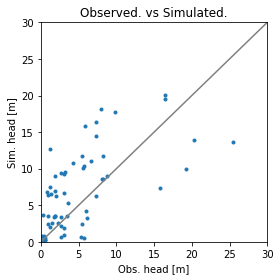

Error is - 8.427445159386446
Params are - [ 4.57405819 23.34148857  5.52209133  0.94948182  0.31951567  1.22915584]


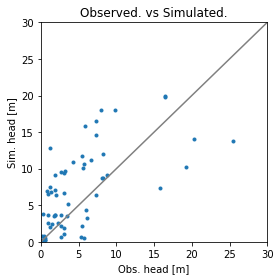

Error is - 8.42781084812462
Params are - [ 4.55009321 23.73644597  4.50511972  1.05458529  0.31658647  1.34982473]


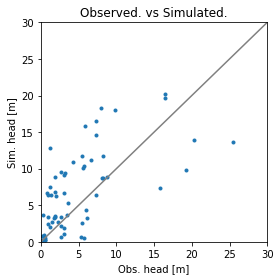

Error is - 8.427304359752489
Params are - [ 4.6436869  21.8876384   5.87612289  0.90934034  0.31666957  1.18632075]


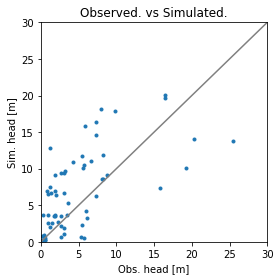

Error is - 8.427384284662498
Params are - [ 4.56653231 22.47095227  4.90221998  1.00661726  0.31824275  1.29781466]


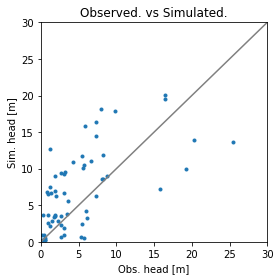

Error is - 8.427399015138016
Params are - [ 4.6299366  20.21560595  5.25485201  0.95808658  0.31907621  1.24776661]


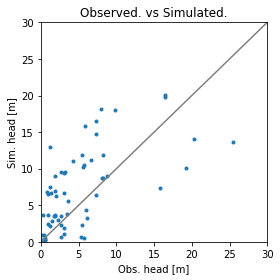

Error is - 8.427508202992673
Params are - [ 4.6596514  19.9223219   5.04554824  0.98127919  0.31493574  1.2751433 ]


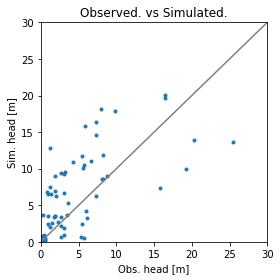

Error is - 8.427222162535143
Params are - [ 4.59545649 22.4866969   5.40295556  0.95743116  0.31837069  1.24065271]


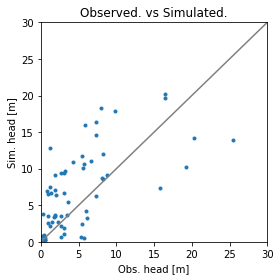

Error is - 8.42759658523713
Params are - [ 4.45963498 21.95540824  5.44445982  0.95386003  0.31814122  1.23860437]


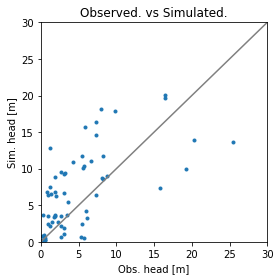

Error is - 8.427207459689015
Params are - [ 4.66197381 21.69108398  5.25595773  0.96749015  0.31715429  1.25422678]


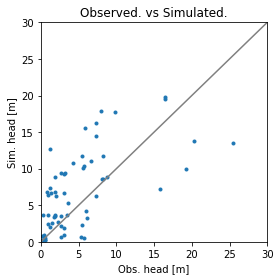

Error is - 8.427840437307532
Params are - [ 4.73015635 21.84648194  4.88198993  0.9997002   0.31989124  1.29098131]


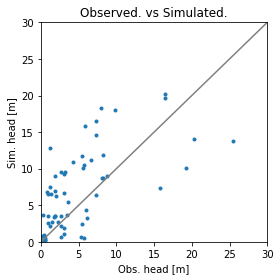

Error is - 8.427172229809514
Params are - [ 4.5647897  21.74164372  5.44351095  0.95231321  0.31666909  1.23688259]


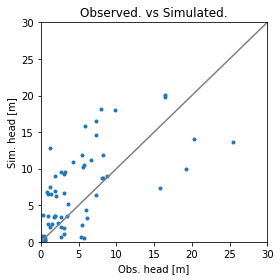

Error is - 8.427419726002453
Params are - [ 4.5881716  23.84625289  5.32070886  0.97620672  0.3156077   1.25843637]


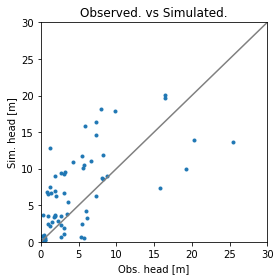

Error is - 8.427206604139002
Params are - [ 4.61949535 21.12326768  5.27131622  0.96261661  0.31820908  1.25043405]


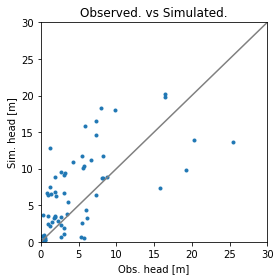

Error is - 8.427304266460897
Params are - [ 4.66923024 21.14167838  5.79637298  0.91300915  0.31642994  1.19259479]


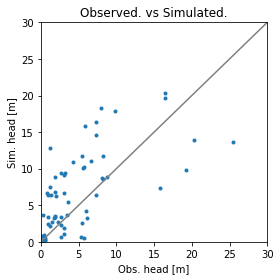

Error is - 8.427396512699938
Params are - [ 4.62965876 21.4497751   6.1694966   0.87771245  0.31755554  1.15099243]


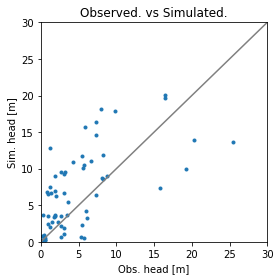

Error is - 8.42717405419569
Params are - [ 4.62382874 21.79311471  5.17681078  0.97669393  0.31709789  1.2647817 ]


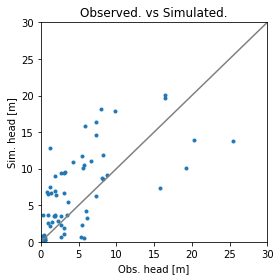

Error is - 8.427346708955012
Params are - [ 4.60123788 21.43819006  4.90618519  1.00051106  0.3179741   1.29353678]


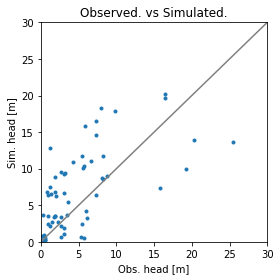

Error is - 8.427181617012954
Params are - [ 4.63307464 21.77527631  5.63363846  0.93213302  0.3169957   1.21312476]


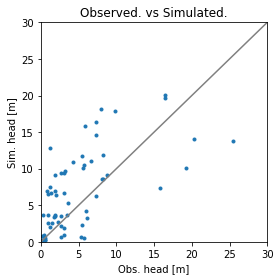

Error is - 8.427381634864725
Params are - [ 4.56364267 22.39534939  4.93169026  1.00321688  0.31840231  1.29410608]


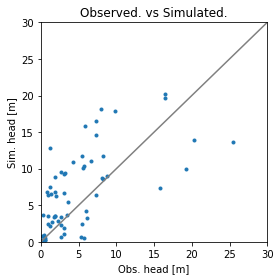

Error is - 8.427177575458535
Params are - [ 4.64283335 21.45509613  5.5802023   0.93556108  0.31692303  1.21797261]


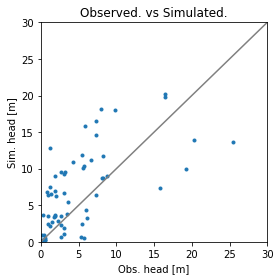

Error is - 8.427215480078617
Params are - [ 4.65320871 20.70646395  5.38418993  0.95150484  0.31597901  1.23848813]


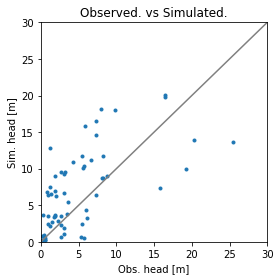

Error is - 8.427158056589459
Params are - [ 4.63877065 21.15152218  5.38888133  0.95298642  0.31657693  1.23902927]


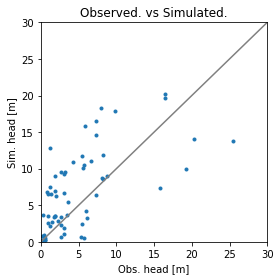

Error is - 8.427152153891504
Params are - [ 4.57895701 21.32222293  5.57549562  0.93661128  0.31700295  1.21984821]


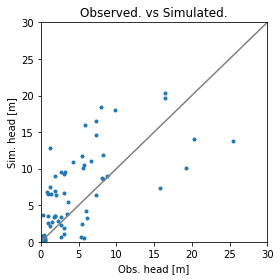

Error is - 8.427260499798265
Params are - [ 4.5374486  21.1377924   5.73526456  0.92117185  0.31692728  1.20265893]


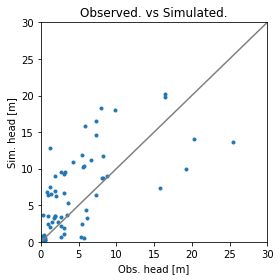

Error is - 8.427226750907518
Params are - [ 4.60792268 21.95635764  5.66153026  0.93281637  0.31554612  1.21344566]


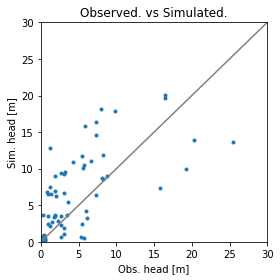

Error is - 8.42714867392923
Params are - [ 4.61660218 21.33154017  5.36886973  0.95516655  0.31754334  1.24118695]


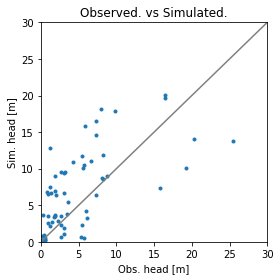

Error is - 8.427218596565442
Params are - [ 4.58885257 21.15643697  5.21095178  0.9709778   0.31694205  1.26010902]


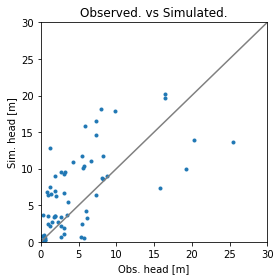

Error is - 8.427141608528405
Params are - [ 4.62201913 21.62056648  5.52796679  0.94184422  0.31698229  1.22487083]


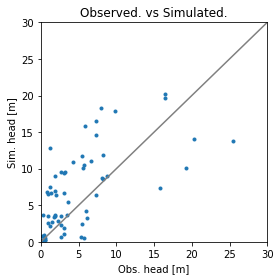

Error is - 8.427203119714507
Params are - [ 4.57215579 21.53177393  5.24697611  0.96964412  0.31703447  1.25756058]


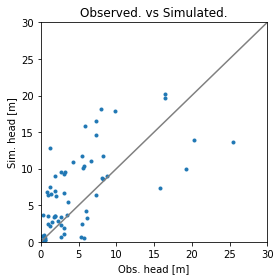

Error is - 8.427141644701972
Params are - [ 4.62516396 21.47426558  5.49689575  0.94408184  0.31695089  1.2278696 ]


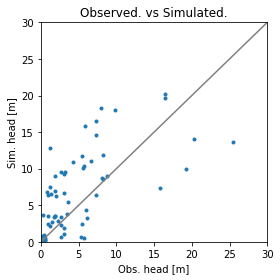

Error is - 8.42716865467762
Params are - [ 4.59160547 21.08747231  5.75706261  0.91764058  0.3168106   1.19844745]


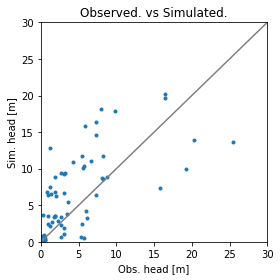

Error is - 8.427216212362149
Params are - [ 4.6595831  20.92088617  5.59487966  0.93046375  0.31728657  1.21353485]


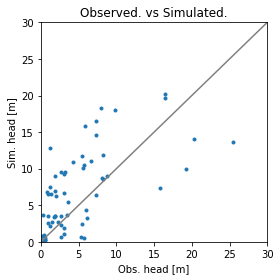

Error is - 8.427137467570468
Params are - [ 4.58848805 21.53645433  5.48135313  0.94685085  0.31682346  1.23104565]


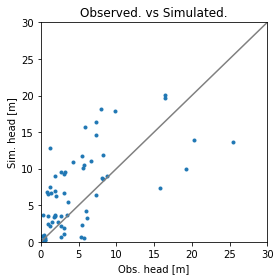

Error is - 8.42717592896335
Params are - [ 4.63172819 21.72471825  5.18942484  0.97487314  0.31714935  1.26283606]


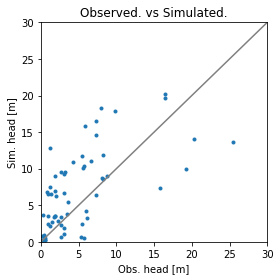

Error is - 8.427140138002612
Params are - [ 4.60163615 21.24678379  5.61515317  0.93194872  0.31689529  1.2145446 ]


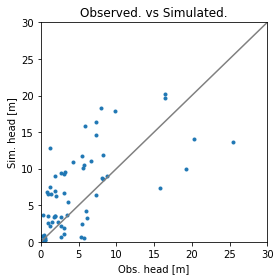

Error is - 8.427150497534639
Params are - [ 4.57218484 21.69242224  5.63303006  0.93251473  0.31748915  1.21409268]


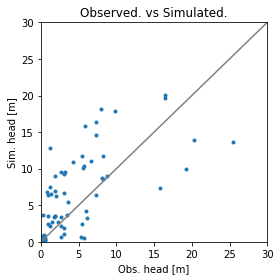

Error is - 8.427147593924278
Params are - [ 4.6297411  21.64512127  5.46559393  0.94752436  0.31722519  1.23135523]


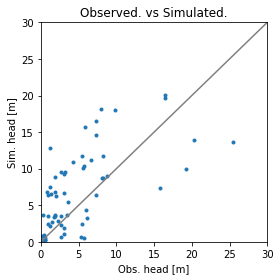

Error is - 8.427176571770488
Params are - [ 4.65569868 21.25915496  5.35224744  0.95662411  0.31665101  1.24286494]


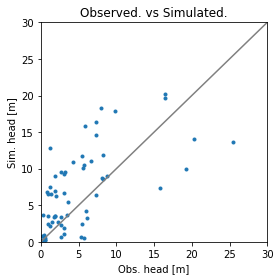

Error is - 8.427132976883883
Params are - [ 4.5930633  21.58410542  5.56283441  0.93854208  0.31727961  1.22128575]


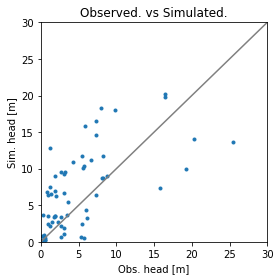

Error is - 8.427159774046341
Params are - [ 4.60343504 21.70422545  5.68106266  0.9284308   0.3165089   1.20913693]


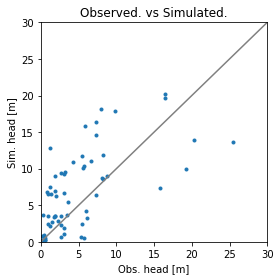

Error is - 8.427134197392613
Params are - [ 4.6133104  21.42471149  5.44691796  0.94848261  0.31728473  1.23317445]


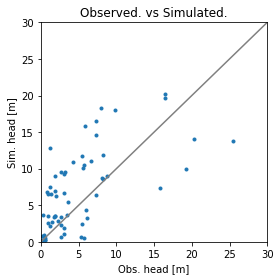

Error is - 8.427148454359552
Params are - [ 4.58481923 21.31717443  5.57811314  0.93639242  0.3168469   1.21957507]


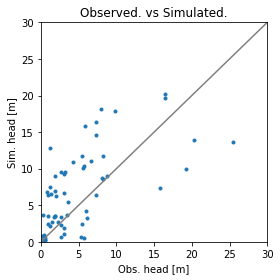

Error is - 8.427134892618396
Params are - [ 4.61851063 21.56313456  5.49372373  0.94474137  0.31713062  1.22841019]


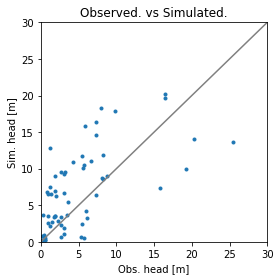

Error is - 8.427132199173295
Params are - [ 4.58717859 21.51765311  5.54575398  0.94005477  0.31718111  1.22324089]


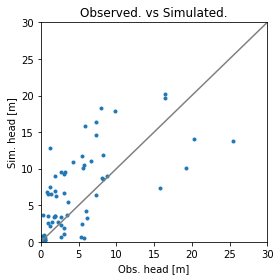

Error is - 8.427148875347443
Params are - [ 4.56818591 21.53934688  5.5701831   0.93804124  0.31729622  1.22092653]


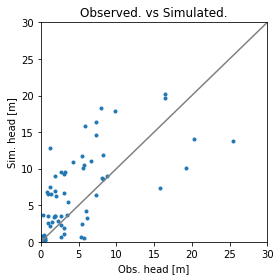

Error is - 8.427148066842594
Params are - [ 4.57870991 21.33704776  5.520612    0.94169592  0.31721599  1.22569635]


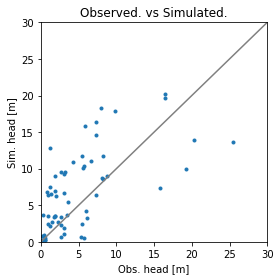

Error is - 8.427131730067748
Params are - [ 4.61119182 21.5496868   5.52612809  0.94180714  0.31704071  1.22507721]


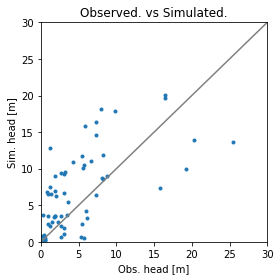

Error is - 8.427136668867458
Params are - [ 4.60227812 21.81179811  5.4037506   0.95487756  0.31735146  1.23953344]


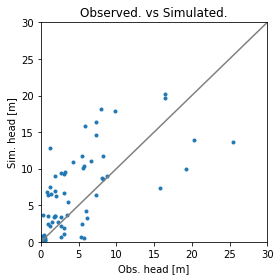

Error is - 8.42714825079295
Params are - [ 4.6200229  21.61390884  5.51168313  0.942651    0.31759928  1.22586165]


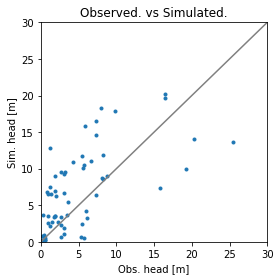

Error is - 8.427129904890272
Params are - [ 4.59637176 21.55581796  5.48893563  0.94580088  0.31701742  1.22974965]


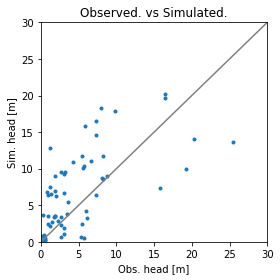

Error is - 8.427139351637242
Params are - [ 4.60426405 21.25323834  5.61768067  0.93159873  0.31695994  1.2141126 ]


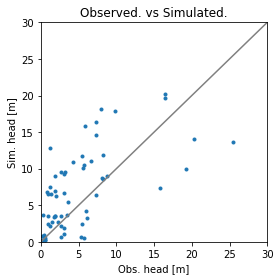

Error is - 8.427130617694916
Params are - [ 4.6027746  21.67215817  5.45723312  0.94905785  0.31725358  1.23317823]


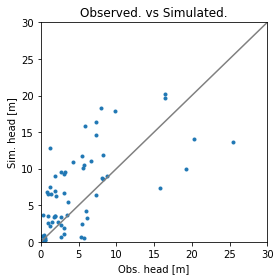

Error is - 8.427137681564867
Params are - [ 4.58278619 21.53824309  5.515544    0.94317374  0.31722177  1.2268252 ]


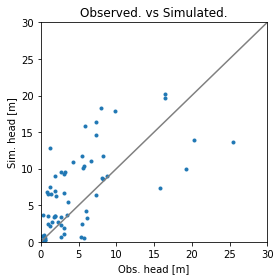

Error is - 8.427130170771143
Params are - [ 4.60957952 21.55691169  5.4991788   0.94434946  0.31715341  1.22801394]


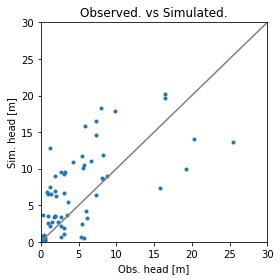

Error is - 8.427134895875648
Params are - [ 4.5867428  21.72073289  5.57977004  0.93805478  0.31702388  1.22034077]


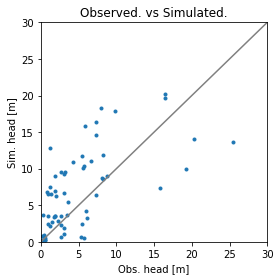

Error is - 8.427130263880763
Params are - [ 4.6066685  21.49871684  5.48013098  0.94587566  0.31721952  1.22996603]


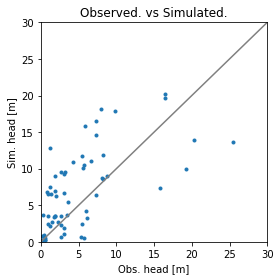

Error is - 8.427129020790993
Params are - [ 4.61152497 21.5328761   5.43628579  0.95043985  0.31700897  1.2351229 ]


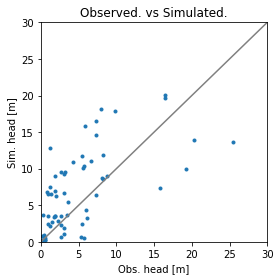

Error is - 8.42713434971382
Params are - [ 4.6207558  21.50726144  5.37301149  0.95638873  0.31687365  1.24204148]


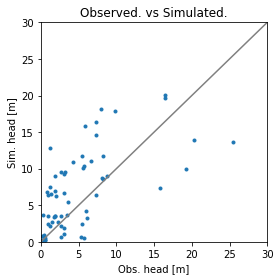

Error is - 8.427141350109446
Params are - [ 4.62552513 21.60440274  5.41687683  0.95238884  0.31705009  1.23712843]


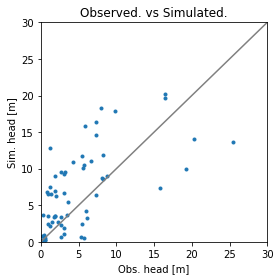

Error is - 8.427128552459752
Params are - [ 4.59676523 21.53934052  5.51353469  0.94313829  0.31714835  1.22671277]


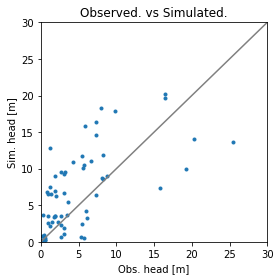

Error is - 8.42713159298874
Params are - [ 4.59670304 21.56892029  5.43230491  0.95108019  0.31722637  1.2358373 ]


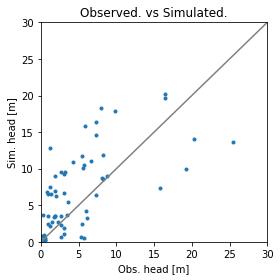

Error is - 8.427129378798288
Params are - [ 4.60032523 21.56411192  5.45576071  0.94876193  0.31717996  1.23314728]


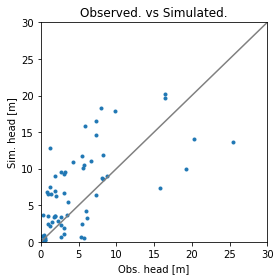

Error is - 8.427129248435513
Params are - [ 4.6043038  21.41043351  5.50070908  0.94373084  0.31698896  1.22772596]


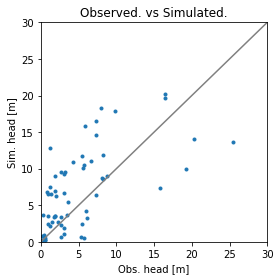

Error is - 8.427127777249197
Params are - [ 4.59962167 21.55444706  5.48467058  0.94619809  0.31694617  1.23019147]


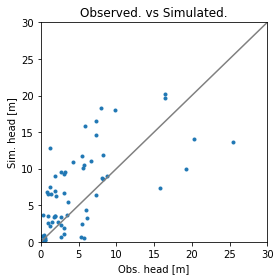

Error is - 8.427129410716104
Params are - [ 4.59609826 21.58231216  5.48694038  0.94635931  0.3168095   1.2303042 ]


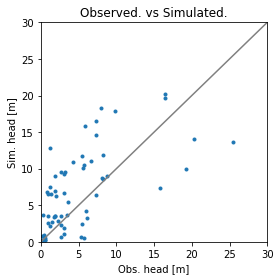

Error is - 8.427132204984293
Params are - [ 4.59339137 21.49543066  5.4607867   0.9483405   0.3169432   1.23286941]


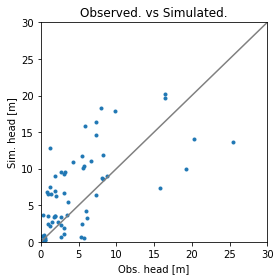

Error is - 8.42712839972209
Params are - [ 4.60553248 21.54154143  5.48958077  0.94534722  0.31710086  1.22922781]


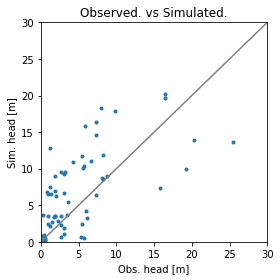

Error is - 8.427127495540178
Params are - [ 4.6096527  21.49176556  5.47124492  0.94673786  0.317107    1.23095975]


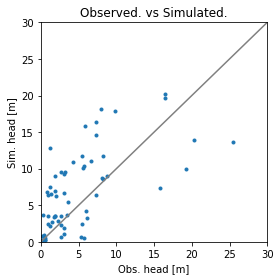

Error is - 8.427129126305632
Params are - [ 4.61629317 21.45973936  5.46239956  0.94720634  0.3171518   1.23156479]


 final_simplex: (array([[ 4.6096527 , 21.49176556,  5.47124492,  0.94673786,  0.317107  ,
         1.23095975],
       [ 4.59962167, 21.55444706,  5.48467058,  0.94619809,  0.31694617,
         1.23019147],
       [ 4.60553248, 21.54154143,  5.48958077,  0.94534722,  0.31710086,
         1.22922781],
       [ 4.59676523, 21.53934052,  5.51353469,  0.94313829,  0.31714835,
         1.22671277],
       [ 4.61152497, 21.5328761 ,  5.43628579,  0.95043985,  0.31700897,
         1.2351229 ],
       [ 4.6043038 , 21.41043351,  5.50070908,  0.94373084,  0.31698896,
         1.22772596],
       [ 4.60032523, 21.56411192,  5.45576071,  0.94876193,  0.31717996,
         1.23314728]]), array([8.4271275 , 8.42712778, 8.4271284 , 8.42712855, 8.42712902,
       8.42712925, 8.42712938]))
           fun: 8.427127495540178
       message: 'Optimization terminated successfully.'
          nfev: 673
           nit: 421
        status: 0
       success: True
             x: array([ 4.6096527 , 21.49176556

In [273]:
# run optimization 
optimized_flag = True
results = opt.minimize(calibrateo, x0= [100, 100, 10, .5, .5, .5], method="Nelder-Mead",tol = 0.1)
results

# Utilities 

### Write a KML file from a projected shapefile 

In [15]:
def poly_shp_to_kml(IN_SHP, OUT_KML, colorstring = "50ff0000"):
    
    tmp = geopandas.GeoDataFrame.from_file(IN_SHP)
    tmpWGS84 = tmp.to_crs({'proj':'longlat', 'ellps':'WGS84', 'datum':'WGS84'})
    tmpWGS84.to_file("{}_temp.shp".format(OUT_KML))   
    
    kml = simplekml.Kml(open=1)       # create the kml file
    pfol = kml.newfolder(name="folder")
    openShape = ogr.Open("{}_temp.shp".format(OUT_KML))

    layers = openShape.GetLayerByIndex(0)
    i = 0
    for element in layers:
        geom = loads(element.GetGeometryRef().ExportToWkb())
        i=i+1
        arrcoords = geom.to_wkt()
        pol = pfol.newpolygon() # the part that creates the kml
        pol.visibility = 50
        pol.style.polystyle.color = colorstring     # 'hexadecimal color string'
        pol.altitudemode = 'relativeToGround'
        pol.extrude = 1
        coords = arrcoords.replace('POLYGON','').replace('(','').replace(')','')
        coords = coords.replace('MULTI','')
        coords = coords.split(',')
        asize = 1
        pol.outerboundaryis = ([(float(coords[j].split()[0]),float(coords[j].split()[1]),asize) for j in range(len(coords))])

    kml.save(OUT_KML)  # save the kml

In [16]:
# Implement     (long run time with small grids)
poly_shp_to_kml(os.path.join(workspace, 'Model_polyarea.shp'),  os.path.join(figurespace, 'Model_grid2.kml') )

### Make Goog-earth point kmls of the Obs Sim and Residuals 

In [22]:
out_obs_frame = pd.read_csv(os.path.join(workspace, '{}.hob.out'.format(modelname)), sep = "  ", names  = ['Sim_val', 'Obs_val', 'name', 'trash'], skiprows =1, engine='python')
del out_obs_frame['trash']
out_obs_frame = out_obs_frame.merge(Unique_WLs, on ='name', how='inner' )
out_obs_frame['residual'] = out_obs_frame['Sim_val'] - out_obs_frame['Obs_val']

paramaters_list = ['Obs_val', 'Sim_val', 'residual']
colors_list =     ['ff00ff00', 'ffff0000', 'ff0000ff']

def Point_to_kml(paramaters_list, colors_list):

    for idx, val in enumerate(paramaters_list):
        parameter =  val                                                                                     
        p_mean = out_obs_frame[parameter].mean()                                                                      # used for scaling the symbols
        kml = simplekml.Kml()
        for index, row in out_obs_frame.iterrows():                                                                   # iterate over each row
            pnt = kml.newpoint(name=str(round(row[parameter],2)), coords=[( row["Lon"],row["Lat"])])   # change name to row["Sample ID"]  to display just sample id names   
            pnt.iconstyle.icon.href = 'http://maps.google.com/mapfiles/kml/shapes/road_shield3.png'                 # see http://kml4earth.appspot.com/icons.html   for options of symbols
            pnt.iconstyle.color = '70ffffff'                                                                        # Hex color   note forst two digits are transparency last six are the normal hex color digits, see https://www.colorhexa.com/                                     
            pnt.iconstyle.scale = .5                                                                     # apply scaling
            pnt.style.labelstyle.color =  colors_list[idx]    
        kml.save(path = os.path.join(figurespace, "sim_v_obs_{}.kml".format(parameter)))                               # save the kml

In [24]:
# Implement
Point_to_kml(paramaters_list, colors_list)

### Make Goog-earth overlay kmls of the array inputs

In [941]:
###### Write a KML overlay from a numpy array input to the model  ######
    
def nparray_to_kml(input_array, out_name, ncol=ncol, nrow=nrow, xll=xll, yll=yll, cellsize = np.mean([delc, delr]), cmap = plt.cm.jet, **kw):
    
    from osgeo import gdal, osr
    from mpl_toolkits.basemap import Basemap
    from simplekml import (Kml, OverlayXY, ScreenXY, Units, RotationXY, AltitudeMode, Camera)

# turn the numpy array into an asc raster in UTM zone 2S
    the_asc = os.path.join(figurespace, "{}.asc".format(out_name))
    np.savetxt(the_asc, input_array)

    new_first = ('NCOLS {}\n'                        # these are the parameters for the .asc file
                 'NROWS {}\n'
                 'XLLCENTER {}\n'
                 'YLLCENTER {}\n'
                 'CELLSIZE {}\n'
                 'NODATA_value -999.0\n'.format(ncol,nrow, xll, yll, np.mean([delc, delr]) ))  

    with open(the_asc, 'r+') as file:                # add in new first line and save file  
        file_data = file.read()
        file. seek(0, 0)
        file. write(new_first + '\n' + file_data)
        
        
# turn the new .asc file into a geo-tiff 
    the_tif = os.path.join(figurespace, "{}.tif".format(out_name))
    in_raster = gdal.Open(the_asc)
    gdal.Warp(the_tif ,in_raster, srcSRS='EPSG:{}'.format(model_epsg), dstSRS='EPSG:4326')
    
    
    
# plotting function to plot and format the tif into a Gearth image that doesnt look like crap
    # Note This plotting function is clunky and not very good, but it is the best example I could find so far, probably should do better
    # One of its main issues is that it reads the data upside down and it needs to be flipped with a command, obviously something is wrong
    # from https://gis.stackexchange.com/questions/184727/plotting-raster-maps-in-python
    
    the_png = os.path.join(figurespace, "{}.png".format(out_name))

    ds = gdal.Open(the_tif)              # tif file in
    data = ds.ReadAsArray()

    data = np.flipud(data)    # this is where that sketchy data flip happens

    gt = ds.GetGeoTransform()   
    proj = ds.GetProjection()

    xres = gt[1]
    yres = gt[5]
    xmin = gt[0] + xres * 0.5
    xmax = gt[0] + (xres * ds.RasterXSize) - xres * 0.5
    ymin = gt[3] + (yres * ds.RasterYSize) + yres * 0.5
    ymax = gt[3] - yres * 0.5
    x_center=(xmin+xmax)/2
    y_center=(ymin+ymax)/2  

    m = Basemap(llcrnrlon=xmin,llcrnrlat=ymin,urcrnrlon=xmax,urcrnrlat=ymax, projection='merc', lat_0 = y_center, lon_0 = x_center)
    x = np.linspace(0, m.urcrnrx, data.shape[1])
    y = np.linspace(0, m.urcrnry, data.shape[0])
    xx, yy = np.meshgrid(x, y)

    # create the igure object scaled for google earth   from https://ocefpaf.github.io/python4oceanographers/blog/2014/03/10/gearth/
    aspect = np.cos(np.mean([ymin, ymax]) * np.pi/180.0)
    xsize = np.ptp([xmax, xmin]) * aspect
    ysize = np.ptp([ymax, ymin])
    aspect = ysize / xsize

    if aspect > 1.0:
        figsize = (10.0 / aspect, 10.0)
    else:
        figsize = (10.0, 10.0 * aspect)

    if False:

        plt.ioff()  # Make `True` to prevent the KML components from poping-up.
    fig = plt.figure(figsize=figsize,
                     frameon=False,
                     dpi=1024//10)
    # KML friendly image.  If using basemap try: `fix_aspect=False`.
    ax = fig.add_axes([0, 0, 1, 1])
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    cs = m.pcolormesh(xx, yy, data, cmap=cmap) # alpha = .9)                              
    fig.savefig(the_png,  transparent=False, format='png', dpi=600)  
    

# this is the save KML overlay part, there are some options in here that can be changed for visualization stuff
    # from https://ocefpaf.github.io/python4oceanographers/blog/2014/03/10/gearth/
    
    the_kml = os.path.join(figurespace, "{}.kmz".format(out_name))
    
    kml = Kml()
    altitude = kw.pop('altitude', 2e4)
    roll = kw.pop('roll', 0)
    tilt = kw.pop('tilt', 0)
    altitudemode = kw.pop('altitudemode', AltitudeMode.relativetoground)
    camera = Camera(latitude=np.mean([ymax, ymin]),
                    longitude=np.mean([xmax, xmin]),
                    altitude=altitude, roll=roll, tilt=tilt,
                    altitudemode=altitudemode)

    kml.document.camera = camera
    draworder = 0
    for fig in [the_png]:  # NOTE: Overlays are limited to the same bbox.
        draworder += 1
        ground = kml.newgroundoverlay(name='GroundOverlay')
        ground.draworder = draworder
        ground.visibility = kw.pop('visibility', 1)
        ground.name = kw.pop('name', 'overlay')
        ground.color = kw.pop('color', '9effffff')
        ground.atomauthor = kw.pop('author', 'ocefpaf')
        ground.latlonbox.rotation = kw.pop('rotation', 0)
        ground.description = kw.pop('description', 'Matplotlib figure')
        ground.gxaltitudemode = kw.pop('gxaltitudemode',
                                       'clampToSeaFloor')
        ground.icon.href = fig
        ground.latlonbox.east = xmin
        ground.latlonbox.south = ymin
        ground.latlonbox.north = ymax
        ground.latlonbox.west = xmax

    # now make a legend for the kml file 
    the_ledg = os.path.join(figurespace, "legend_{}.png".format(out_name))
    
    fig = plt.figure(figsize=(1.5, 4.0), facecolor=None, frameon=False)
    ax = fig.add_axes([0.0, 0.05, 0.2, 0.9])
    cb = fig.colorbar(cs, cax=ax)
    cb.set_label(out_name, rotation=-90, color='k', labelpad=20)
    fig.savefig(the_ledg, transparent=True, format='png')  # Change transparent to True if your colorbar is not on space :)

    screen = kml.newscreenoverlay(name='ScreenOverlay')
    screen.icon.href = the_ledg
    screen.overlayxy = OverlayXY(x=0, y=0,
                                 xunits=Units.fraction,
                                 yunits=Units.fraction)
    screen.screenxy = ScreenXY(x=0.015, y=0.075,
                               xunits=Units.fraction,
                               yunits=Units.fraction)
    screen.rotationXY = RotationXY(x=0.5, y=0.5,
                                   xunits=Units.fraction,
                                   yunits=Units.fraction)
    screen.size.x = 0
    screen.size.y = 0
    screen.size.xunits = Units.fraction
    screen.size.yunits = Units.fraction
    screen.visibility = 1

    kmzfile = kw.pop('kmzfile', the_kml) 
    kml.savekmz(the_kml)   

    
# note here are soome mappings that might be useful for this function 
#   xmin,        ymin,        xmax,         ymax
# llcrnrlon,   llcrnrlat,   urcrnrlon,   urcrnrlat 

# reproject existing asc raster to a new coordinate system, not used currently but is part of the above function
#def asc_to_prj_tiff(input_asc, output_tiff, ncol=ncol, nrow=nrow, xll=xll, yll=yll, cellsize = np.mean([delc, delr])):
#    in_raster = gdal.Open(input_asc)
#    gdal.Warp(output_tiff ,in_raster, srcSRS='EPSG:{}'.format(model_epsg), dstSRS='EPSG:4326') 

C:\Users\cshuler\Anaconda3\envs\ASPA_Framework\lib\site-packages\ipykernel_launcher.py:57: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


<IPython.core.display.Javascript object>


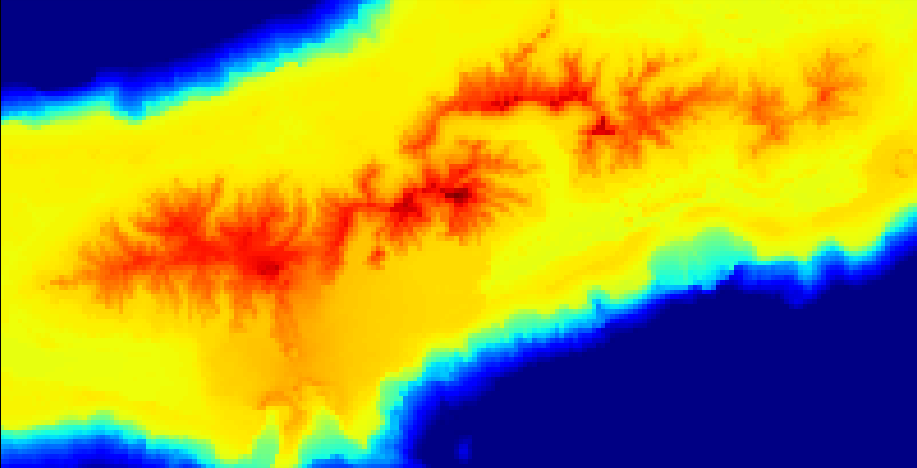

<IPython.core.display.Javascript object>


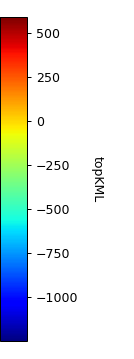

<IPython.core.display.Javascript object>


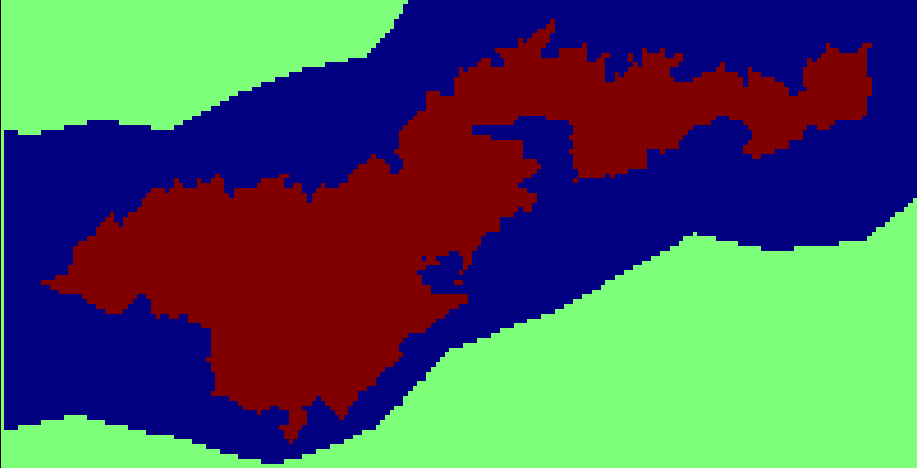

<IPython.core.display.Javascript object>


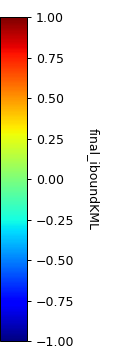

<IPython.core.display.Javascript object>


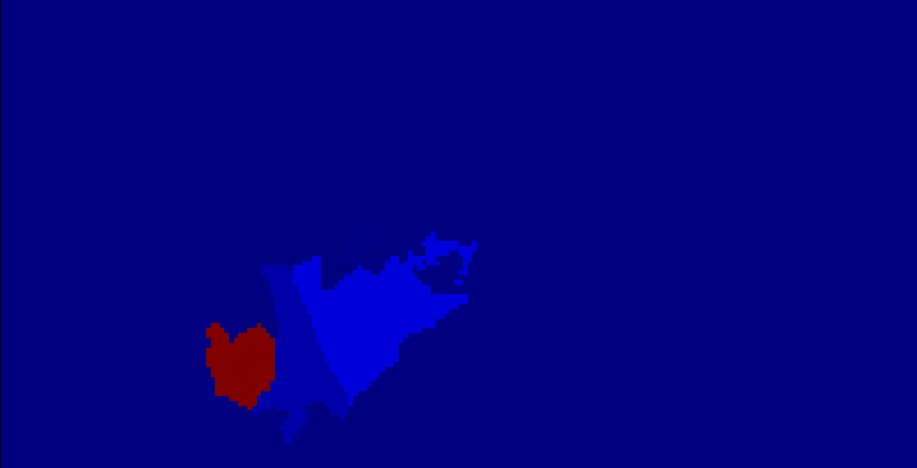

<IPython.core.display.Javascript object>


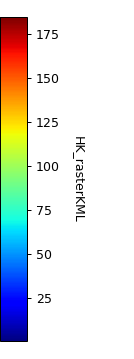

<IPython.core.display.Javascript object>


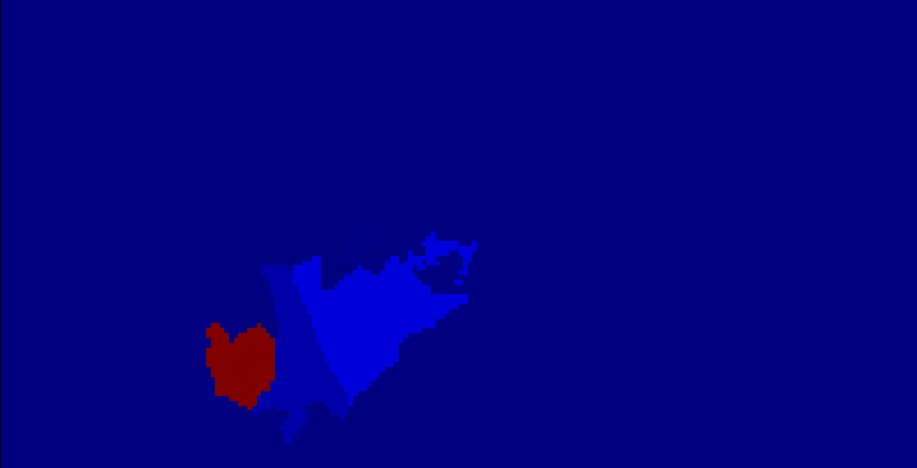

<IPython.core.display.Javascript object>


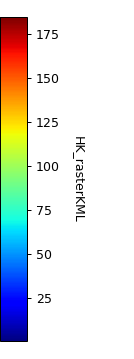

<IPython.core.display.Javascript object>


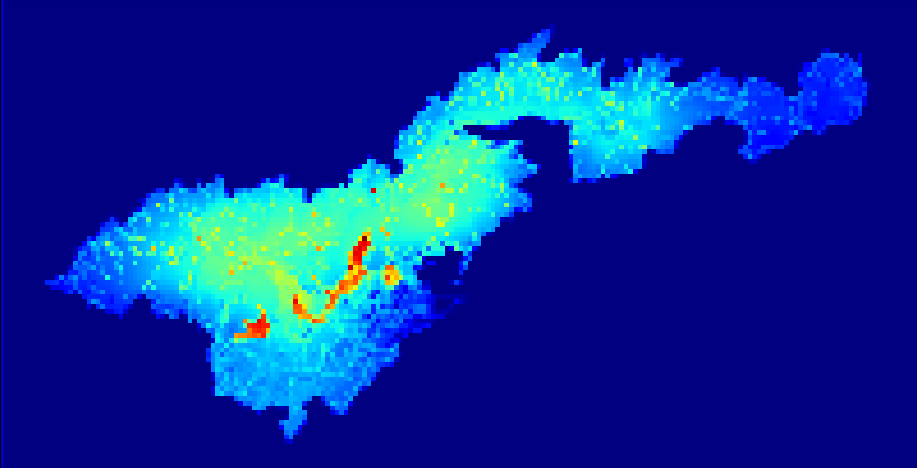

<IPython.core.display.Javascript object>


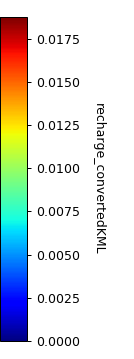

<IPython.core.display.Javascript object>


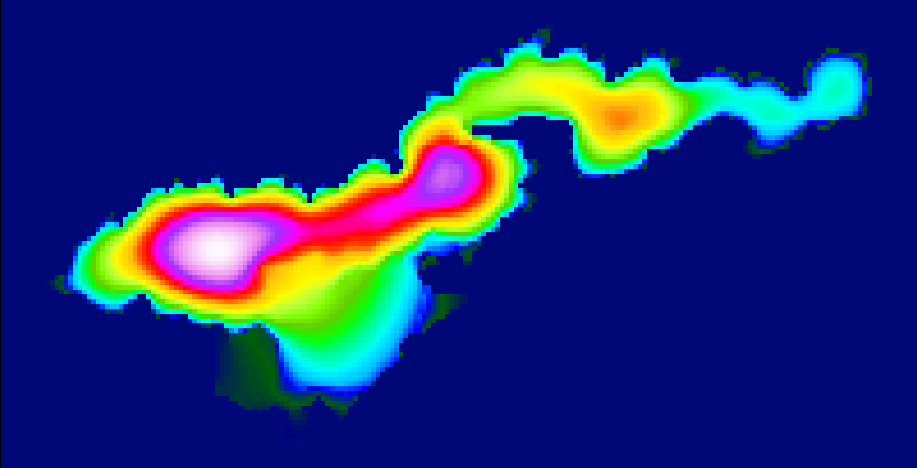

<IPython.core.display.Javascript object>


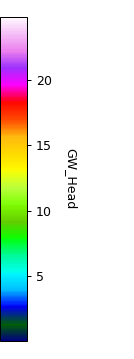

In [942]:
# Implement

# Inputs
nparray_to_kml(top, "topKML")
nparray_to_kml(final_ibound, "final_iboundKML")
nparray_to_kml(HK_raster, "HK_rasterKML")
nparray_to_kml(HK_raster, "HK_rasterKML")
nparray_to_kml(recharge_converted, "recharge_convertedKML")

# outputs
head_plot = head[0]
head_plot = np.where(head_plot < 0, .1, head_plot) # force top elevations to always be higher than bottom elevations
nparray_to_kml(head_plot, "GW_Head", cmap = 'gist_ncar')

## To GMS utilities

Note: to display model in GMS: 
- 1) open up .nam file in GMS. 
- 2) import into GMS with appropriate modflow version (2005 at the moment)
- 3) Open up a coastline shapefile (e.g. tut_poly.shp) in GMS to make sure that it projects correctly, it will prompt to set the display projection
- 4) select 'UTM,  Zone: -2 (174°W - 168°W - Southern Hemisphere), WGS84, meters'
- 5) go to edit -> Transform
- 6) use translate and input value from xll variable (515244.0) and value from yll  (8410178)

In [ ]:
# this is just a little code to export a observation value file for use in GMS. Note to use neeed to open a concept model and obs coverage in GMS then import the OBS_for_GMS_import.csv into that obs coverage.  (dont for get to check heading row)
OBS_4_GMS = Unique_WLs[['x_utm', 'y_utm', 'WL_m_MSL']]
OBS_4_GMS.to_csv(os.path.join(workspace, "OBS_for_GMS_import.csv"))

# Numpy array convert to .asc file

In [85]:
# take a numpy array from this model and turn it into a .asc raster based on the model geometry dimensions
def nparray_to_asc(input_array, output_raster, ncol=ncol,nrow=nrow, xll=xll, yll=yll, cellsize = np.mean([delc, delr])):

    np.savetxt(output_raster, input_array)

    new_first = ('NCOLS {}\n'                        # these are the parameters for the .asc file
                 'NROWS {}\n'
                 'XLLCENTER {}\n'
                 'YLLCENTER {}\n'
                 'CELLSIZE {}\n'
                 'NODATA_value -999.0\n'.format(ncol,nrow, xll, yll, np.mean([delc, delr]) ))  

    with open(output_raster, 'r+') as file:                # add in new first line and save file  
        file_data = file.read()
        file. seek(0, 0)
        file. write(new_first + '\n' + file_data)

In [3]:
# currently not used functions 

# sometimes Flopy is annoying and prints too much stuff. This function hides printouts   to use just so somenthing in an indented block under "with HiddenPrints():"
class HiddenPrints:
    def __enter__(self):
        self._original_stdout = sys.stdout
        sys.stdout = open(os.devnull, 'w')

    def __exit__(self, exc_type, exc_val, exc_tb):
        sys.stdout.close()
        sys.stdout = self._original_stdout